# Let's Begin

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from astropy.io import fits,ascii
from astropy.wcs import WCS
from astropy.table import Table, QTable
import matplotlib.pyplot as pl
import matplotlib.colors as mc
import matplotlib.collections as mcoll
from scipy.interpolate import NearestNDInterpolator
from scipy.stats import norm
from scipy.optimize import linprog

from numpy import linspace, array, logspace, sin, cos, pi, arange, sqrt, arctan2, arccos
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
from coords import *
from adjustText import adjust_text
import matplotlib.patheffects as PathEffects
from astropy.coordinates import Angle
import astropy.units as u
import cmasher as cmr



import lmfit
from lmfit import minimize, Parameters,create_params,fit_report
from matplotlib.collections import LineCollection


from collections import Counter
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler
from sklearn.neighbors import NearestNeighbors


In [2]:
plt.style.use('classic')
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.weight"] = "bold"
plt.rcParams["font.size"] = "16"
plt.rcParams["axes.labelweight"] = "bold"
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"

    

def rotate(x,y,theta):
    xprime = x*cos(theta) - y*sin(theta)
    yprime = x*sin(theta) + y*cos(theta)
    return xprime, yprime

l_offset = np.radians(-0.0558)
b_offset = np.radians(-0.0462)
x_offset = Rsun*l_offset
y_offset = Rsun*b_offset

#############################
# create class that stores a ring
#############################

class Ring:

    def __init__(self,t,a,bb,z,v0,theta,xyzsun,vxyzsun,alpha):
        self.t     = t
        self.a     = a
        self.bb     = bb
        self.z0    = z
        self.v0    = v0
        self.theta = theta
        self.alpha = alpha
        self.x     = a*cos(t)
        self.y     = -bb*sin(t)
        self.z     = self.z0*sin(-2*t + self.alpha)
        self.R     = sqrt(self.x**2+self.y**2)
        self.phi   = -arctan2(self.y,self.x)
        self.ephix = -sin(self.phi) # unit vector parallel to circle
        self.ephiy = -cos(self.phi) # unit vector parallel to circle
        norm       = sqrt((a*sin(t))**2+(bb*cos(t))**2)
        self.ex    = -a*sin(t)/norm # unit vector parellel to ellipse
        self.ey    = -bb*cos(t)/norm  # unit vector parallel to ellipse
        self.cosalpha = self.ex*self.ephix + self.ey*self.ephiy
        self.vphi  = self.R[0]*self.v0/self.R # assume conservation of angular momentum
        self.v     = self.vphi/self.cosalpha # total speed along the orbit
        self.vx    = +self.v*self.ex
        self.vy    = +self.v*self.ey
        self.vz    = np.zeros(t.size)
        self.x,self.y   = rotate(self.x,self.y,theta)
        self.vx,self.vy = rotate(self.vx,self.vy,theta)
        self.X,self.Y,self.Z,self.vX,self.Vy,self.vZ = xyz2XYZ(self.x,self.y,self.z,self.vx,self.vy,self.vz,xyzsun[0],xyzsun[1],xyzsun[2],vxyzsun[0],vxyzsun[1],vxyzsun[2])
        # Convert Sgr A* offset from degrees to radians
        l_offset = np.radians(0.0558)
        b_offset = np.radians(-0.0462)
        x_offset = Rsun*l_offset
        y_offset = 0
        z_offset = Rsun*b_offset
        # Calculate galactic coordinates accounting for Sgr A* offset
        self.l,self.b,self.r,self.vl,self.vb,self.vr = xyz2lbr(
            self.x,self.y,self.z,self.vx,self.vy,self.vz,
            xyzsun[0],xyzsun[1],xyzsun[2],vxyzsun[0],vxyzsun[1],vxyzsun[2])
        self.l += l_offset
        self.b += b_offset
        self.x += x_offset
        self.y += y_offset
        self.z += z_offset
        self.mu_l, self.mu_b = vlb_2_mulb(self.r, self.vl*100, self.vb*100)
        self.mu_l, self.mu_b = vlb_2_mulb(self.r,self.vl*100,self.vb*100)

        
#############################
# define sun position & velocity
#############################

xsun  = 0.0
ysun  = -8.2
zsun  = 0.0
vxsun = -2.2
vysun = 0.0
vzsun = 0.0
xyzsun  = [xsun, ysun, zsun ]
vxyzsun = [vxsun,vysun,vzsun]
phisun  = arctan2(ysun,xsun)



In [3]:
def lb_lv_plots(Rings):
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 8))
    fig.set_facecolor('white')
    ax[0].set_facecolor('white')

    ### Scatter cloud points in lbv ###
    color_list = ['blue', 'cyan', 'gray' ,'mistyrose', 'red']
    cmap = (mpl.colors.ListedColormap(color_list))


    back_ind = np.where(Rings.y>=y_offset)
    fore_ind = np.where(Rings.y<=y_offset)
    


    ### Plot Rings LB ###
    ax[0].plot(np.degrees(Rings.l[back_ind[0:-1]]),np.degrees(Rings.b[back_ind[0:-1]]),c='red')
    ax[0].plot(np.degrees(Rings.l[fore_ind[0:]]),np.degrees(Rings.b[fore_ind[0:]]),c='blue', linewidth=2, zorder=2)

    for i in range(0,len(plot_cat_agg)):
        
        if plot_cat_agg['leaf_id'][i] not in cat_agg['leaf_id']:
            marker = 'X'
            alpha = 0.5
        else:
            marker = 'o'
            alpha =1.

        if plot_cat_agg['NF_decision'][i] == 'N':
            ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, c=color_list[0], s=120 , alpha = alpha)
        if plot_cat_agg['NF_decision'][i] == 'LN':
            ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, c=color_list[1], s=120, alpha = alpha)
        if plot_cat_agg['NF_decision'][i] == 'U':
            ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, c=color_list[2], s=120, alpha = alpha)
        if plot_cat_agg['NF_decision'][i] == 'LF':
            ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, c=color_list[3], s=120, alpha = alpha)
        if plot_cat_agg['NF_decision'][i] == 'F':
            ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, c=color_list[4], s=120, alpha = alpha)
        if plot_cat_agg['NF_decision'][i] == 'nan':
            ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, s=150, edgecolor='gray', zorder=3, c='k', alpha = alpha)


    ax[0].set_xlabel('longitude [deg]', labelpad=20)
    ax[0].set_ylabel('latitude [deg]', labelpad=10)
    ax[0].set_xlim(1.8,-1.)
    ax[0].set_ylim(-0.3,0.1)


    ### Plot Rings LV ###
    ax[1].plot(np.degrees(Rings.l[back_ind[0:-1]]),Rings.vr[back_ind[0:-1]],c='red')
    ax[1].plot(np.degrees(Rings.l[fore_ind[0:]]),Rings.vr[fore_ind[0:]],c='blue', linewidth=2, zorder=2)

    for i in range(0,len(plot_tab)):
        
        if plot_tab['leaf_id'][i] not in cat_tab['leaf_id']:
            marker = 'X'
            alpha = 0.5
        else:
            marker = 'o'
            alpha = 1.

        if plot_tab['NF_decision'][i] == 'N':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, c=color_list[0], s=120, alpha = alpha)
        if plot_tab['NF_decision'][i] == 'LN':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, c=color_list[1], s=120, alpha = alpha)
        if plot_tab['NF_decision'][i] == 'U':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, c=color_list[2], s=120, alpha = alpha)
        if plot_tab['NF_decision'][i] == 'LF':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, c=color_list[3], s=120, alpha = alpha)
        if plot_tab['NF_decision'][i] == 'F':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, c=color_list[4], s=120, alpha = alpha)
        if plot_tab['NF_decision'][i] == 'nan':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, s=150, edgecolor='gray', zorder=3, c='k', alpha = alpha)






    ax[1].set_xlabel('longitude [deg]', labelpad=20)
    ax[1].set_ylabel('velocity [km/s]', labelpad=10)
    ax[1].set_xlim(1.8,-1.)
    ax[1].set_ylim(-150,150)
    
    
    ax[0].text(.8, 1.10, 'a = {:.3f}, b = {:.3f}, z = {:.3f}, v0 = {:.2f}, theta_deg = {:.1f}, red_chisq = {:.2f}'.format(Rings.a,Rings.bb,Rings.z0, Rings.v0, np.degrees(Rings.theta),out.redchi), fontsize=20, ha='right', va='top', 
            transform=ax[0].transAxes)
    
    
    plt.show()

    return 

In [4]:
def lb_lv_plots_postcolor(Rings,out):
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 8))
    fig.set_facecolor('white')
    ax[0].set_facecolor('white')

    ### Scatter cloud points in lbv ###
    color_list = ['blue', 'cyan', 'gray' ,'mistyrose', 'red']
    cmap = (mpl.colors.ListedColormap(color_list))


    back_ind = np.where(Rings.y>=y_offset)
    fore_ind = np.where(Rings.y<=y_offset)
    


    ### Plot Rings LB ###
    ax[0].plot(np.degrees(Rings.l[back_ind[0:-1]]),np.degrees(Rings.b[back_ind[0:-1]]),c='red')
    ax[0].plot(np.degrees(Rings.l[fore_ind[0:]]),np.degrees(Rings.b[fore_ind[0:]]),c='blue', linewidth=2, zorder=2)


    divnorm =mc.TwoSlopeNorm(vmin=-1., vcenter=0, vmax=1.)
    #cmap    = cmr.redshift_r
    cmap    = 'bwr_r'
    for i in range(0,len(plot_cat_agg)):

        if plot_cat_agg['leaf_id'][i] not in cat_agg['leaf_id']:
            marker = 'X'
            alpha = 1.
        else:
            marker = 'o'
            alpha =1.
            

        if plot_cat_agg['NF_decision'][i] != 'nan':
            sc = ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, 
                           c=plot_post_tab_agg['mu'][i], s=120, 
                           cmap=cmap, norm=divnorm, alpha = alpha)

        if plot_cat_agg['NF_decision'][i] == 'nan':
            ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, s=150, edgecolor='gray', zorder=3, c='k', alpha = alpha)


    ax[0].set_xlabel('longitude [deg]', labelpad=20)
    ax[0].set_ylabel('latitude [deg]', labelpad=10)
    ax[0].set_xlim(1.8,-1.)
    ax[0].set_ylim(-0.3,0.1)



    ### Plot Rings LV ###
    ax[1].plot(np.degrees(Rings.l[back_ind[0:-1]]),Rings.vr[back_ind[0:-1]],c='red')
    ax[1].plot(np.degrees(Rings.l[fore_ind[0:]]),Rings.vr[fore_ind[0:]],c='blue', linewidth=2, zorder=2)

    for i in range(0,len(plot_tab)):
        
        if plot_tab['leaf_id'][i] not in cat_tab['leaf_id']:
            marker = 'X'
            alpha = 1.
        else:
            marker = 'o'
            alpha = 1.

        if plot_tab['NF_decision'][i] != 'nan':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, 
                      c=plot_post_tab['mu'][i], s=120, 
                      cmap=cmap, norm=divnorm, alpha = alpha)


        if plot_tab['NF_decision'][i] == 'nan':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, s=150, edgecolor='gray', zorder=3, c='k', alpha = alpha)


    ax[1].set_xlabel('longitude [deg]', labelpad=20)
    ax[1].set_ylabel('velocity [km/s]', labelpad=10)
    ax[1].set_xlim(1.8,-1.)
    ax[1].set_ylim(-150,150)
    
    cax = fig.add_axes([0.15, 0.97, 0.73, 0.03])
    cb = plt.colorbar(sc, ax=ax[0], orientation='horizontal', cax=cax)   
    #ax[0].text(.9, 1.4, 'a = {:.3f}, b = {:.3f}, z = {:.3f}, v0 = {:.2f}, theta_deg = {:.1f}, alpha = {:.2f},red_chisq = {:.2f}'.format(Rings.a,Rings.bb,Rings.z0, Rings.v0, np.degrees(Rings.theta),Rings.alpha,out.redchi), fontsize=20, ha='right', va='top', 
    #        transform=ax[0].transAxes)
    
    ax[0].text(.98, 1.4, r'a = %.3f, b = %.3f, z$_{0}$ = %.3f, v$_{0}$ = %.2f, $\theta$ = %.1f, $\alpha$ = %.2f, $\chi^{2}_{\mathrm{red}}$ = %.2f' %(Rings.a,Rings.bb,Rings.z0, Rings.v0, np.degrees(Rings.theta),Rings.alpha, out.redchi), fontsize=20, ha='right', va='top', 
            transform=ax[0].transAxes)
    
    plt.show()

    return 

In [5]:
def load_data(path, sep='\s+', cols=[0,1,2,3],names=['l', 'b', 'v', 'near_far']):
    return pd.read_csv(path, sep=sep, header=None, names=names)
    #lk, bk, vk, NF = data['l'].values, data['b'].values, data['v'].values, data['near_far'].values
    #return data, lk, bk, vk, NF
    #Find near and far point

<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_79340/157986325.py:1: SyntaxWarning: invalid escape sequence '\s'
  def load_data(path, sep='\s+', cols=[0,1,2,3],names=['l', 'b', 'v', 'near_far']):


In [6]:
### create a function that is a continuous distribution between NF on the ring itself
# take the y indices of the ring that are in front of the offset = Near; behind = Far
# values are relative weights in the distribution?
'''def ring_NF_dist_y(Rings):
    back_ind = np.where(Rings.y>y_offset)
    fore_ind = np.where(Rings.y<=y_offset)

    y_NF =  Rings.y.copy()
    y_NF=np.where(Rings.y>y_offset,y_NF,-(Rings.y - np.nanmin(Rings.y[back_ind]) )/ (np.nanmax(Rings.y[back_ind]) - np.nanmin(Rings.y[back_ind])))
    y_NF=np.where(Rings.y<=y_offset,y_NF,(Rings.y - np.nanmax(Rings.y[fore_ind]) )/ (np.nanmin(Rings.y[fore_ind]) - np.nanmax(Rings.y[fore_ind])))
    #y_NF=np.where(Rings.y<y_offset,y_NF,-1)
    #y_NF=np.where(Rings.y>=y_offset,y_NF,1)

    return back_ind, fore_ind, y_NF
'''
def ring_NF_dist_y(Rings):
    back_ind = np.where(Rings.y>y_offset)
    fore_ind = np.where(Rings.y<=y_offset)

    y_NF =  Rings.y.copy()
    y_NF[back_ind] = -(Rings.y[back_ind] - y_offset )/ (Rings.y[back_ind].max() - y_offset)
    y_NF[fore_ind] = 1 - ((Rings.y[fore_ind] - np.nanmin(Rings.y[fore_ind]) )/ (y_offset-np.nanmin(Rings.y[fore_ind])))
    #y_NF=np.where(Rings.y>y_offset,y_NF,-(Rings.y - y_offset )/ (Rings.y[back_ind].max() - y_offset))
    #y_NF=np.where(Rings.y<=y_offset,y_NF,(Rings.y - np.nanmax(Rings.y[fore_ind]) )/ (np.nanmin(Rings.y[fore_ind]) - np.nanmax(Rings.y[fore_ind])))


    return back_ind, fore_ind, y_NF


def ring_NF_dist(Rings):
    back_ind = np.where(Rings.r>=8.2)
    fore_ind = np.where(Rings.r<8.2)

    y_NF =  Rings.r.copy()
    y_NF[back_ind] = -(Rings.r[back_ind] - 8.2 )/ (np.nanmax(Rings.r[back_ind]) - 8.2)
    y_NF[fore_ind] =  1-(Rings.r[fore_ind] - np.nanmin(Rings.r[fore_ind]) )/ (8.2 - np.nanmin(Rings.r[fore_ind]))
    #y_NF=np.where(Rings.y<y_offset,y_NF,-1)
    #y_NF=np.where(Rings.y>=y_offset,y_NF,1)

    return back_ind, fore_ind, y_NF

def calculate_mahalanobis_distances(data, model):
    cov = np.cov(data.T) 
    inv_cov = np.linalg.inv(cov)
    distances = cdist(data, model, metric='mahalanobis', VI=inv_cov)
    return distances, inv_cov


def min_distance_mahalanobis(data, model):

    # compute distances for every point on the stream
    dist, inv_cov = calculate_mahalanobis_distances(data, model)

    # find the minima 
    glob_min_idxs =[]
    for i in range(len(data)):
        glob_min_idxs.append(np.argwhere(dist[i]==np.min(dist[i])).ravel()[0])
    return glob_min_idxs, dist #returns all distance values and minima index

def normalizelbv(l,b,v):
    lmin, lmax = -0.6, 1.7
    bmin, bmax = -0.3, 0.1
    vmin, vmax = -100., 100.
    
    #using approximate extents of the data in l,b,v to normalize between -1 and 1
    norml = 2*((l - lmin) / (lmax - lmin)) -1. 
    normb = 2*((b - bmin) / (bmax - bmin)) -1. 
    normv = 2*((v - vmin) / (vmax - vmin)) -1. 
    
    return norml,normb,normv

def distancelbv(l, b, v, l0, b0, v0):
    #typical Cartesian distance measurement 
    d_l = l - l0
    d_b = b - b0
    d_v = v - v0
    dis = np.sqrt( d_l**2 + d_b**2 + d_v**2)
    return dis


def min_distancelbv(streaml, streamb, streamv, P):
    """
    Compute minimum/a distance/s between
    a point P[x0,y0,z0] and a curve (x,y,z).
    
    Returns min indexes and distances array.
    """
    # compute distances for every point on the stream
    d = distancelbv(streaml, streamb, streamv, P[0], P[1], P[2])

    # find the minima 
    glob_min_idxs = np.argwhere(d==np.min(d)).ravel()
    return glob_min_idxs, d #returns all distance values and minima index


#Gaussian function for the PPDF distributions (used in KNN search)
def gaussian(x, A, mu, sigma):
    return A * np.exp(- (x - mu)**2 / (2.* (sigma**2 )))

#Save normed data as a class
class norm_data:    
    def __init__(self, norml0, normb0, normv0, NF):
        self.l0 = norml0
        self.b0 = normb0
        self.v0 = normv0
        self.NF = NF #Cloud NF is decided from the PPDF centers, already normalized to [-1,1]

In [7]:
Rings_three = Ring(phi,
                  0.09 ,
                  0.055 ,
                  0.0125 ,
                  130 , 
                  np.radians(25 ),
                  xyzsun,vxyzsun,
                  0.4)

back_ind, fore_ind, y_NF=ring_NF_dist_y(Rings_three)
print(Rings_three.y.argmax(),y_NF.argmin(), Rings_three.y[Rings_three.y.argmax()], y_NF[Rings_three.y.argmax()])

print(Rings_three.y.argmin(), y_NF.argmax(),Rings_three.y[Rings_three.y.argmin()], y_NF[Rings_three.y.argmin()])

y_NF[fore_ind].max(), y_NF[back_ind].min()
#y_NF[np.where(Rings_three.y > 0.8*Rings_three.y.min())[0][0]]
#Rings_three.y[Rings_three.y.argmin()-100000], y_NF[Rings_three.y.argmin()-100000], y_offset

NameError: name 'phi' is not defined

In [8]:
def normedr_to_pc(r, A):
    '''takes in a normalized LOS position, r in (-1,1) scaling, 
    as well as a normalization constant A (in pc) that corresponds to the radius of the ellipse.
    returns top-down y value for distance from SgrA* in PARSECS
    
    y < 0 in NEAR, y>0 is FAR
    
    '''
    
    return A*r

# LMFIT time

In [13]:
###Read in data to scatter plot in lbv 
cat_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/synth_table.tex")
post_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/posterior_fits.tex")

##remove the rows with NaN NF decisions 
non_fitting_rows = list(np.where(cat_tab['NF_decision']=='nan')[0])
pixel_masked_rows =  np.where(cat_tab['lb_pixel_mask']==0)[0]

for i in pixel_masked_rows:
    if i not in non_fitting_rows:
        non_fitting_rows.append(i)

#non_fitting_rows.append((np.where(cat_tab['leaf_id']=='12')[0][0]))

non_fitting_rows.append((np.where(cat_tab['leaf_id']=='10')[0][0]))
non_fitting_rows.append((np.where(cat_tab['leaf_id']=='9')[0][0]))
non_fitting_rows.append((np.where(cat_tab['leaf_id']=='13')[0][0]))
non_fitting_rows.append((np.where(cat_tab['leaf_id']=='14')[0][0]))
#non_fitting_rows.append((np.where(cat_tab['leaf_id']=='8b')[0][0]))
#non_fitting_rows.append((np.where(cat_tab['leaf_id']=='8c')[0][0]))
#non_fitting_rows.append((np.where(cat_tab['leaf_id']=='11b')[0][0]))
#non_fitting_rows.append((np.where(cat_tab['leaf_id']=='11c')[0][0]))

post_tab.remove_rows(non_fitting_rows)
cat_tab.remove_rows(non_fitting_rows)

cat_index = cat_tab['leaf_id']
cloud_name = cat_tab['cloud_name']
NF_decision = cat_tab['NF_decision']
lb_pixel_mask = cat_tab['lb_pixel_mask']

#post_A = post_tab['A_MC']
#post_mu = post_tab['mu_MC']
#post_sigma = post_tab['sigma_MC']

post_A = post_tab['A']
post_mu = post_tab['mu']
post_sigma = post_tab['sigma']
post_CI68 = post_tab['CI68']


## aggregate table that pulls out the largest mask
## to represent the l,b N/F/U position

cat_group = cat_tab.group_by('lb_pixel_mask')
cat_group_mask = cat_group.groups.keys['lb_pixel_mask'] == 1

cat_agg = cat_group.groups[cat_group_mask]


## For plotting only
plot_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/synth_table.tex")
plot_cat_group = plot_tab.group_by('lb_pixel_mask')
plot_cat_group_mask = plot_cat_group.groups.keys['lb_pixel_mask'] == 1
plot_cat_agg = plot_cat_group.groups[plot_cat_group_mask]
plot_post_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/posterior_fits.tex")
plot_post_tab_agg = plot_post_tab[np.where(plot_tab['lb_pixel_mask']==1)]



In [14]:
cat_tab

leaf_id,cloud_name,l,b,v,sigma,rad,mass_msun,corr_coeff,flux_diff,flux_diff_stdv,flux_ratio,flux_ratio_stdv,absorp_value,absorp_sigma,NF_decision,absorp_NF,lb_pixel_mask
str3,str14,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str3,str3,int64
1,G359.475-0.044,-0.525,-0.044,-102,6,4.3,60000.0,0.26,-20.97,59.09,0.37,0.2,nan,nan,LN,nan,1
2,G359.508-0.135,-0.492,-0.135,-56,9,8.7,290000.0,0.38,-73.25,56.22,0.46,0.19,nan,nan,N,nan,1
3,G359.561-0.001,-0.439,-0.001,-90,8,2.7,21000.0,0.22,-59.31,23.73,0.38,0.09,2.15,0.06,U,F,1
4a,G359.595-0.223,-0.405,-0.223,-27,13,4.6,81000.0,0.43,-79.52,73.95,0.37,0.3,nan,nan,N,nan,1
5,G359.608+0.018,-0.392,0.018,-78,5,2.0,12000.0,0.18,-79.45,23.27,0.38,0.11,0.52,0.07,LN,N,1
6b,G359.688-0.132,-0.312,-0.132,-21,12,5.6,87000.0,0.28,-61.84,29.84,0.41,0.09,2.28,0.05,U,F,1
7a,G359.701+0.032,-0.299,0.032,-73,11,2.4,14000.0,-0.54,-96.86,32.34,0.46,0.12,0.36,0.05,LN,N,1
8a,G359.865+0.023,-0.135,0.023,-54,9,2.0,11000.0,-0.05,-113.79,43.09,0.66,0.13,2.4,0.15,F,F,1
11a,G0.014-0.016,0.014,-0.016,-11,9,3.4,38000.0,-0.36,-148.38,102.8,0.86,0.19,2.78,0.68,F,nan,1


In [15]:
####################################################
### Pre-process the DATA to normalize to [-1,1] ###
####################################################
norml0, normb0, normv0 = normalizelbv(cat_tab['l'],cat_tab['b'], cat_tab['v'])
Ndata = norm_data(norml0, normb0, normv0, post_mu)

norml0.max(),normv0.max()

(np.float64(0.1443478260869564), np.float64(0.8999999999999999))

In [12]:
cat_tab

leaf_id,cloud_name,l,b,v,sigma,rad,mass_msun,corr_coeff,flux_diff,flux_diff_stdv,flux_ratio,flux_ratio_stdv,absorp_value,absorp_sigma,NF_decision,absorp_NF,lb_pixel_mask
str3,str14,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str3,str3,int64
1,G359.475-0.044,-0.525,-0.044,-102,6,4.3,60000.0,0.26,-20.97,59.09,0.37,0.2,nan,nan,LN,nan,1
2,G359.508-0.135,-0.492,-0.135,-56,9,8.7,290000.0,0.38,-73.25,56.22,0.46,0.19,nan,nan,N,nan,1
3,G359.561-0.001,-0.439,-0.001,-90,8,2.7,21000.0,0.22,-59.31,23.73,0.38,0.09,2.15,0.06,U,F,1
4a,G359.595-0.223,-0.405,-0.223,-27,13,4.6,81000.0,0.43,-79.52,73.95,0.37,0.3,nan,nan,N,nan,1
5,G359.608+0.018,-0.392,0.018,-78,5,2.0,12000.0,0.18,-79.45,23.27,0.38,0.11,0.52,0.07,LN,N,1
6b,G359.688-0.132,-0.312,-0.132,-21,12,5.6,87000.0,0.28,-61.84,29.84,0.41,0.09,2.28,0.05,U,F,1
7a,G359.701+0.032,-0.299,0.032,-73,11,2.4,14000.0,-0.54,-96.86,32.34,0.46,0.12,0.36,0.05,LN,N,1
8a,G359.865+0.023,-0.135,0.023,-54,9,2.0,11000.0,-0.05,-113.79,43.09,0.66,0.13,2.4,0.15,F,F,1
11a,G0.014-0.016,0.014,-0.016,-11,9,3.4,38000.0,-0.36,-148.38,102.8,0.86,0.19,2.78,0.68,F,nan,1


In [12]:
params = create_params(a_rings={'value': 0.09   , 'min': 0.01, 'max': 0.3, 'vary': True},
                       b_rings={'value': 0.055  , 'min': 0.01, 'max': 0.2, 'vary': True},
                       z_rings={'value': 0.0125 , 'min': 0.00, 'max': 0.05, 'vary': True},
                       v_rings={'value': 130.0  , 'min': 100.0, 'max': 150.0, 'vary': True},
                       theta_rings={'value': 25  , 'min': 0, 'max': 180, 'vary': True},
                       alpha_rings={'value': 0.4  , 'min': 0, 'max': np.pi, 'vary': True},
                       ddphi={'value': 0.001  , 'min': 0.00005, 'max': 0.01, 'vary': False}
                          )

params_OFF = create_params(a_rings={'value': 0.1   , 'min': 0.01, 'max': 0.3, 'vary': True},
                       b_rings={'value': 0.1  , 'min': 0.01, 'max': 0.2, 'vary': True},
                       z_rings={'value': 0.0125 , 'min': 0.00, 'max': 0.05, 'vary': True},
                       v_rings={'value': 110.0  , 'min': 100.0, 'max': 150.0, 'vary': True},
                       theta_rings={'value': 30  , 'min': 15, 'max': 360, 'vary': True},
                       alpha_rings={'value': 0.4  , 'min': 0, 'max': np.pi, 'vary': True},
                       ddphi={'value': 0.001  , 'min': 0.00005, 'max': 0.01, 'vary': False}
                          )

params_dphi = create_params(a_rings={'value': 0.09   , 'min': 0.01, 'max': 0.3, 'vary': True},
                       b_rings={'value': 0.055  , 'min': 0.01, 'max': 0.2, 'vary': True},
                       z_rings={'value': 0.0125 , 'min': 0.00, 'max': 0.05, 'vary': True},
                       v_rings={'value': 130.0  , 'min': 100.0, 'max': 150.0, 'vary': True},
                       theta_rings={'value': 25  , 'min': 0, 'max': 180, 'vary': True},
                       ddphi={'value': 0.001  , 'min': 0.00005, 'max': 0.01, 'vary': True}
                          )



In [298]:
#############################
###Uncertainty of fitting?###
#############################
# Store the y-axis top-down values of all of the pc LOS distances 
# from each iteration of the fitting for each cloud.
# Then we'll make a histogram of the various distances for each cloud,
# and get the uncertainties in pc?

res = minimize(ring_resid, method='emcee', nan_policy='omit', args=(Ndata.l0,Ndata.b0,Ndata.v0), burn=300, steps=1000, thin=20,
                     params=params, is_weighted=False, progress=True)

0.09 0.055 0.0125 0.6111111111111112
0.13981264581029934 0.4892406425687187 0.9607947440113154 0.8301947551723227 0.05681329601284947 0.6290532883790181
2.282996671130876

0.08999032798402501 0.05499897835523263 0.012500899108344815 0.6111654395236341
emcee: Exception while calling your likelihood function:
  params: [8.99903280e-02 5.49989784e-02 1.25008991e-02 1.30002330e+02
 2.49991582e+01 4.00036549e-01 9.99996097e-03]
  args: (<function ring_resid at 0x1987ad260>, Parameters([('a_rings', <Parameter 'a_rings', value=np.float64(0.08999032798402501), bounds=[0.01:0.3]>), ('b_rings', <Parameter 'b_rings', value=np.float64(0.05499897835523263), bounds=[0.01:0.2]>), ('z_rings', <Parameter 'z_rings', value=np.float64(0.012500899108344815), bounds=[0.0:0.05]>), ('v_rings', <Parameter 'v_rings', value=np.float64(130.00232984089877), bounds=[100.0:150.0]>), ('theta_rings', <Parameter 'theta_rings', value=np.float64(24.99915818745133), bounds=[0:180]>), ('alpha_rings', <Parameter 'alpha_ring

Traceback (most recent call last):
  File "/opt/anaconda3/envs/python3_13/lib/python3.13/site-packages/emcee/ensemble.py", line 640, in __call__
    return self.f(x, *self.args, **self.kwargs)
           ~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/envs/python3_13/lib/python3.13/site-packages/lmfit/minimizer.py", line 1086, in _lnprob
    out = userfcn(params, *userargs, **userkwargs)
  File "/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_17734/2598658821.py", line 20, in ring_resid
    Rings = Ring(phi,a_rings,b_rings,z_rings,v_rings, np.radians(theta_rings),xyzsun,vxyzsun,alpha_rings)
  File "/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_17734/2870402379.py", line 60, in __init__
    self.l,self.b,self.r,self.vl,self.vb,self.vr = xyz2lbr(
                                                   ~~~~~~~^
        self.x,self.y,self.z,self.vx,self.vy,self.vz,
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
        xyzsun[0],xyzsun[1],xyzsun[2],vxy

KeyboardInterrupt: 

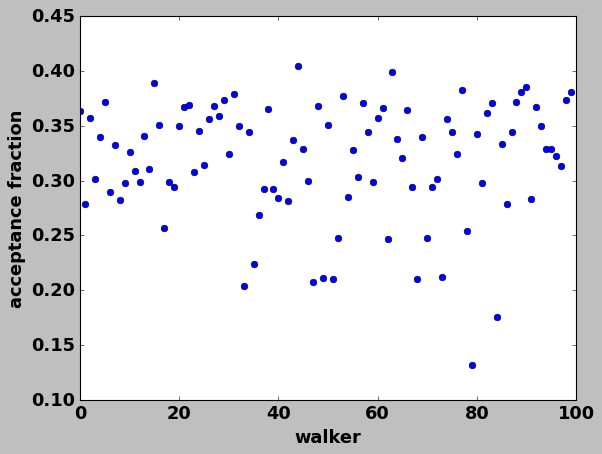

In [ ]:
plt.plot(res.acceptance_fraction, 'o')
plt.xlabel('walker')
plt.ylabel('acceptance fraction')
plt.show()

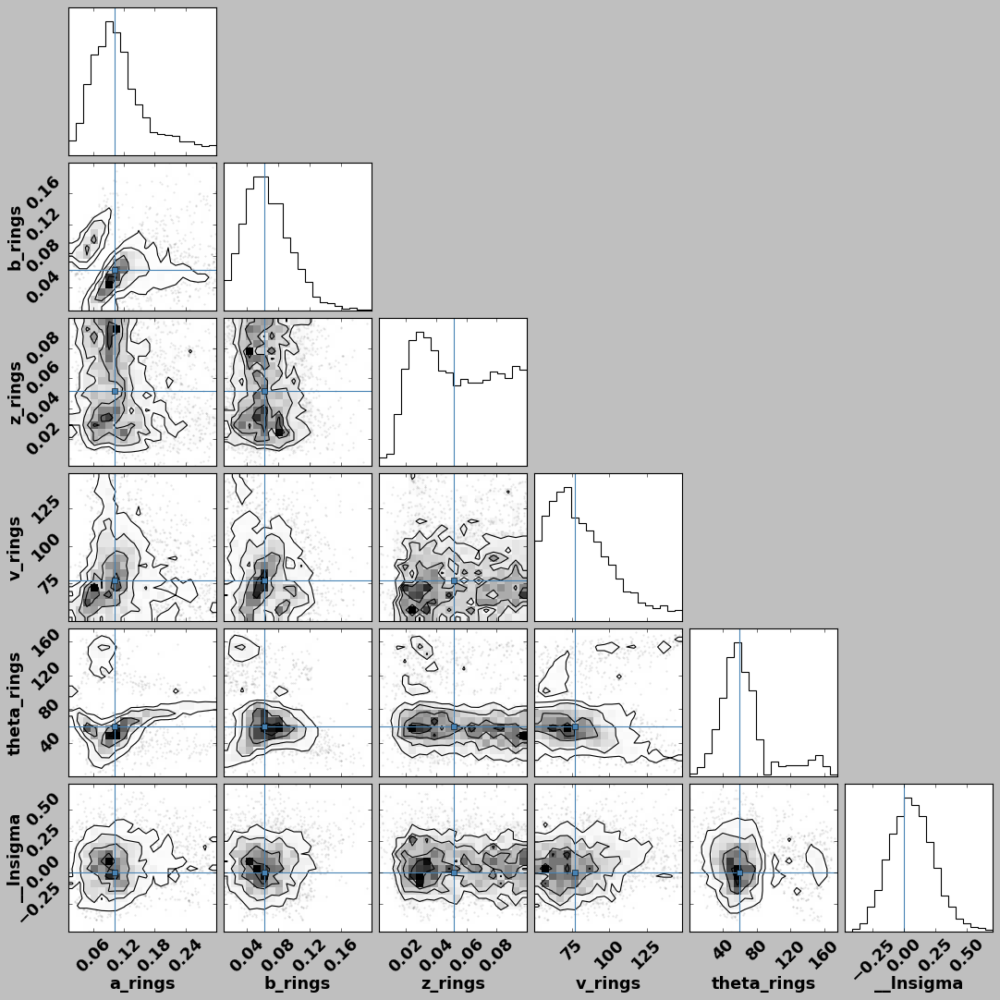

In [ ]:
import corner

emcee_plot = corner.corner(res.flatchain, labels=res.var_names,
                           truths=list(res.params.valuesdict().values())[0:-1])

# Set up the Residual Function

In [16]:
def wasserstein(latitude_ellipse, mass_ellipse, latitude_prior, mass_prior):
    """Computes the Wasserstein-1 Metric (Earth-Mover's Distance)
    by solving an exact optimal-transport problem.

    Args:
        latitude_ellipse: An (n,) numpy float array containing normalized
                          latitudes of points sampled around the ellipse.
                          Should be in dimensionless units, normalized by some
                          b_0 in units angle to ensure output w_metric
                          is also dimensionless.
        mass_ellipse: An (n,) numpy float array containing normalized
                      masses of the same point sampling over the ellipse.
                      Should sum to 1.
        latitude_prior: An (n,) numpy float array containing normalized latitudes
                        sampled appropriately over a total latitude extent.
                        Should be in dimensionless units, normalized by some
                        b_0 in units angle to ensure output w_metric
                        is also dimensionless.
        mass_prior: An (n,) numpy float array containing normalized masses of
                    the same point sampling over the prior mass distribution.
                    Should sum to 1.

    Returns:
        w_metric: The normalized (dimensionless) Wasserstein-1 Metric.

    Raises:
        RuntimeError: If scipy.optimize.linprog fails.
    """
    n = latitude_ellipse.size
    cost_fn = lambda x, y: np.abs(x - y)
    cost = cost_fn(latitude_ellipse[:, None], latitude_prior[None, :])
    # mass_conservation_matrix * optimal_transport_matrix = [mass_ellipse; mass_prior]
    mass_conservation_matrix = np.zeros((2 * n, n * n))
    for i in range(n):
        mass_conservation_matrix[i, i * n:(i + 1) * n] = 1.0                  # row sums = mass_ellipse
        mass_conservation_matrix[n + i, i::n] = 1.0                           # col sums = mass_prior
    mass = np.concatenate([mass_ellipse, mass_prior])
    result = linprog(cost.ravel(), A_eq=mass_conservation_matrix, b_eq=mass, bounds=(0, None), method='highs')
    if not result.success:
        raise RuntimeError(f'scipy.optimize.linprog failed: {result.message}')
    optimal_transport_matrix = result.x.reshape(n, n)
    w_list = optimal_transport_matrix * cost
    w_metric = (optimal_transport_matrix * cost).sum()
    return w_metric,w_list

In [227]:
def ring_resid(params, l,b,v):
    
    a_rings=params['a_rings']
    b_rings=params['b_rings']
    z_rings=params['z_rings']
    v_rings=params['v_rings']
    theta_rings=params['theta_rings']
    alpha_rings=params['alpha_rings']
    ddphi=params['ddphi']

    dphi = np.radians(ddphi)
    phi  = arange(phisun+dphi/2,phisun+2*pi,dphi)
    
    Rings = Ring(phi,a_rings,b_rings,z_rings,v_rings, np.radians(theta_rings),xyzsun,vxyzsun,alpha_rings)
            
    ### Pre-process the given MODEL; normalize to [-1,1] ###
    normELL_l, normELL_b, normELL_v = normalizelbv(np.degrees(Rings.l),np.degrees(Rings.b),Rings.vr)
    back_ind, fore_ind, y_NF = ring_NF_dist_y(Rings) #finds the N/F on the ellipse
    Nrings = norm_data(normELL_l, normELL_b, normELL_v , y_NF)

    ### Sample the data and rings to assign total mass for the Wasserstein metric calc###
    data_l0_arr = Ndata.l0.value
    data_b0_arr = Ndata.b0.value
    data_mass_prior = cat_tab['mass_msun'].value/np.sum(cat_tab['mass_msun'].value) #normed to sum to 1
    ellipse_b0_sample = np.linspace(Nrings.b0.min(), Nrings.b0.max(), len(data_mass_prior)) #even sampling of normed ellipse latitude pts 
    ellipse_l0_sample = np.linspace(Nrings.l0.min(), Nrings.l0.max(), len(data_mass_prior)) #even sampling of normed ellipse latitude pts 
    ellipse_mass_prior = np.full(data_mass_prior.shape, 1./len(data_mass_prior)) #uniform distribution of mass on the ellipse pts to start

    w_metric_l,w_list_l = wasserstein(ellipse_l0_sample,ellipse_mass_prior,data_l0_arr,data_mass_prior) #sum of total work for optimal mass movement
    w_metric_b,w_list_b = wasserstein(ellipse_b0_sample,ellipse_mass_prior,data_b0_arr,data_mass_prior) #sum of total work for optimal mass movement

    w_metric = np.sqrt((w_metric_b**2))

    ### Perform KNN search on the model and find the neighbor distances and indices in the model
    nn = NearestNeighbors(n_neighbors=int(np.sqrt(len(Nrings.l0))), metric='minkowski')
    nn.fit(np.vstack([Nrings.l0,Nrings.b0,Nrings.v0,Nrings.NF]).T)
    distances, indices = nn.kneighbors(np.vstack([Ndata.l0,Ndata.b0,Ndata.v0,Ndata.NF]).T)
    
    
    ### for each catalogue point, find the minimum residual between pt and the ellipse
    #   and save the min to array
    min_d_list = []
    nf_penalty_list = [] #saves how closely the nearest point matches the NF position posterior based on KNN search
    
    model_data_lbv = np.vstack([Nrings.l0,Nrings.b0,Nrings.v0]).T
    cat_data_lbv = np.vstack([Ndata.l0,Ndata.b0,Ndata.v0]).T
    glob_min_idxs_lbv, dist_lbv = min_distance_mahalanobis(cat_data_lbv,model_data_lbv)

    cat_los_i = [] #list for values of LOS in parsec for each cloud
    
    for i in range(len(cat_data_lbv)):

        ### store min distance into the min dist list ###
        min_d_lbv = (dist_lbv[i][glob_min_idxs_lbv[i]]) 
        min_d_list.append(min_d_lbv)
        
        
        ### Find how well each point agrees with the N/F degree of the model ellipse ###
        
        idx=indices[i]
        dist = distances[i]
        neighbors_nf = Nrings.NF[idx]
        common_nf = Counter(neighbors_nf).most_common(1)[0][0]

        post_dist_value = gaussian(common_nf ,post_A[i],post_mu[i],post_CI68[i]/2)

        cdf = abs(norm.cdf(common_nf, loc=post_mu[i], scale=post_CI68[i]/2 )-0.5)

        area_between = abs(1. - (post_dist_value/post_A[i])) #this fits by comparing how offset the point is from the center of the gaussian
        nf_penalty = area_between
        nf_penalty_list.append(nf_penalty)

        """if i == 12:
            print(common_nf, post_mu[i], cdf, area_between)"""

    optimal_dist_list = ((np.array(min_d_list)) + (w_metric))
    #optimal_dist_list = np.array(min_d_list) + w_metric

    resid_list = np.array(optimal_dist_list) + np.array(nf_penalty_list)
    
    #resid_list = (2./3.)*(np.array(min_d_list) + np.array(nf_penalty_list)) + (1./3.)*w_metric
    #resid_list = [((0.75*(x)) + (0.25*w_metric))  for x in optimal_dist_list]


    redchi = np.sum([x**2 for x in resid_list])/(22-6)
    
    """if a_rings.value<b_rings.value:
        print('XXXXX', a_rings.value,b_rings.value, z_rings.value, b_rings.value/a_rings.value, w_metric,redchi)
    else:
        print(a_rings.value,b_rings.value, z_rings.value,v_rings.value,theta_rings.value,alpha_rings.value,redchi)
        
        """
    return resid_list
    

In [24]:
params = create_params(a_rings={'value': 0.09   , 'min': 0.01, 'max': 0.3, 'vary': True},
                       #b_rings={'value': 0.155  , 'min': 0.01, 'max': 0.2, 'vary': True},
                       z_rings={'value': 0.0125 , 'min': 0.0, 'max': 0.05, 'vary': True},
                       v_rings={'value': 130.0  , 'min':75.0, 'max': 175.0, 'vary': True},
                       theta_rings={'value': 25  , 'min': -180, 'max': 180, 'vary': True},
                       alpha_rings={'value': 0.4  , 'min': -np.pi/2, 'max':np.pi/2, 'vary': True},
                       ddphi={'value': 0.001  , 'min': 0.00005, 'max': 0.01, 'vary': False}
                          )
params.add('b_rings', value=0.61*params['a_rings'].value, min=0.01, max=0.2, vary=True)

#params.add('alpha_rings', value=0.3904+(((params['a_rings'].value-0.010)/0.005)*0.0006), min= -np.pi/2, max= np.pi/2, vary=True)

#params.add('b_rings', value=0.055, min=0.01, max=0.2, vary=True)

out = minimize(ring_resid, params, method='nelder', args=(Ndata.l0,Ndata.b0,Ndata.v0))



0.09000000000000001 0.05489999999999999 0.0125 130.0 25.0 0.40000000000000013 3.5218828917800113
0.08700534720762094 0.05489999999999999 0.0125 130.0 25.0 0.40000000000000013 3.6193511701313885
0.09000000000000001 0.05489999999999999 0.01193753588210128 130.0 25.0 0.40000000000000013 3.5104481600695676
0.09000000000000001 0.05489999999999999 0.0125 130.2490995631789 25.0 0.40000000000000013 3.5254990968541065
0.09000000000000001 0.05489999999999999 0.0125 130.0 26.24128296079965 0.40000000000000013 3.408539718449806
0.09000000000000001 0.05489999999999999 0.0125 130.0 25.0 0.4195223600830269 3.5316505825814746
0.09000000000000001 0.052677738051419815 0.0125 130.0 25.0 0.40000000000000013 3.3544330696686764
0.0930297629356444 0.05415486659954179 0.012311540925982401 130.0830474317574 25.41389879246003 0.40651497969937367 3.3232041482741854
0.09609299946977362 0.05378393026651031 0.012217672848073706 130.12456584951678 25.62079693003949 0.40976966964583883 3.30181384863606
0.092016041470

In [25]:
out.residual

array([1.45272298, 0.37060326, 1.40228895, 1.41615711, 1.81222886,
       0.80277372, 2.40249927, 1.87537504, 1.25256845, 2.26546572,
       1.59265209, 1.44237615, 0.91717646, 1.39597514, 1.40547814,
       1.35594406, 1.32218604, 0.71032446, 0.28126608, 0.69978786,
       0.40444456, 1.36055367])

In [26]:
out


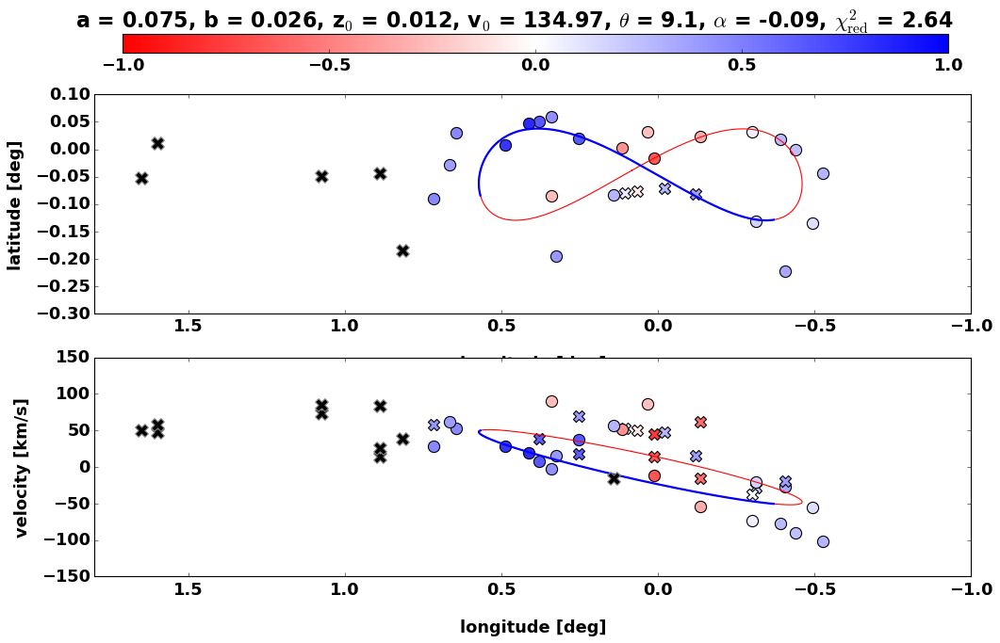

In [27]:
dphi = np.radians(0.001)
phi  = arange(phisun+dphi/2,phisun+2*pi,dphi)

Rings_out = Ring(phi,
                  out.params['a_rings'].value,
                  out.params['b_rings'].value,
                  out.params['z_rings'].value,
                  out.params['v_rings'].value, 
                  np.radians(out.params['theta_rings'].value),
                  xyzsun,vxyzsun,
                  out.params['alpha_rings'].value)

Rings_out_redo = Ring(phi,
                  0.135 ,
                  0.092 ,
                  0.016 ,
                  128.1 , 
                  np.radians(22.9 ),
                  xyzsun,vxyzsun,
                  0.116)

"""

Rings_out_avg = Ring(phi,
                  0.155 ,
                  0.117 ,
                  0.016 ,
                  129.8 , 
                  np.radians(33.8 ),
                  xyzsun,vxyzsun,)




Rings_out = Ring(phi,
                  0.136,
                  0.103,
                  0.013,
                  130.6, 
                  np.radians(40.2),
                  xyzsun,vxyzsun)
"""
'''
Rings_out_off = Ring(phi,
                  out_off.params['a_rings'].value,
                  out_off.params['b_rings'].value,
                  out_off.params['z_rings'].value,
                  out_off.params['v_rings'].value, 
                  np.radians(out_off.params['theta_rings'].value),
                  xyzsun,vxyzsun)'''

lb_lv_plots_postcolor(Rings_out, out)
#lb_lv_plots_postcolor(Rings_out_off, out_off)

#Save output to dat files
list(vars(Rings_out).items())

save_Rings_out = Table()
Rings_out_fit_params = Table()

for i in list(vars(Rings_out).items()):
    if i[0] in ['x', 'y', 'z', 'R', 'phi', 'v', 'vx', 'vy', 'vz', 'l', 'b', 'r', 'vl', 'vb', 'vr' ]:
        save_Rings_out[i[0]] = i[1]
    if i[0] in ['a','bb','z0','v0','theta']:
        Rings_out_fit_params[i[0]] = [i[1]]
        
#ascii.write(save_Rings_out, "/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/Rings_out.dat", overwrite=True)  
#ascii.write(Rings_out_fit_params,"/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/Rings_out_params.dat", overwrite=True)


In [28]:
for i in list(vars(Rings_out).items()):
    if i[0] in ['a','bb','z0','v0','theta']:
        print(i)

('a', np.float64(0.07472681733678484))
('bb', np.float64(0.02625791491174783))
('z0', np.float64(0.011968594857860108))
('v0', np.float64(134.97486452618472))
('theta', np.float64(0.15829419614798187))


# Bold Line Plots

In [18]:
#scouse data for LV 
scouse_fits = pd.read_csv('../CMZ_datasets/final_cmz_scouse_hnco_fits.csv',
              usecols=[0,1,2,3,5,7], names=['n', 'l', 'b', 'amp', 'velocity', 'FWHM'],
              sep="\s+")

<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:4: SyntaxWarning: invalid escape sequence '\s'
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_79340/3215178084.py:4: SyntaxWarning: invalid escape sequence '\s'
  sep="\s+")


In [19]:
def colored_line(x, y, c, ax, **lc_kwargs):
    """
    Plot a line with a color specified along the line by a third value.

    It does this by creating a collection of line segments. Each line segment is
    made up of two straight lines each connecting the current (x, y) point to the
    midpoints of the lines connecting the current point with its two neighbors.
    This creates a smooth line with no gaps between the line segments.

    Parameters
    ----------
    x, y : array-like
        The horizontal and vertical coordinates of the data points.
    c : array-like
        The color values, which should be the same size as x and y.
    ax : Axes
        Axis object on which to plot the colored line.
    **lc_kwargs
        Any additional arguments to pass to matplotlib.collections.LineCollection
        constructor. This should not include the array keyword argument because
        that is set to the color argument. If provided, it will be overridden.

    Returns
    -------
    matplotlib.collections.LineCollection
        The generated line collection representing the colored line.
    """
    if "array" in lc_kwargs:
        warnings.warn('The provided "array" keyword argument will be overridden')

    # Default the capstyle to butt so that the line segments smoothly line up
    default_kwargs = {"capstyle": "butt"}
    default_kwargs.update(lc_kwargs)

    # Compute the midpoints of the line segments. Include the first and last points
    # twice so we don't need any special syntax later to handle them.
    x = np.asarray(x)
    y = np.asarray(y)
    x_midpts = np.hstack((x[0], 0.5 * (x[1:] + x[:-1]), x[-1]))
    y_midpts = np.hstack((y[0], 0.5 * (y[1:] + y[:-1]), y[-1]))

    # Determine the start, middle, and end coordinate pair of each line segment.
    # Use the reshape to add an extra dimension so each pair of points is in its
    # own list. Then concatenate them to create:
    # [
    #   [(x1_start, y1_start), (x1_mid, y1_mid), (x1_end, y1_end)],
    #   [(x2_start, y2_start), (x2_mid, y2_mid), (x2_end, y2_end)],
    #   ...
    # ]
    coord_start = np.column_stack((x_midpts[:-1], y_midpts[:-1]))[:, np.newaxis, :]
    coord_mid = np.column_stack((x, y))[:, np.newaxis, :]
    coord_end = np.column_stack((x_midpts[1:], y_midpts[1:]))[:, np.newaxis, :]
    segments = np.concatenate((coord_start, coord_mid, coord_end), axis=1)

    lc = LineCollection(segments, **default_kwargs)
    lc.set_array(c)  # set the colors of each segment

    return ax.add_collection(lc)

In [165]:
def lb_lv_plots_postcolor_grad(Rings, out='None', scouse_on='None', output_save = 'None', IDs_on='None'):
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 8))
    fig.set_facecolor('white')
    ax[0].set_facecolor('white')

    ### Scatter cloud points in lbv ###
    color_list = ['blue', 'cyan', 'gray' ,'mistyrose', 'red']
    cmap = (mpl.colors.ListedColormap(color_list))


    back_ind = np.where(Rings.y>=y_offset)
    fore_ind = np.where(Rings.y<=y_offset)
    
    ringcmap = 'bwr_r' #cmr.prinsenvlag


    ### Plot Rings LB ###
    sgra = ax[0].scatter(-0.0558, -0.0462,marker = '*', s=150 ,color = 'k',zorder=10)
    ringcolor = ring_NF_dist(Rings)[2]
    lines = colored_line(np.degrees(Rings.l),np.degrees(Rings.b), ringcolor, ax[0], linewidth=5, cmap=ringcmap,zorder=1)

    #ax[0].plot(np.degrees(Rings.l[back_ind[0:-1]]),np.degrees(Rings.b[back_ind[0:-1]]),c='red')
    #ax[0].plot(np.degrees(Rings.l[fore_ind[0:]]),np.degrees(Rings.b[fore_ind[0:]]),c='blue', linewidth=2, zorder=2)


    divnorm =mc.TwoSlopeNorm(vmin=-1., vcenter=0, vmax=1.)
    #cmap    = cmr.redshift_r
    cmap    = 'bwr_r'
    text_list = []
    for i in range(0,len(plot_cat_agg)):

        if plot_cat_agg['leaf_id'][i] not in cat_agg['leaf_id']:
            marker = 'X'
            alpha = 1.
        else:
            marker = 'o'
            alpha =1.
            

        if plot_cat_agg['NF_decision'][i] != 'nan':
            sc = ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, 
                           c=plot_post_tab_agg['mu'][i], s=120, 
                           cmap=cmap, norm=divnorm, alpha = alpha)

        if plot_cat_agg['NF_decision'][i] == 'nan':
            ax[0].scatter(plot_cat_agg['l'][i],plot_cat_agg['b'][i], marker=marker, s=150, edgecolor='gray', zorder=3, c='k', alpha = alpha)

        
        if IDs_on == True:
            key_clouds = np.array(['1','3','5','7a','9','10','13','14','16b','17b','19','20','21a','22','23','25'])
            if plot_cat_agg['leaf_id'][i] in key_clouds:
                if plot_cat_agg['b'][i] > -0.05:
                    text_list.append(ax[0].text(plot_cat_agg['l'][i]+0.05, plot_cat_agg['b'][i]+0.02,s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][i]))),color='w', fontsize=11, weight='bold',path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")]))
                else:
                    text_list.append(ax[0].text(plot_cat_agg['l'][i]+0.05, plot_cat_agg['b'][i]-0.04,s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][i]))),color='w', fontsize=11, weight='bold',path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")]))
    if IDs_on == True:

        t=np.where(key_clouds=='1')[0][0] #ID 1
        cat_t = np.where(plot_cat_agg['leaf_id']=='1')[0][0]
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]+0.01, plot_cat_agg['b'][cat_t]+0.02, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11, weight='bold',path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])

        t=np.where(key_clouds=='3')[0][0] #ID 3
        cat_t = np.where(plot_cat_agg['leaf_id']=='3')[0][0] #ID 3
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]-0.0, plot_cat_agg['b'][cat_t]+0.015, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11,path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])

        t=np.where(key_clouds=='9')[0][0] #ID 9
        cat_t = np.where(plot_cat_agg['leaf_id']=='9')[0][0]
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]-0.01, plot_cat_agg['b'][cat_t]-0.035, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11,path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])

        t=np.where(key_clouds=='10')[0][0] #ID 10
        cat_t = np.where(plot_cat_agg['leaf_id']=='10')[0][0]
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]-0.01, plot_cat_agg['b'][cat_t]-0.035, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11,path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])

        t=np.where(key_clouds=='13')[0][0] #ID 13
        cat_t = np.where(plot_cat_agg['leaf_id']=='13')[0][0]
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]-0.01, plot_cat_agg['b'][cat_t]-0.04, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11,path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])

        t=np.where(key_clouds=='14')[0][0] #ID 14
        cat_t = np.where(plot_cat_agg['leaf_id']=='14')[0][0]
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]+0.02, plot_cat_agg['b'][cat_t]-0.04, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11,path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])
        
        t=np.where(key_clouds=='16b')[0][0] #ID 16
        cat_t = np.where(plot_cat_agg['leaf_id']=='16b')[0][0]
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]+0.08, plot_cat_agg['b'][cat_t]-0.03, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11,path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])

        t=np.where(key_clouds=='21a')[0][0] #ID 21
        cat_t = np.where(plot_cat_agg['leaf_id']=='21a')[0][0]
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]+0.0, plot_cat_agg['b'][cat_t]-0.035, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11,path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])

        t=np.where(key_clouds=='25')[0][0] #ID 21
        cat_t = np.where(plot_cat_agg['leaf_id']=='25')[0][0]
        text_list[t].remove()
        text_list[t]=ax[0].text(plot_cat_agg['l'][cat_t]+0.05, plot_cat_agg['b'][cat_t]+0.015, s=int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][cat_t]))),color='w', fontsize=11,path_effects=[PathEffects.withStroke(linewidth=1.9, foreground="black")])


    #ax[0].set_xlabel('longitude [deg]', labelpad=20)
    ax[0].set_ylabel('latitude [deg]', labelpad=10)
    ax[0].set_xlim(1.8,-1.)
    ax[0].set_ylim(-0.3,0.13)



    ### Plot Rings LV ###
    ringcolor = ring_NF_dist(Rings)[2]
    lines = colored_line(np.degrees(Rings.l),Rings.vr, ringcolor, ax[1], linewidth=5, cmap=ringcmap,zorder=1)

    #ax[1].plot(np.degrees(Rings.l[back_ind[0:-1]]),Rings.vr[back_ind[0:-1]],c='red')
    #ax[1].plot(np.degrees(Rings.l[fore_ind[0:]]),Rings.vr[fore_ind[0:]],c='blue', linewidth=2, zorder=2)

    for i in range(0,len(plot_tab)):
        
        if plot_tab['leaf_id'][i] not in cat_tab['leaf_id']:
            marker = 'X'
            alpha = 1.
        else:
            marker = 'o'
            alpha = 1.

        if plot_tab['NF_decision'][i] != 'nan':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, 
                      c=plot_post_tab['mu'][i], s=120, 
                      cmap=cmap, norm=divnorm, alpha = alpha)


        if plot_tab['NF_decision'][i] == 'nan':
            ax[1].scatter(plot_tab['l'][i],plot_tab['v'][i], marker=marker, s=150, edgecolor='gray', zorder=3, c='k', alpha = alpha)


        


    if scouse_on == True:
        l   = scouse_fits['l'].values
        b   = scouse_fits['b'].values
        v   = scouse_fits['velocity'].values
        amp = scouse_fits['amp'].values

        #ax[0].scatter(l, b, c=amp, cmap='Blues', marker='o', s=1, facecolor='1',
        #        norm=mpl.colors.LogNorm(), alpha=0.1, zorder=0)
        ax[1].scatter(l, v, c=amp, cmap='Blues', marker='o', s=1, facecolor='1',
                norm=mpl.colors.LogNorm(), alpha=0.1, zorder=0)


    ax[1].set_xlabel('longitude [deg]', labelpad=20)
    ax[1].set_ylabel('velocity [km/s]', labelpad=10)
    ax[1].set_xlim(1.8,-1.)
    ax[1].set_ylim(-150,150)
    
    cax = fig.add_axes([0.15, 0.97, 0.73, 0.03])
    cb = plt.colorbar(sc, ax=ax[0], orientation='horizontal', cax=cax)  
    if out =='None':
        ax[0].text(0.5, 3.3, r'a = %.3f, b = %.3f, z$_{0}$ = %.3f, v$_{0}$ = %.2f, $\theta$ = %.1f, $\alpha$ = %.2f' %(Rings.a,Rings.bb,Rings.z0, Rings.v0, np.degrees(Rings.theta),Rings.alpha), fontsize=20, ha='center', va='top', 
            transform=cax.transAxes)

    else:  
        ax[0].text(.5, 3.3, r'a = %.3f, b = %.3f, z$_{0}$ = %.3f, v$_{0}$ = %.2f, $\theta$ = %.1f, $\alpha$ = %.2f, $\chi^{2}_{\mathrm{red}}$ = %.2f' %(Rings.a,Rings.bb,Rings.z0, Rings.v0, np.degrees(Rings.theta),Rings.alpha, out.redchi), fontsize=20, ha='center', va='top', 
            transform=cax.transAxes)
    
    #cax2 = fig.add_axes([.97, 0.1, 0.03, 0.8])
    #cb2 = plt.colorbar(lines, orientation='vertical', cax=cax2)
    #cb2.set_label('Ring LOS N/F', rotation=270)

    if output_save != 'None':
        plt.savefig(output_save, bbox_inches='tight')   
    
    plt.show()





/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_79340/343683201.py:148: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  ax[1].scatter(l, v, c=amp, cmap='Blues', marker='o', s=1, facecolor='1',


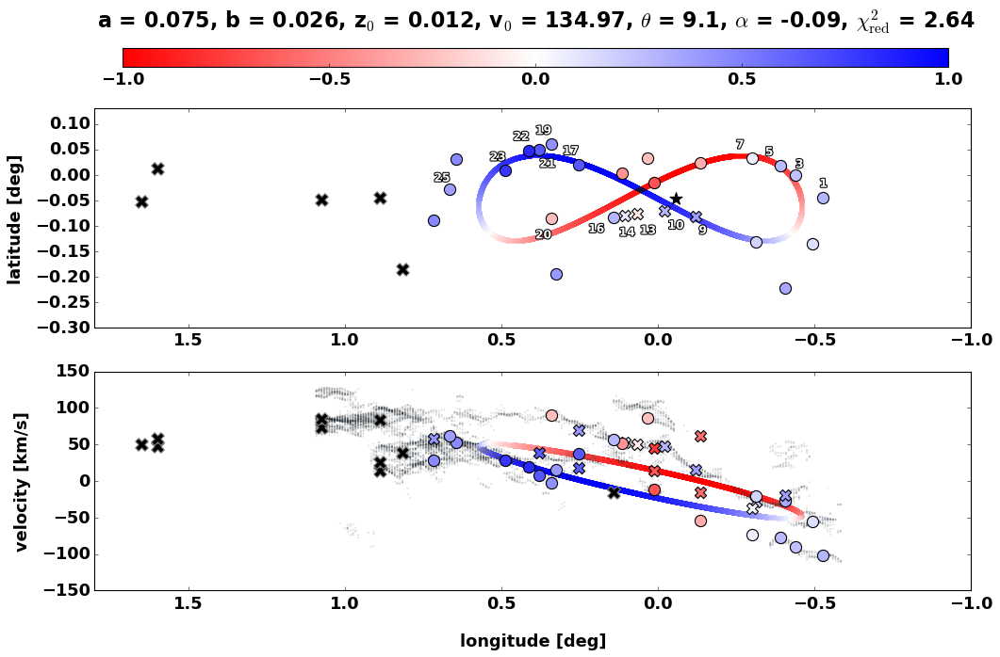

In [167]:

lb_lv_plots_postcolor_grad(Rings_out, out, scouse_on=True, IDs_on =True,output_save='./paper_items/Figs/paper3_ellipse_fit_output.png')
#lb_lv_plots_postcolor_grad(Rings_out_off, out_off)


# Top-down visualizations!

In [193]:
def denorm_yNF_value(y_NF, Rings_out):
        
    """This function takes in a normalized array (-1,1) and converts it to a top-down y-axis
    distance from SgrA* based on that output from the best fitting x2 ellipse (Rings_out).
    
    Negative values are on the NEAR SIDE in front of SgrA*
    Positive values are on the FAR SIDE behind SgrA*
    
    Results are in kiloparsecs!! 
    """
    
    term1 = (y_NF + 1)/2
    term2 = (np.nanmax(Rings_out.r) - np.nanmin(Rings_out.r))
    
    real_y = (term1*term2) + np.nanmin(Rings_out.r)

    #returns the LOS distance on the ring from SgrA* in kpc
    return real_y

def denorm_sigma_value(NFsigma, Rings_out):

    minkpc =  8.2 - np.nanmin(Rings_out.r)
    maxkpc =  8.2 - np.nanmax(Rings_out.r)
    widthkpc = minkpc - maxkpc
    
    term1 = (NFsigma)
    term2 = widthkpc
    
    real_sig = (term1*term2) 

    #returns the LOS distance on the ring from SgrA* in kpc
    return real_sig




0.06288175901701303 0.08569853840459367 0.16091112507724362
0.020941001666716037 0.03681166101168912 0.06622922724125783
0.011757844797955682 0.013183944625665817 0.014936406972061462
129.19832728152207 116.72754895623245 93.72796558309912
13.998369447578499 20.177707434369523 54.16916310935217
0.18149332093622167 0.20441083468005705 0.18208854967180546

In [197]:
###New version
dphi = np.radians(0.001)
phi  = arange(phisun+dphi/2,phisun+2*pi,dphi)
Rings_inner = Ring(phi,
                    0.062 ,
                    0.021 ,
                    0.0118 ,
                    130.0 , 
                    np.radians(14.0),
                    xyzsun,vxyzsun,
                    alpha=0.18)


Rings_avg = Ring(phi,
                  0.086 ,
                  0.037 ,
                  0.0132 ,
                  116.73 , 
                  np.radians(20.8),
                  xyzsun,vxyzsun,
                  alpha=0.02)


Rings_outer = Ring(phi,
                    0.161 ,
                    0.066 ,
                    0.0149 ,
                    93.73 , 
                    np.radians(54.2),
                    xyzsun,vxyzsun,
                    alpha=0.18)



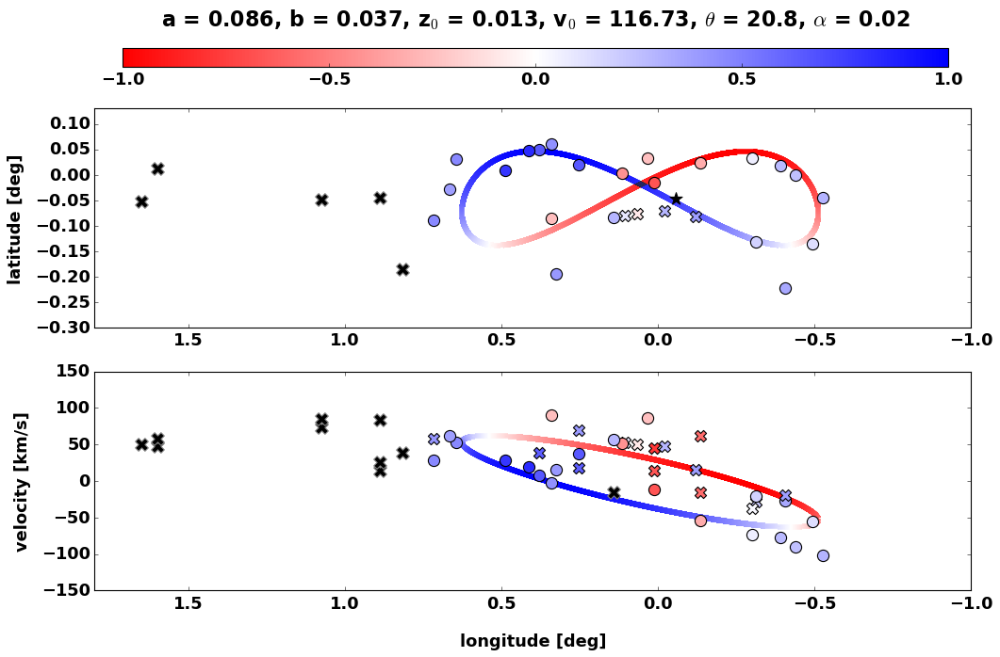

In [198]:
lb_lv_plots_postcolor_grad(Rings_avg, scouse_on=False)

            

In [ ]:
plot_post_tab_agg[12]

cloud_id,A_MC,mu_MC,sigma_MC
str3,float64,float64,float64
13,3.6079965088955213,-0.10917096702094588,-0.1264811859631931


In [210]:
##convert the cloud posterior sigmas into pc uncertainties for the plotted ones?
cat_sig_list, cat_sig_inner, cat_sig_avg, cat_sig_outer = [], [], [], []
cat_y_list,cat_y_inner,cat_y_avg,cat_y_outer = [], [], [], []

for i in range(len(plot_post_tab_agg[:-3])):
    
    

    lowerlim_y = denorm_yNF_value(plot_post_tab_agg['mu'][i],Rings_inner)
    avglim_y   = denorm_yNF_value(plot_post_tab_agg['mu'][i],Rings_avg)
    upperlim_y = denorm_yNF_value(plot_post_tab_agg['mu'][i],Rings_outer)
    
    #combiney_kpc = np.mean([lowerlim_y,  upperlim_y])
    combiney_kpc = upperlim_y
    
    cat_y_list.append(8.2-combiney_kpc)
    cat_y_inner.append(8.2-lowerlim_y)
    cat_y_avg.append(8.2-avglim_y)
    cat_y_outer.append(8.2-upperlim_y)

    lowerlim_sig_kpc = denorm_sigma_value(abs(plot_post_tab_agg['CI68'][i]/2), Rings_inner)
    avglim_sig_kpc   = denorm_sigma_value(abs(plot_post_tab_agg['CI68'][i]/2), Rings_avg)
    upperlim_sig_kpc = denorm_sigma_value(abs(plot_post_tab_agg['CI68'][i]/2), Rings_outer)
    
    #combinesig_kpc = np.sqrt(lowerlim_sig_kpc**2 + upperlim_sig_kpc**2)
    #combinesig_kpc = (lowerlim_sig_kpc**2 + upperlim_sig_kpc**2 + avglim_sig_kpc**2)**(1./2.)
    combinesig_kpc = abs(avglim_sig_kpc) + abs(np.std((8.2-lowerlim_y, 8.2-upperlim_y, 8.2-avglim_y)))#PDF width + stdv of the three y positions?
    
    cat_sig_list.append(combinesig_kpc)
    cat_sig_inner.append(np.abs(lowerlim_sig_kpc))
    cat_sig_avg.append(np.abs(avglim_sig_kpc))
    cat_sig_outer.append(np.abs(upperlim_sig_kpc))
    

    #print(plot_cat_agg['leaf_id'][i], plot_post_tab_agg['sigma_MC'][i], abs(avglim_sig_kpc) , abs(np.std((8.2-lowerlim_y, 8.2-upperlim_y, 8.2-avglim_y))))
    print(plot_cat_agg['leaf_id'][i], (8.2-combiney_kpc)*1e3 , (8.2-lowerlim_y)*1e3 ,(8.2-upperlim_y)*1e3, abs(np.std((8.2-lowerlim_y, 8.2-upperlim_y, 8.2-avglim_y)))*1e3,abs(avglim_sig_kpc)*1e3,combinesig_kpc*1e3,  )
    #print(plot_cat_agg['leaf_id'][i], (8.2-combiney_kpc)*1e3 , abs(np.std((8.2-lowerlim_y, 8.2-upperlim_y, 8.2-avglim_y)))*1e3,  abs(avglim_sig_kpc)*1e3, combinesig_kpc*1e3, plot_post_tab_agg['sigma_MC'][i],abs(avglim_sig_kpc)*1e3,  )

    

1 -40.380601991996556 -7.5058165123937926 -40.380601991996556 14.264899319270665 17.318410468907086 31.58330978817775
2 -17.48578792748212 -3.2515023513504104 -17.48578792748212 6.176090444630479 15.939393339605235 22.115483784235717
3 -33.594690568524044 -6.244858507532314 -33.594690568524044 11.867415725358082 8.263275134793835 20.130690860151915
4a -46.67636012782239 -8.675694237378906 -46.67636012782239 16.48921024036024 21.320789914883623 37.81000015524386
5 -37.08907898151459 -6.8941857336763945 -37.08907898151459 13.10199400966622 9.232815761206707 22.334809770872926
6b -23.80048430905468 -4.424899181005415 -23.80048430905468 8.407092243989618 8.286672916123916 16.693765160113532
7a -9.027570817824682 -1.6797965176458263 -9.027570817824682 3.1877763065875686 11.867678609204427 15.055454915791998
8a 44.017999168683986 8.177130860680393 44.017999168683986 15.553389331835993 12.904798569150387 28.458187900986378
9 -52.13820800653757 -9.690614765251127 -52.13820800653757 18.41889807

In [42]:
plot_post_tab_agg

cloud_id,A,mu,CI68,sigma
str3,float64,float64,float64,float64
1,1.9738715336654222,0.2939816577719315,0.3753286693006973,0.18871018855482902
2,2.1974021624583373,0.12584127787406968,0.3454422853849802,0.17368371814300293
3,4.1165960287429435,0.244145667775204,0.17908364430880896,0.09004083900003448
4a,1.661719844412958,0.34021794349670914,0.4620691790138636,0.23232214597287418
5,3.8540320961242838,0.26980858836566446,0.20009575704270194,0.10060544565088297
6b,4.065013165193719,0.17221664679147772,0.17959072653480046,0.0902957930984196
7a,2.7616815945525284,0.0637238117060228,0.2571991250627832,0.12931624828224836
8a,2.135529123536469,-0.32584485936056995,0.2796758330245546,0.14061723364385295
9,5.86237041160961,0.3803299607720438,0.1312086647706891,0.06596994552810755


In [200]:
def los_l_to_xyz(l):
    
    rr = np.linspace((8.2--0.21),(8.2-0.21), 100)
    x,y,z,vx,vy,vz=lbr2xyz(np.deg2rad(l),np.deg2rad(0),rr,
                       0,0,0,xsun=-8.2,ysun=0.0,zsun=0.0,vxsun=0.0,vysun=2.2,vzsun=0.0)
    return -y , x

In [652]:
y_offset

np.float64(-0.006612005338255317)

<>:95: SyntaxWarning: invalid escape sequence '\e'
<>:95: SyntaxWarning: invalid escape sequence '\c'
<>:95: SyntaxWarning: invalid escape sequence '\e'
<>:95: SyntaxWarning: invalid escape sequence '\c'
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_24371/3723965282.py:95: SyntaxWarning: invalid escape sequence '\e'
  ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list])
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_24371/3723965282.py:95: SyntaxWarning: invalid escape sequence '\c'
  ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list])
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_24371/3723965282.py:95: SyntaxWarning: invalid escape sequence '\e'
  ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list])
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_24371/3723965282.py:95: SyntaxWarning: invalid escape sequence '\c'
  ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long

KeyboardInterrupt: 

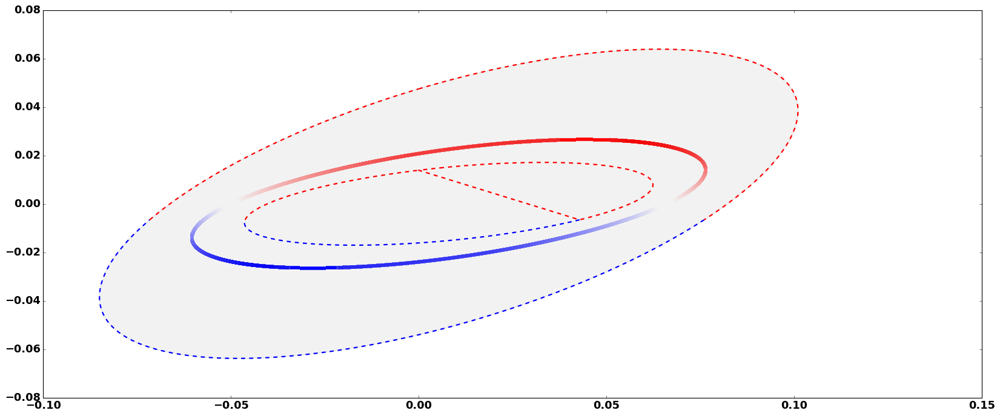

In [653]:
### Another version of top-down with the shaded area
# treating the median ellipse as the average, and the min/max as the most likely ranges possible from the fitting

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(25, 10))
fig.set_facecolor('white')
fig.set_facecolor('white')


ringcmap = 'bwr_r' #cmr.prinsenvlag




indind = np.where(Rings_inner.y>y_offset)[0]
indind_xneg = np.where(Rings_inner.x[indind]<0)[0]
indind_xpos = np.where(Rings_inner.x[indind]>0)[0]
sortedind = np.argsort(Rings_inner.x[indind])
inner_fore_ind = np.where(Rings_inner.y<=y_offset)
ax.plot(Rings_inner.x[indind][indind_xneg][np.argsort(Rings_inner.x[indind][indind_xneg])],Rings_inner.y[indind][indind_xneg][np.argsort(Rings_inner.x[indind][indind_xneg])],'--',c='red',linewidth=2, zorder=10)
ax.plot(Rings_inner.x[indind][indind_xpos],Rings_inner.y[indind][indind_xpos],'--',linewidth=2,c='red',zorder=10)
ax.plot(Rings_inner.x[inner_fore_ind[0:]],Rings_inner.y[inner_fore_ind[0:]],c='blue', linestyle = '--', linewidth=2, zorder=9)

avg_ringcolor = ring_NF_dist(Rings_avg)[2]
avg_lines = colored_line(Rings_avg.x ,Rings_avg.y , avg_ringcolor, ax, linewidth=5, cmap=ringcmap,zorder=10)

indind = np.where(Rings_outer.y>y_offset)[0]
indind_xneg = np.where(Rings_outer.x[indind]<0)[0]
indind_xpos = np.where(Rings_outer.x[indind]>0)[0]
sortedind = np.argsort(Rings_outer.x[indind])
outer_fore_ind = np.where(Rings_outer.y<=y_offset)
ax.plot(Rings_outer.x[indind][indind_xneg][np.argsort(Rings_outer.x[indind][indind_xneg])],Rings_outer.y[indind][indind_xneg][np.argsort(Rings_outer.x[indind][indind_xneg])],'--',linewidth=2,c='red',zorder=10)
ax.plot(Rings_outer.x[indind][indind_xpos],Rings_outer.y[indind][indind_xpos],'--',linewidth=2,c='red',zorder=10)
ax.plot(Rings_outer.x[outer_fore_ind[0:]],Rings_outer.y[outer_fore_ind[0:]],c='blue', linestyle = '--', linewidth=2, zorder=9)




## Shade between the N and F edges? ##
ax.fill(Rings_outer.x,Rings_outer.y, 'grey', alpha=0.1 ,zorder=0)
ax.fill(Rings_inner.x, Rings_inner.y, 'w', edgecolor='w', alpha=1)





sgra = ax.scatter(-y_offset , 0 , marker = '*', s=150 ,color = 'k',zorder=10)


long_list = np.arange(-1.5, 1.5, 0.5)
axt_ticks = []
for ll in long_list:
    xline, rrline = los_l_to_xyz(ll)
    ax.plot(xline, rrline , linestyle = '--', c='gray',zorder=1)
    axt_ticks.append(xline[-1])




divnorm =mc.TwoSlopeNorm(vmin=-1., vcenter=0, vmax=1.)
cmap    = 'bwr_r'
for i in range(len(cat_y_list)):

    if plot_post_tab_agg['cloud_id'][i] not in cat_agg['leaf_id']:
        marker = 'X'
        color = 'k'
        alpha = 1.
    else:
        marker = 'o'
        color = plot_post_tab_agg['mu'][i]
        alpha =1.
            
    x,y,z,vx,vy,vz=lbr2xyz(np.deg2rad(plot_cat_agg['l'][i]),np.deg2rad(plot_cat_agg['b'][i]),cat_y_list[i]+8.2,
                       0,0,0,xsun=-8.2,ysun=0.0,zsun=0.0,vxsun=0.0,vysun=2.2,vzsun=0.0)

    ax.scatter(-y,cat_y_list[i], marker = marker, c=color , cmap=cmap, norm=divnorm, s = 150, zorder = 10)

    ax.errorbar(-y,cat_y_list[i], yerr=cat_sig_list[i], c='k', zorder=9)
    ax.text((-y),cat_y_list[i]+0.005, int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][i]))) , zorder=10) 


ax.set_xlim(-0.15, 0.15)
ax.set_ylim(-0.158, 0.158)

#ax.axes.get_yaxis().set_visible(False)

xlabels = [item.get_text().replace('\u2212', '-') for item in ax.get_xticklabels()]
xlabels = [str(int(float(item)*1e3)) for item in xlabels]
ylabels = [item.get_text().replace('\u2212', '-') for item in ax.get_yticklabels()]
ylabels = [str(int(float(item)*1e3)) for item in ylabels]
ax.set_xticklabels(xlabels)
ax.set_yticklabels(ylabels)

ax_t = ax.secondary_xaxis('top') #set top axis ticks on
ax_t.set_xticks(axt_ticks)
ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list])

ax.set_xlabel('x [pc]', labelpad=20)
ax.set_ylabel('y', labelpad=10)

ax.arrow(-.120, -.100, 0, -0.008*3, length_includes_head=False,
          head_width=0.004*3, head_length=0.005*3, color = 'k')
ax.text(0, -.09, 'To Sun')



#plt.savefig('./paper_items/Figs/x2_fits_topdown_ellipses_shaded.pdf', bbox_inches='tight')


In [164]:
plot_cat_agg['leaf_id'][25]

np.str_('26a')

<>:133: SyntaxWarning: invalid escape sequence '\e'
<>:133: SyntaxWarning: invalid escape sequence '\c'
<>:133: SyntaxWarning: invalid escape sequence '\e'
<>:133: SyntaxWarning: invalid escape sequence '\c'
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_79340/1817213156.py:133: SyntaxWarning: invalid escape sequence '\e'
  ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list],fontsize=40)
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_79340/1817213156.py:133: SyntaxWarning: invalid escape sequence '\c'
  ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list],fontsize=40)
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_79340/1817213156.py:78: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(-y,cat_y_list[i], marker = marker, c=color , cmap=cmap, norm=divnorm, s = 150, zorder = 10)
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_79340/1817213156.py

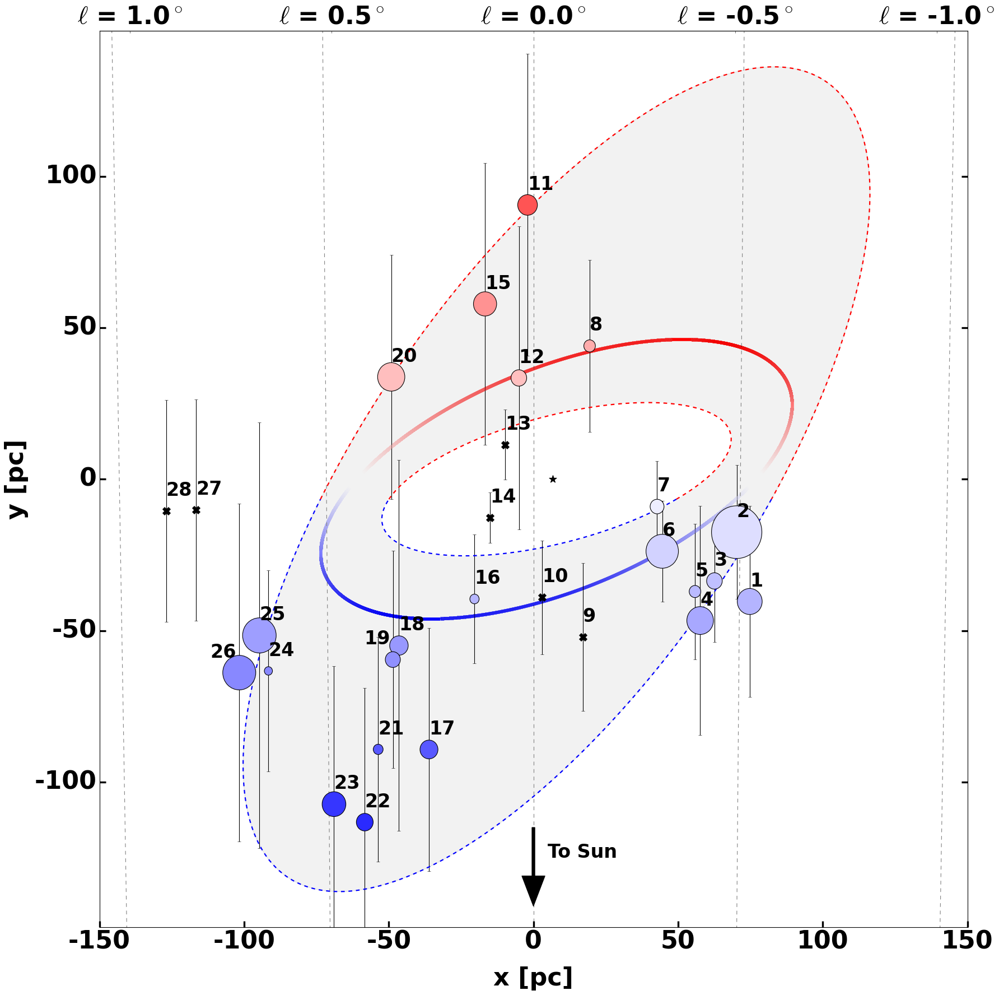

In [201]:
### Another version of top-down with the shaded area
### ADDING IN THE FACE-ON PROJECTED AREAS
# treating the median ellipse as the average, and the min/max as the most likely ranges possible from the fitting


fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(25, 25))
fig.set_facecolor('white')
fig.set_facecolor('white')


ringcmap = 'bwr_r' #cmr.prinsenvlag



## Finagle plotting so the rings look nice with the red/blue colors ###
indind = np.where(Rings_inner.y>y_offset)[0]
indind_xneg = np.where(Rings_inner.x[indind]<Rings_inner.x[indind][np.argmax(Rings_inner.y[indind])])[0]
indind_xpos = np.where(Rings_inner.x[indind]>Rings_inner.x[indind][np.argmax(Rings_inner.y[indind])])[0]
sortedind = np.argsort(Rings_inner.y[indind][indind_xpos])
inner_fore_ind = np.where(Rings_inner.y<=y_offset)


ax.plot(Rings_inner.x[indind][indind_xneg][np.argsort(Rings_inner.x[indind][indind_xneg])],Rings_inner.y[indind][indind_xneg][np.argsort(Rings_inner.x[indind][indind_xneg])],'--',c='red',linewidth=2, zorder=9)
ax.plot(Rings_inner.x[indind][indind_xpos][sortedind],Rings_inner.y[indind][indind_xpos][sortedind],'--',linewidth=2,c='red',zorder=8)


ax.plot(Rings_inner.x[inner_fore_ind[0:]],Rings_inner.y[inner_fore_ind[0:]],c='blue', linestyle = '--', linewidth=2, zorder=9)

avg_ringcolor = ring_NF_dist(Rings_avg)[2]
avg_lines = colored_line(Rings_avg.x ,Rings_avg.y , avg_ringcolor, ax, linewidth=5, cmap=ringcmap,zorder=9)

indind = np.where(Rings_outer.y>y_offset)[0]
indind_xneg = np.where(Rings_outer.x[indind]<0)[0]
indind_xpos = np.where(Rings_outer.x[indind]>0)[0]
sortedind = np.argsort(Rings_outer.x[indind])
outer_fore_ind = np.where(Rings_outer.y<=y_offset)
ax.plot(Rings_outer.x[indind][indind_xneg][np.argsort(Rings_outer.x[indind][indind_xneg])],Rings_outer.y[indind][indind_xneg][np.argsort(Rings_outer.x[indind][indind_xneg])],'--',linewidth=2,c='red',zorder=9)
ax.plot(Rings_outer.x[indind][indind_xpos],Rings_outer.y[indind][indind_xpos],'--',linewidth=2,c='red',zorder=9)
ax.plot(Rings_outer.x[outer_fore_ind[0:]],Rings_outer.y[outer_fore_ind[0:]],c='blue', linestyle = '--', linewidth=2, zorder=9)




## Shade between the N and F edges? ##
ax.fill(Rings_outer.x,Rings_outer.y, 'grey', alpha=0.1 ,zorder=0)
ax.fill(Rings_inner.x, Rings_inner.y, 'w', edgecolor='w', alpha=1,zorder=1)





sgra = ax.scatter(-y_offset , 0 , marker = '*', s=150 ,color = 'k',zorder=10)


long_list = np.arange(-2., 2., 0.5)
axt_ticks = []
for ll in long_list:
    xline, rrline = los_l_to_xyz(ll)
    ax.plot(xline, rrline , linestyle = '--', c='gray',zorder=1)
    axt_ticks.append(xline[-1])




divnorm =mc.TwoSlopeNorm(vmin=-1., vcenter=0, vmax=1.)
cmap    = 'bwr_r'
text_list=[]
for i in range(len(cat_y_list)):
    

    if plot_post_tab_agg['cloud_id'][i] not in cat_agg['leaf_id']:
        marker = 'X'
        color = 'k'
        alpha = 1.

        x,y,z,vx,vy,vz=lbr2xyz(np.deg2rad(plot_cat_agg['l'][i]),np.deg2rad(plot_cat_agg['b'][i]),cat_y_list[i]+8.2,
                        0,0,0,xsun=-8.2,ysun=0.0,zsun=0.0,vxsun=0.0,vysun=2.2,vzsun=0.0)
        ax.scatter(-y,cat_y_list[i], marker = marker, c=color , cmap=cmap, norm=divnorm, s = 150, zorder = 10)
        ax.errorbar(-y,cat_y_list[i], yerr=cat_sig_list[i], c='k', zorder=9)
        text_list.append(ax.text((-y),cat_y_list[i]+0.005, int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][i]))) ,fontsize=30, zorder=10)) 

    else:

        circle_rad = plot_cat_agg['rad'][i]/1e3 #in kpc
        
        x,y,z,vx,vy,vz=lbr2xyz(np.deg2rad(plot_cat_agg['l'][i]),np.deg2rad(plot_cat_agg['b'][i]),cat_y_list[i]+8.2,
                        0,0,0,xsun=-8.2,ysun=0.0,zsun=0.0,vxsun=0.0,vysun=2.2,vzsun=0.0)

        circle = mpl.patches.Circle((-y,cat_y_list[i]), radius=circle_rad)
        circle.set_zorder(10)
        color = cm.bwr_r(divnorm(plot_post_tab_agg['mu'][i]))
        alpha =1.

        ax.add_artist(circle, )
        circle.set_facecolor(color)
        circle.set_zorder(9)
        ax.errorbar(-y,cat_y_list[i], yerr=cat_sig_list[i], c='k', zorder=8)

        if i == 18 or i == 25:
            text_list.append(ax.text((-y)-0.01,cat_y_list[i]+0.005, int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][i]))) , fontsize=30, zorder=10))

        else:
            text_list.append(ax.text((-y),cat_y_list[i]+0.005, int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][i]))) , fontsize=30, zorder=10)) 



ax.set_xlim(-0.15, 0.15)
ax.set_ylim(-0.148, 0.148)

#ax.axes.get_yaxis().set_visible(False)

xlabels = [item.get_text().replace('\u2212', '-') for item in ax.get_xticklabels()]
xlabels = [str(int(float(item)*1e3)) for item in xlabels]
ylabels = [item.get_text().replace('\u2212', '-') for item in ax.get_yticklabels()]
ylabels = [str(int(float(item)*1e3)) for item in ylabels]
ax.set_xticklabels(xlabels, fontsize=40)
ax.set_yticklabels(ylabels, fontsize=40)

ax_t = ax.secondary_xaxis('top') #set top axis ticks on
ax_t.set_xticks(axt_ticks)
ax.tick_params(axis='x', # Specify the x-axis
               which='major', # Apply to major ticks
               top = False,
               length=10, # Set tick mark length to 10 points
               width=3) # Set tick mark width to 2 points

ax.tick_params(axis='y', # Specify the x-axis
               which='major', # Apply to major ticks
               length=10, # Set tick mark length to 10 points
               width=3) # Set tick mark width to 2 points


ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list],fontsize=40)

ax.set_xlabel('x [pc]', labelpad=20,fontsize=40)
ax.set_ylabel('y [pc]', labelpad=10,fontsize=40)

ax.arrow(0.0, -.115, 0, -0.008*2, length_includes_head=False,
          head_width=0.004*2, head_length=0.005*2, color = 'k')
ax.text(0.005, -.125, 'To Sun', fontsize=30,zorder=10)



plt.savefig('./paper_items/Figs/x2_fits_topdown_ellipses_shaded_circleareas.png', bbox_inches='tight')


array([     0,      1,      2, ..., 191189, 191190, 191191],
      shape=(71738,))

# Separate top-down ellipses! 

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(25, 25*2.5), dpi=300)
plt.subplots_adjust(wspace=0.05)
fig.set_facecolor('white')
fig.set_facecolor('white')

ringcmap = 'bwr_r' #cmr.prinsenvlag


### Plot Rings LB ###
min_ringcolor = ring_NF_dist(Rings_inner)[2]
min_lines = colored_line(Rings_inner.x ,Rings_inner.y , min_ringcolor, ax[0], linewidth=5, cmap=ringcmap,zorder=10)


avg_ringcolor = ring_NF_dist(Rings_avg)[2]
avg_lines = colored_line(Rings_avg.x ,Rings_avg.y , avg_ringcolor, ax[1], linewidth=5, cmap=ringcmap,zorder=10)


max_ringcolor = ring_NF_dist(Rings_outer)[2]
max_lines = colored_line(Rings_outer.x ,Rings_outer.y , max_ringcolor, ax[2], linewidth=5, cmap=ringcmap,zorder=10)

ax[0].scatter(-y_offset , 0 , marker = '*', s=150 ,color = 'k',zorder=10)
ax[1].scatter(-y_offset , 0 , marker = '*', s=150 ,color = 'k',zorder=10)
ax[2].scatter(-y_offset , 0 , marker = '*', s=150 ,color = 'k',zorder=10)


for axes in ax:
    long_list = np.arange(-1.5, 1.5, 0.5)
    axt_ticks = []
    for ll in long_list:
        xline, rrline = los_l_to_xyz(ll)
        axes.plot(xline, rrline , linestyle = '--', c='gray',zorder=0)
        axt_ticks.append(xline[-1])

    axes.set_xlim(-0.15, 0.15)
    axes.set_ylim(-0.158, 0.158)
    xlabels = [item.get_text().replace('\u2212', '-') for item in axes.get_xticklabels()]
    xlabels = [str(int(float(item)*1e3)) for item in xlabels]
    ylabels = [item.get_text().replace('\u2212', '-') for item in axes.get_yticklabels()]
    ylabels = [str(int(float(item)*1e3)) for item in ylabels]
    axes.set_xticklabels(xlabels)
    axes.set_yticklabels(' ')

    ax_t = axes.secondary_xaxis('top') #set top axis ticks on
    ax_t.set_xticks(axt_ticks)
    ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list])

    axes.set_xlabel('x [pc]', labelpad=20)
    axes.set_ylabel('y', labelpad=10)

    axes.arrow(-.120, -.100, 0, -0.008*3, length_includes_head=False,
            head_width=0.004*3, head_length=0.005*3, color = 'k')
    axes.text(-.127, -.09, 'To Sun')

    divnorm =mc.TwoSlopeNorm(vmin=-1., vcenter=0, vmax=1.)
    cmap    = 'bwr_r'

    if axes == ax[0]:
        ycatsig, ycat   = cat_sig_inner, cat_y_inner
    if axes == ax[1]:
        ycatsig, ycat  = cat_sig_avg, cat_y_avg
    if axes == ax[2]:
        ycatsig, ycat = cat_sig_outer, cat_y_outer

    for i in range(len(ycat)):

        if plot_post_tab_agg['cloud_id'][i] not in cat_agg['leaf_id']:
            marker = 'X'
            color = 'k'
            alpha = 1.
        else:
            marker = 'o'
            color = plot_post_tab_agg['mu_MC'][i]
            alpha =1.
                
        x,y,z,vx,vy,vz=lbr2xyz(np.deg2rad(plot_cat_agg['l'][i]),np.deg2rad(plot_cat_agg['b'][i]),ycat[i]+8.2,
                        0,0,0,xsun=-8.2,ysun=0.0,zsun=0.0,vxsun=0.0,vysun=2.2,vzsun=0.0)

        axes.scatter(-y,ycat[i], marker = marker, c=color , cmap=cmap, norm=divnorm, s = 150, zorder = 10)

        axes.errorbar(-y,ycat[i], yerr=ycatsig[i], c='k', zorder=9)
        axes.text((-y),ycat[i]+0.005, int(''.join(filter(str.isdigit, plot_cat_agg['leaf_id'][i]))) , zorder=10) 


plt.savefig('./paper_items/Figs/separate_x2_fits_topdown_ellipses.pdf', bbox_inches='tight')


<>:45: SyntaxWarning: invalid escape sequence '\e'
<>:45: SyntaxWarning: invalid escape sequence '\c'
<>:45: SyntaxWarning: invalid escape sequence '\e'
<>:45: SyntaxWarning: invalid escape sequence '\c'
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_98961/3111368887.py:45: SyntaxWarning: invalid escape sequence '\e'
  ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list])
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_98961/3111368887.py:45: SyntaxWarning: invalid escape sequence '\c'
  ax_t.set_xticklabels([f'$\ell$ = {l:1.1f}$^\circ$' for l in long_list])
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_98961/3111368887.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes.set_xticklabels(xlabels)
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_98961/3111368887.py:41: UserWarning: set_ticklabels() should only be used with a fixed numbe

In [ ]:
cat_tab

leaf_id,cloud_name,l,b,v,sigma,rad,corr_coeff,flux_diff,flux_diff_stdv,flux_ratio,flux_ratio_stdv,absorp_value,absorp_sigma,NF_decision,absorp_NF,lb_pixel_mask
str3,str14,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,str3,str3,int64
1,G359.475-0.044,-0.525,-0.044,-102,6,4.3,0.26,-20.97,59.09,0.37,0.2,nan,nan,LN,nan,1
2,G359.508-0.135,-0.492,-0.135,-56,9,8.7,0.38,-73.25,56.22,0.46,0.19,nan,nan,N,nan,1
3,G359.561-0.001,-0.439,-0.001,-90,8,2.7,0.22,-59.31,23.73,0.38,0.09,2.15,0.06,U,F,1
4a,G359.595-0.223,-0.405,-0.223,-27,13,4.6,0.43,-79.52,73.95,0.37,0.3,nan,nan,N,nan,1
5,G359.608+0.018,-0.392,0.018,-78,5,2.0,0.18,-79.45,23.27,0.38,0.11,0.52,0.07,LN,N,1
6b,G359.688-0.132,-0.312,-0.132,-21,12,5.6,0.28,-61.84,29.84,0.41,0.09,2.28,0.05,U,F,1
7a,G359.701+0.032,-0.299,0.032,-73,11,2.4,-0.54,-96.86,32.34,0.46,0.12,0.36,0.05,LN,N,1
8a,G359.865+0.023,-0.135,0.023,-54,9,2.0,-0.05,-113.79,43.09,0.66,0.13,2.4,0.15,F,F,1
11a,G0.014-0.016,0.014,-0.016,-11,9,3.4,-0.36,-148.38,102.8,0.86,0.19,2.78,0.68,F,nan,1


In [ ]:
np.array(xray_tab['cloud_index']).astype(str)

array(['13', '14'], dtype='<U21')

# Save LOS dist results to Table

In [205]:
colloq_names[1:]

--
SgrC
--
--
--
--
--
--
--
--
--


In [235]:
##Load in PPDF table and create a column that lists the methods used##
PPDF_meth_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/paper_items/Tables/PPDF_method_info.tex")
starcount_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/starcounts_tab.tex")
xray_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/xray_methods.tex")
nogueras_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/nogueras_measures.tex")
v3 = Table.read('./paper_items/Tables/LOS_synth_table_v3.tex', format='latex')
colloq_names = v3['Colloquial'][1:]

method_col = []
for i in range(len(PPDF_meth_tab)):
    meths = np.array('')
    j = PPDF_meth_tab[i]['leaf id']
    
    if np.isnan(PPDF_meth_tab[i]['flux diff']) == False:
        meths= meths + 'd'
    if np.isnan(PPDF_meth_tab[i]['flux ratio']) == False:
        meths = meths + ',r'
    if np.isnan(PPDF_meth_tab[i]['corr coeff']) == False:
        meths = meths + ',c'
    if np.isnan(PPDF_meth_tab[i]['absorption fraction']) == False:
        meths = meths + ',a'
    if np.isnan(starcount_tab[i]['counts_ratio_from_avg']) == False:
        meths = meths + ',s'
    if j in np.array(xray_tab['cloud_index']).astype(str):
        meths = meths + ',x'
    if j in np.array(nogueras_tab['cloud_index']).astype(str):
        meths = meths + ',k'
    
    method_col.append(meths)
meth_table = Table()
meth_table['leaf_id'] = PPDF_meth_tab['leaf id']
meth_table['methods'] = method_col
meth_table

leaf_id,methods
str3,str9
1,"d,r,c,s"
2,"d,r,c,s"
3,"d,r,c,a,s"
4a,"d,r,c,s"
4b,"d,r,c,s"
5,"d,r,c,a,s"
6a,"d,r,c,a,s"
6b,"d,r,c,a,s"
7a,"d,r,c,a,s"


leaf_id,cloud_name,l,b,v,sigma,rad,mass_msun,corr_coeff,flux_diff,flux_diff_stdv,flux_ratio,flux_ratio_stdv,absorp_value,absorp_sigma,NF_decision,absorp_NF,lb_pixel_mask
str3,str14,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str3,str3,int64
1,G359.475-0.044,-0.525,-0.044,-102,6,4.3,60000.0,0.26,-20.97,59.09,0.37,0.2,nan,nan,LN,nan,1
2,G359.508-0.135,-0.492,-0.135,-56,9,8.7,290000.0,0.38,-73.25,56.22,0.46,0.19,nan,nan,N,nan,1
3,G359.561-0.001,-0.439,-0.001,-90,8,2.7,21000.0,0.22,-59.31,23.73,0.38,0.09,2.15,0.06,U,F,1
4a,G359.595-0.223,-0.405,-0.223,-27,13,4.6,81000.0,0.43,-79.52,73.95,0.37,0.3,nan,nan,N,nan,1
4b,G359.595-0.223,-0.405,-0.223,-20,8,4.6,81000.0,0.26,-78.19,101.97,0.36,0.42,nan,nan,LN,nan,0
5,G359.608+0.018,-0.392,0.018,-78,5,2.0,12000.0,0.18,-79.45,23.27,0.38,0.11,0.52,0.07,LN,N,1
6a,G359.688-0.132,-0.312,-0.132,-29,5,5.6,87000.0,0.62,-52.41,25.94,0.4,0.1,3.3,0.11,LN,F,0
6b,G359.688-0.132,-0.312,-0.132,-21,12,5.6,87000.0,0.28,-61.84,29.84,0.41,0.09,2.28,0.05,U,F,1
7a,G359.701+0.032,-0.299,0.032,-73,11,2.4,14000.0,-0.54,-96.86,32.34,0.46,0.12,0.36,0.05,LN,N,1


In [ ]:
##convert the cloud posterior sigmas into pc uncertainties for ALL IDs

full_cat_sig_list = []
full_cat_y_list = []
Rgal_list = []
Rgal_sig_list = []

for i in range(len(plot_post_tab[:])):

    lowerlim_y = denorm_yNF_value(plot_post_tab['mu'][i],Rings_inner)
    avglim_y   = denorm_yNF_value(plot_post_tab['mu'][i],Rings_avg)
    upperlim_y = denorm_yNF_value(plot_post_tab['mu'][i],Rings_outer)
    
    #combiney_kpc = np.mean([lowerlim_y,  upperlim_y])
    combiney_kpc = upperlim_y
    
    cat_y_list.append(8.2-combiney_kpc)
    cat_y_inner.append(8.2-lowerlim_y)
    cat_y_avg.append(8.2-avglim_y)
    cat_y_outer.append(8.2-upperlim_y)
    
    full_cat_y_list.append(8.2-combiney_kpc)   
    
    lowerlim_sig_kpc = denorm_sigma_value(plot_post_tab['CI68'][i]/2, Rings_inner)
    avglim_sig_kpc   = denorm_sigma_value(plot_post_tab['CI68'][i]/2, Rings_avg)
    upperlim_sig_kpc = denorm_sigma_value(plot_post_tab['CI68'][i]/2, Rings_outer)
    
    #combinesig_kpc = np.sqrt(lowerlim_sig_kpc**2 + upperlim_sig_kpc**2)
    #combinesig_kpc = (lowerlim_sig_kpc**2 + upperlim_sig_kpc**2 + avglim_sig_kpc**2)**(1./2.)
    combinesig_kpc = abs(avglim_sig_kpc) + abs(np.std((8.2-lowerlim_y, 8.2-upperlim_y, 8.2-avglim_y)))#PDF width + stdv of the three y positions?
    
    cat_sig_list.append(combinesig_kpc)
    cat_sig_inner.append(np.abs(lowerlim_sig_kpc))
    cat_sig_avg.append(np.abs(avglim_sig_kpc))
    cat_sig_outer.append(np.abs(upperlim_sig_kpc))
    full_cat_sig_list.append(combinesig_kpc)
    

    
    print(plot_tab['leaf_id'][i], (8.2-combiney_kpc)*1e3 , combinesig_kpc*1e3 )

    # Calculate Rgal for catalog clouds?

    x,y,z,vx,vy,vz=lbr2xyz(np.deg2rad(plot_tab['l'][i]),np.deg2rad(plot_tab['b'][i]),full_cat_y_list[i]+8.2,
                    0,0,0,xsun=-8.2,ysun=0.0,zsun=0.0,vxsun=0.0,vysun=2.2,vzsun=0.0)

    angle = arctan2(-y,-x) 
    Rgal = abs(y/angle)
    Rgal_list.append(Rgal)

    x,y,z,vx,vy,vz=lbr2xyz(np.deg2rad(plot_tab['l'][i]),np.deg2rad(plot_tab['b'][i]),full_cat_sig_list[i]+8.2,
                    0,0,0,xsun=-8.2,ysun=0.0,zsun=0.0,vxsun=0.0,vysun=2.2,vzsun=0.0)
    
    angle = arctan2(-y,-x) 
    Rgal_sig = abs(y/angle)
    Rgal_sig_list.append(Rgal_sig)
    
los_table = Table()
los_table['leaf id'] = plot_tab['leaf_id']
los_table['cloud name'] = plot_tab['cloud_name']
los_table['l'] = plot_tab['l'] * u.degree
los_table['b'] = plot_tab['b'] * u.degree
los_table['v'] = plot_tab['v'] * u.km/ u.s
los_table['A']      = plot_post_tab['A'].round(3)
los_table['mu']     = plot_post_tab['mu'].round(3)
los_table['CI68']  = abs(plot_post_tab['CI68'].round(3))
los_table['LOS_pos'] = np.round(np.array(full_cat_y_list)*1e3, 1) * u.pc
los_table['LOS_sig'] = np.round(np.array(full_cat_sig_list)*1e3, 1) * u.pc
los_table['R_gal'] = np.round(np.array(Rgal_list)*1e3, 1) * u.pc
los_table['R_gal_sig'] = np.round(np.array(Rgal_sig_list)*1e3, 1) * u.pc
los_table['NF Methods'] = meth_table['methods']
los_table['Colloquial Names'] = colloq_names
los_table.write("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/paper_items/Tables/LOS_synth_table.tex", format = 'latex', overwrite=True)


1 -40.380601991996556 31.58330978817775
2 -17.48578792748212 22.115483784235717
3 -33.594690568524044 20.130690860151915
4a -46.67636012782239 37.81000015524386
4b -51.76299048013355 46.48711752373923
5 -37.08907898151459 22.334809770872926
6a -28.434701546499852 19.092986011880317
6b -23.80048430905468 16.693765160113532
7a -9.027570817824682 15.055454915791998
7b -3.8016602305859237 13.683421994253095
8a 44.017999168683986 28.458187900986378
8b 77.86931066815406 37.79035105139366
8c 78.00222472764773 43.36322918969602
9 -52.13820800653757 24.47312654413707
10 -39.04316448348766 18.80077956316101
11a 90.56047830982727 49.84017182992047
11b 105.42504563212596 55.43031536272329
11c 89.39047094139241 40.286002344527894
12 33.43396488392614 50.02552360295226
13 11.384640114140865 11.582032684730848
14 -12.67642748581288 8.333446999514171
15 57.88505060949056 46.52170306945763
16a nan nan
16b -39.55058371400355 21.306244373388196
17a -85.96495914714097 38.10241057599247
17b -89.25022759077

In [262]:
los_table[10:28]

leaf id,cloud name,l,b,v,A,mu,CI68,LOS_pos,LOS_sig,R_gal,R_gal_sig,NF Methods,Colloquial Names
,,deg,deg,km / s,,,,pc,pc,pc,pc,,
str3,str14,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str9,str8
8a,G359.865+0.023,-0.135,0.023,-54.0,2.136,-0.326,0.28,44.0,28.5,7.1,7.6,"d,r,c,a",--
8b,G359.865+0.023,-0.135,0.023,-15.0,1.662,-0.574,0.223,77.9,37.8,6.7,7.3,"d,r,a",--
8c,G359.865+0.023,-0.135,0.023,62.0,1.979,-0.575,0.342,78.0,43.4,6.7,7.1,"d,r,c,a",--
9,G359.88-0.081,-0.12,-0.081,15.0,5.862,0.38,0.131,-52.1,24.5,54.0,6.8,"d,r,c,a,k",20 km/s
10,G359.979-0.071,-0.021,-0.071,48.0,6.498,0.284,0.109,-39.0,18.8,39.1,1.0,"d,r,c,a,k",50 km/s
11a,G0.014-0.016,0.014,-0.016,-11.0,1.78,-0.668,0.387,90.6,49.8,0.6,0.7,"d,r,c,a",--
11b,G0.014-0.016,0.014,-0.016,45.0,1.707,-0.777,0.394,105.4,55.4,0.6,0.6,"d,r,c,a",--
11c,G0.014-0.016,0.014,-0.016,14.0,3.26,-0.659,0.189,89.4,40.3,0.6,0.7,"d,r,c,a,s",--


In [226]:
np.array(plot_tab['leaf_id'][plot_tab['lb_pixel_mask']==1])

array(['1', '2', '3', '4a', '5', '6b', '7a', '8a', '9', '10', '11a', '12',
       '13', '14', '15', '16b', '17b', '18', '19', '20', '21a', '22',
       '23', '24', '25', '26a', '27', '28c', '29b', '30a', '31'],
      dtype='<U3')

In [ ]:
Rings_out_tab = ascii.read("Rings_out.dat")

def denorm_yNF_value(y_NF, Rings_out):
        
    """This function takes in a normalized array (-1,1) and converts it to a top-down y-axis
    distance from SgrA* based on that output from the best fitting x2 ellipse (Rings_out).
    
    Positive values are on the NEAR SIDE in front of SgrA*
    Negative values are on the FAR SIDE behind SgrA*
    
    Results are in kiloparsecs!! 
    """
    term1 = (y_NF + 1)/2
    term2 = (np.nanmax(Rings_out_tab['r']) - np.nanmin(Rings_out_tab['r']))
    
    real_y = (term1*term2) + np.nanmin(Rings_out_tab['r'])

    #returns the LOS distance on the ring from SgrA* in kpc
    return real_y

def argmedian(x):
    return np.argpartition(x, len(x) // 2)[len(x) // 2]
#normELL_l, normELL_b, normELL_v = normalizelbv(Rings_out.l,Rings_out.b,Rings_out.vr)
#back_ind, fore_ind, y_NF = ring_NF_dist(Rings_out) #finds the N/F on the ellipse
#Nrings = norm_data(normELL_l, normELL_b, normELL_v , y_NF)

# Try fitting different initial CMZ sizes (change by 5 pc each time?)

params = create_params(a_rings={'value': 0.275   , 'min': 0.01, 'max': 0.3, 'vary': True},
                       #b_rings={'value': 0.155  , 'min': 0.01, 'max': 0.2, 'vary': True},
                       z_rings={'value': 0.0125 , 'min': 0.0, 'max': 0.05, 'vary': True},
                       v_rings={'value': 130.0  , 'min': 25.0, 'max': 150.0, 'vary': True},
                       theta_rings={'value': 25  , 'min': -180, 'max': 180, 'vary': True},
                       alpha_rings={'value': 0.4  , 'min': 0, 'max': 2*np.pi, 'vary': True},
                       ddphi={'value': 0.001  , 'min': 0.00005, 'max': 0.01, 'vary': False}
                          )
params.add('b_rings', value=0.61*params['a_rings'].value, min=0.01, max=0.2, vary=True)
#params.add('alpha_rings', value=0.3904+(((params['a_rings'].value-0.010)/0.005)*0.0006), min= -np.pi/2, max= np.pi/2, vary=True)

#params.add('b_rings', value=0.055, min=0.01, max=0.2, vary=True)



10 10
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 721
    # data points      = 22
    # variables        = 6
    chi-square         = 39.9627981
    reduced chi-square = 2.49767488
    Akaike info crit   = 25.1319435
    Bayesian info crit = 31.6781982
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.04915061 (init = 0.01)
    b_rings:      0.01205431 (init = 0.01)
    z_rings:      0.01082848 (init = 0.0125)
    v_rings:      131.665855 (init = 130)
    theta_rings:  15.5167132 (init = 25)
    alpha_rings:  0.64694091 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.04268952] [-0.02344328]
[0.28735519] [-0.17878568] [1.] [-1.]
NICE FIT!


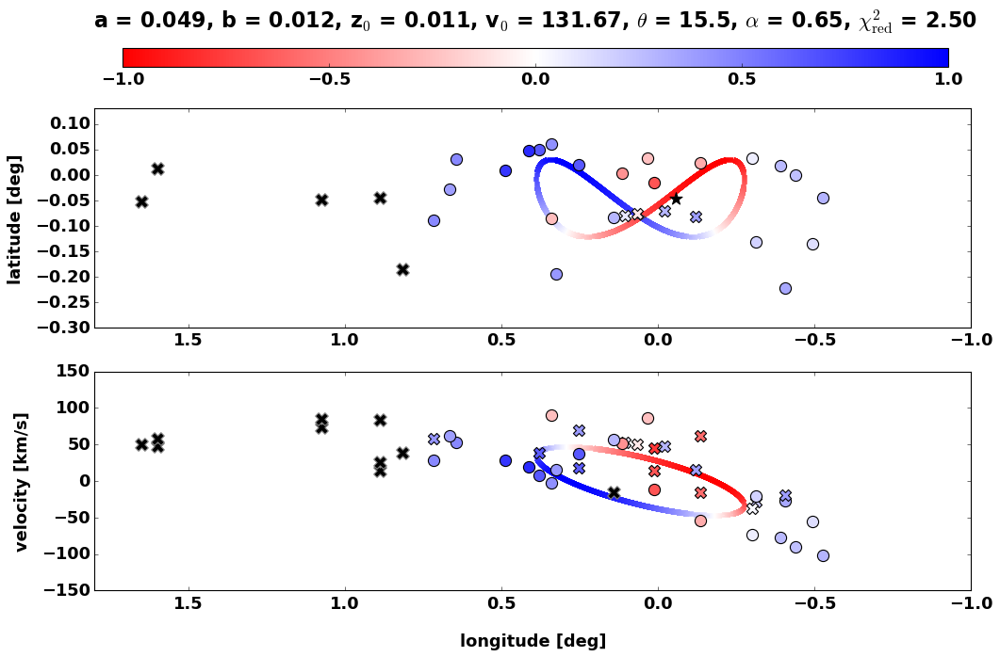

15 15
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 352
    # data points      = 22
    # variables        = 6
    chi-square         = 39.4660155
    reduced chi-square = 2.46662597
    Akaike info crit   = 24.8567446
    Bayesian info crit = 31.4029993
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.05867840 (init = 0.015)
    b_rings:      0.01423731 (init = 0.01)
    z_rings:      0.01078227 (init = 0.0125)
    v_rings:      130.511839 (init = 130)
    theta_rings:  13.8193556 (init = 25)
    alpha_rings:  0.51394498 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03783646] [-0.01566668]
[0.32001448] [-0.21344714] [1.] [-1.]
NICE FIT!


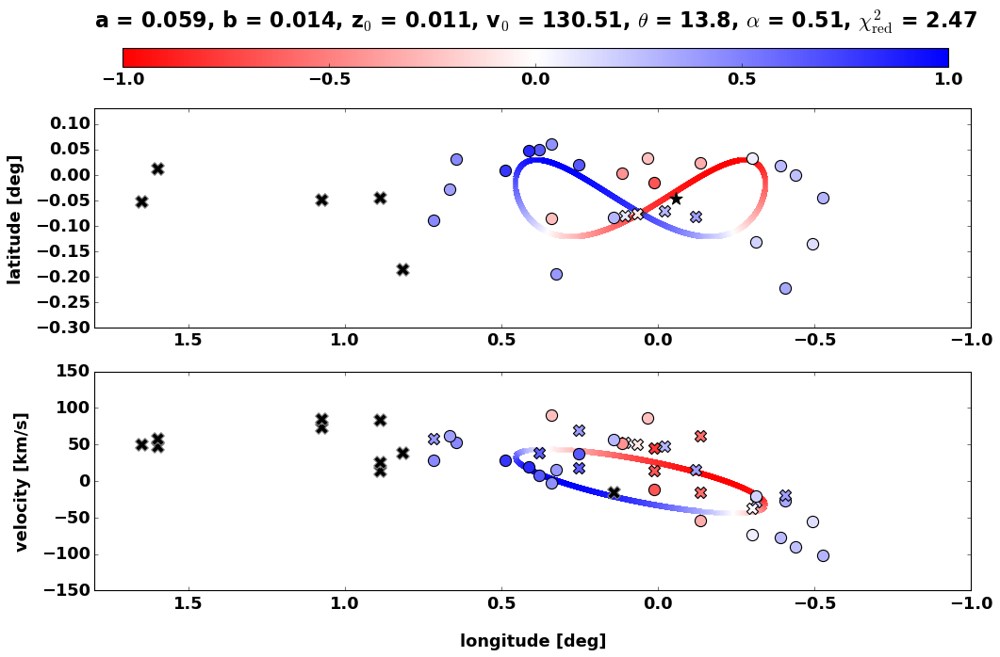

20 20
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 510
    # data points      = 22
    # variables        = 6
    chi-square         = 40.1521568
    reduced chi-square = 2.50950980
    Akaike info crit   = 25.2359415
    Bayesian info crit = 31.7821962
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.02153094 (init = 0.02)
    b_rings:      0.01001161 (init = 0.0122)
    z_rings:      0.01085759 (init = 0.0125)
    v_rings:      130.137624 (init = 130)
    theta_rings:  11.2621666 (init = 25)
    alpha_rings:  0.43020807 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.06057108] [-0.05880388]
[0.10104593] [0.00998851] [1.] [-1.]
NICE FIT!


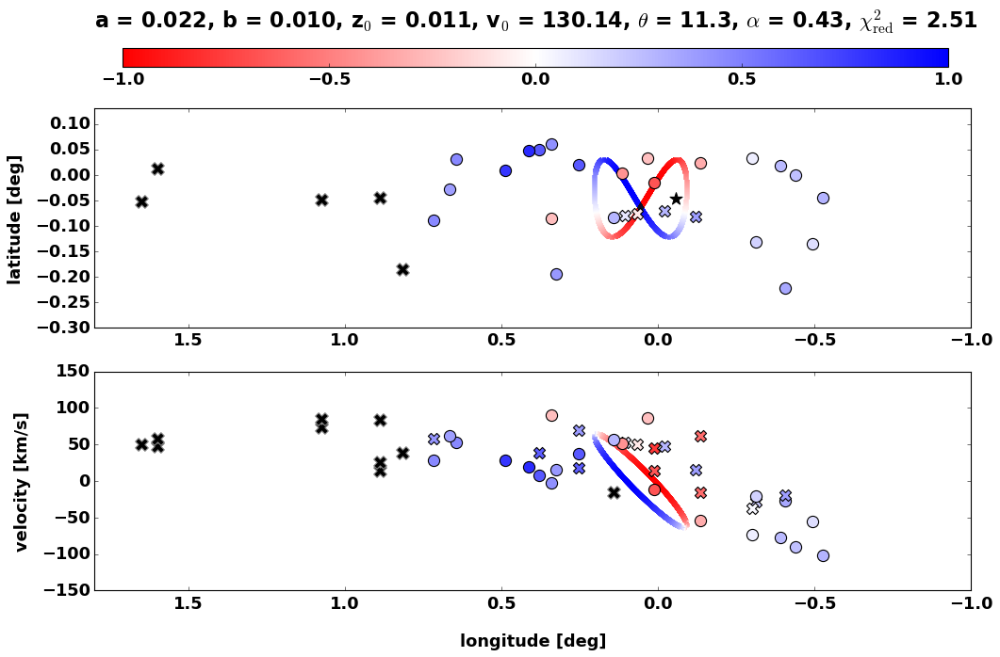

25 25
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 441
    # data points      = 22
    # variables        = 6
    chi-square         = 39.0556782
    reduced chi-square = 2.44097989
    Akaike info crit   = 24.6268081
    Bayesian info crit = 31.1730628
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.05791496 (init = 0.025)
    b_rings:      0.01309531 (init = 0.01525)
    z_rings:      0.01078215 (init = 0.0125)
    v_rings:      132.178807 (init = 130)
    theta_rings:  11.5449431 (init = 25)
    alpha_rings:  0.45313808 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03922098] [-0.01826097]
[0.30485781] [-0.19948489] [1.] [-1.]
NICE FIT!


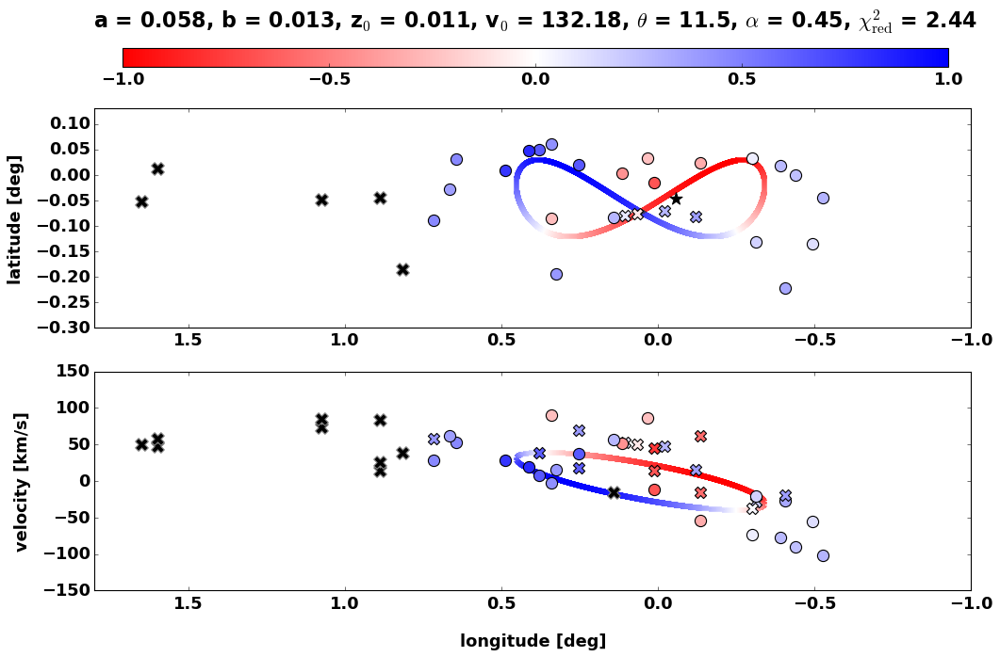

30 30
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 501
    # data points      = 22
    # variables        = 6
    chi-square         = 40.3994331
    reduced chi-square = 2.52496457
    Akaike info crit   = 25.3710126
    Bayesian info crit = 31.9172673
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.05987272 (init = 0.03)
    b_rings:      0.01759090 (init = 0.0183)
    z_rings:      0.01092677 (init = 0.0125)
    v_rings:      130.502348 (init = 130)
    theta_rings:  18.5649986 (init = 25)
    alpha_rings:  0.55008051 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03421201] [-0.01241981]
[0.32694649] [-0.21844935] [1.] [-1.]
NICE FIT!


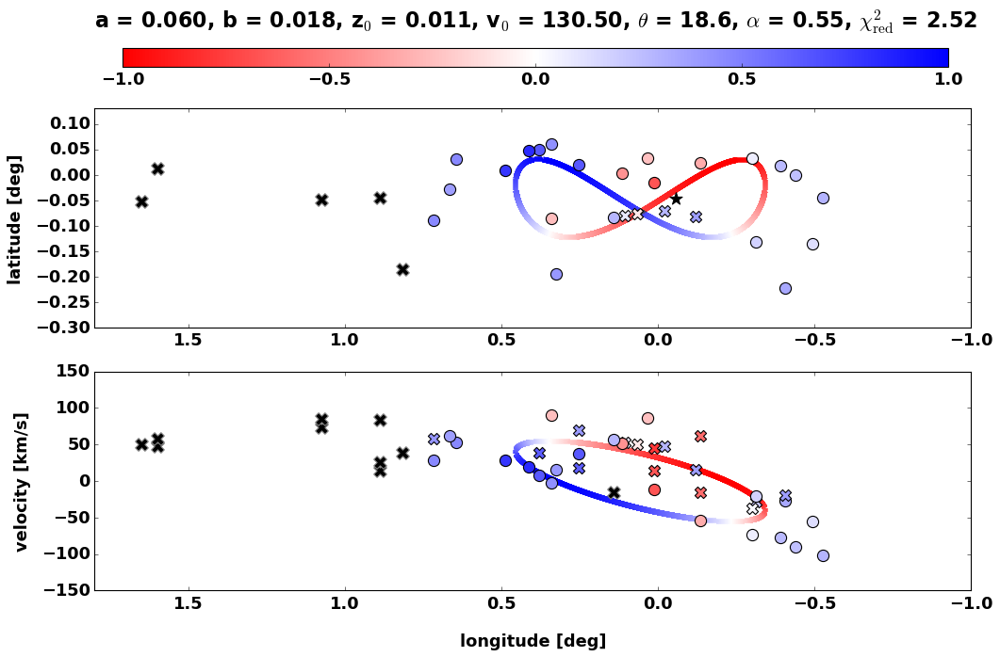

35 35
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 565
    # data points      = 22
    # variables        = 6
    chi-square         = 38.4832906
    reduced chi-square = 2.40520566
    Akaike info crit   = 24.3019971
    Bayesian info crit = 30.8482518
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.05913597 (init = 0.035)
    b_rings:      0.01483142 (init = 0.02135)
    z_rings:      0.01096923 (init = 0.0125)
    v_rings:      131.889018 (init = 130)
    theta_rings:  12.6482993 (init = 25)
    alpha_rings:  0.39854634 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.0379875] [-0.01723613]
[0.30487759] [-0.19894171] [1.] [-1.]
NICE FIT!


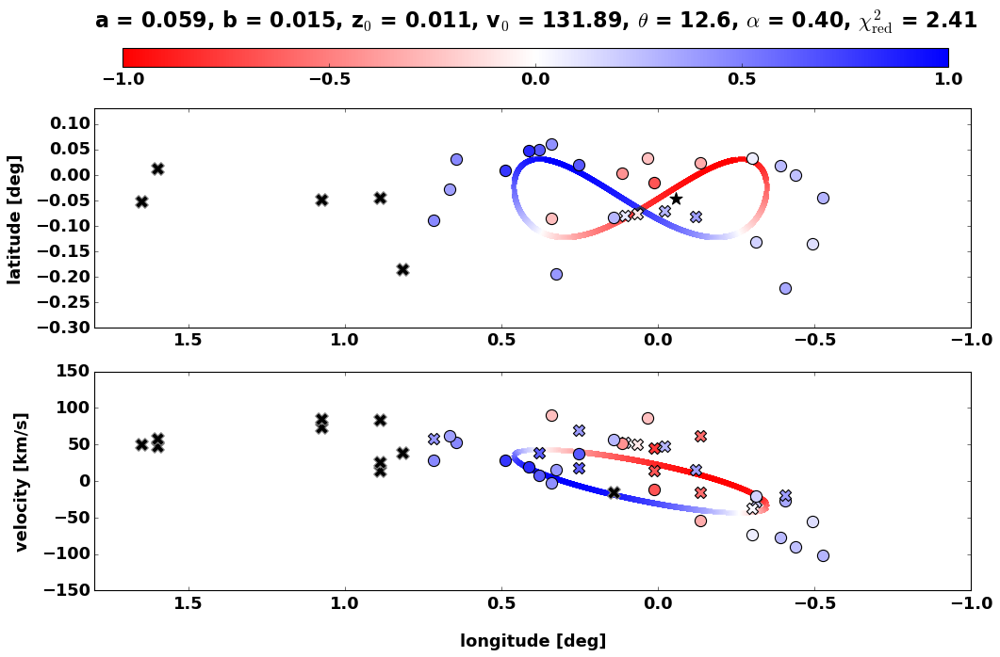

40 40
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 456
    # data points      = 22
    # variables        = 6
    chi-square         = 40.0235634
    reduced chi-square = 2.50147271
    Akaike info crit   = 25.1653700
    Bayesian info crit = 31.7116248
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06173717 (init = 0.04)
    b_rings:      0.01501379 (init = 0.0244)
    z_rings:      0.01138460 (init = 0.0125)
    v_rings:      129.951331 (init = 130)
    theta_rings:  14.7750802 (init = 25)
    alpha_rings:  0.52871548 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03757234] [-0.01343709]
[0.34178298] [-0.23517366] [1.] [-1.]
NICE FIT!


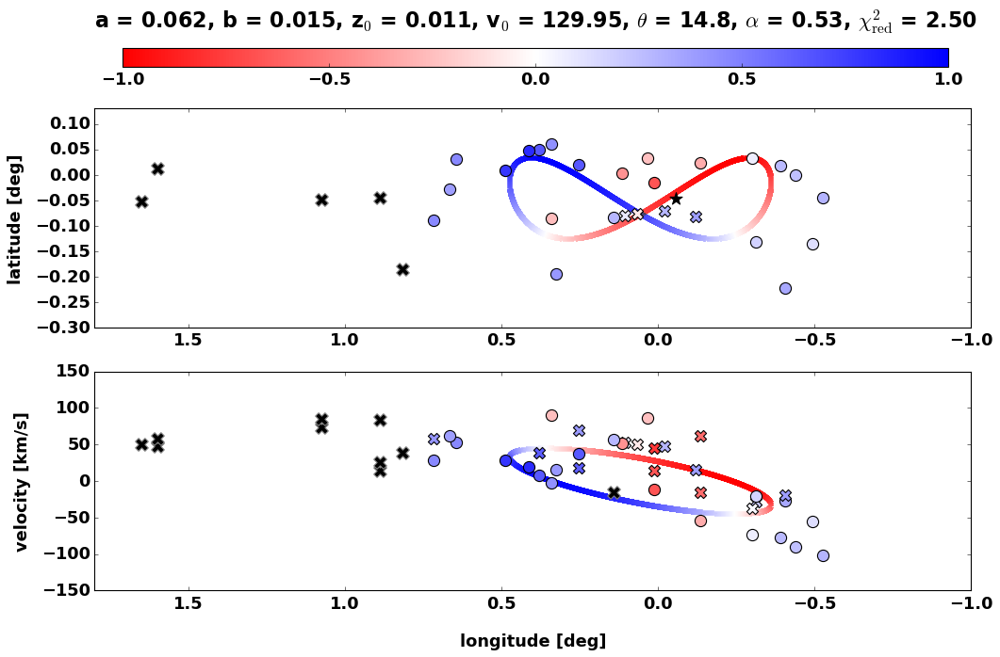

45 45
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 599
    # data points      = 22
    # variables        = 6
    chi-square         = 38.1948766
    reduced chi-square = 2.38717979
    Akaike info crit   = 24.1364965
    Bayesian info crit = 30.6827513
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.05848152 (init = 0.045)
    b_rings:      0.01483979 (init = 0.02745)
    z_rings:      0.01014705 (init = 0.0125)
    v_rings:      132.388264 (init = 130)
    theta_rings:  10.4121843 (init = 25)
    alpha_rings:  0.26904196 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03516589] [-0.01686506]
[0.27314861] [-0.16793194] [1.] [-1.]
NICE FIT!


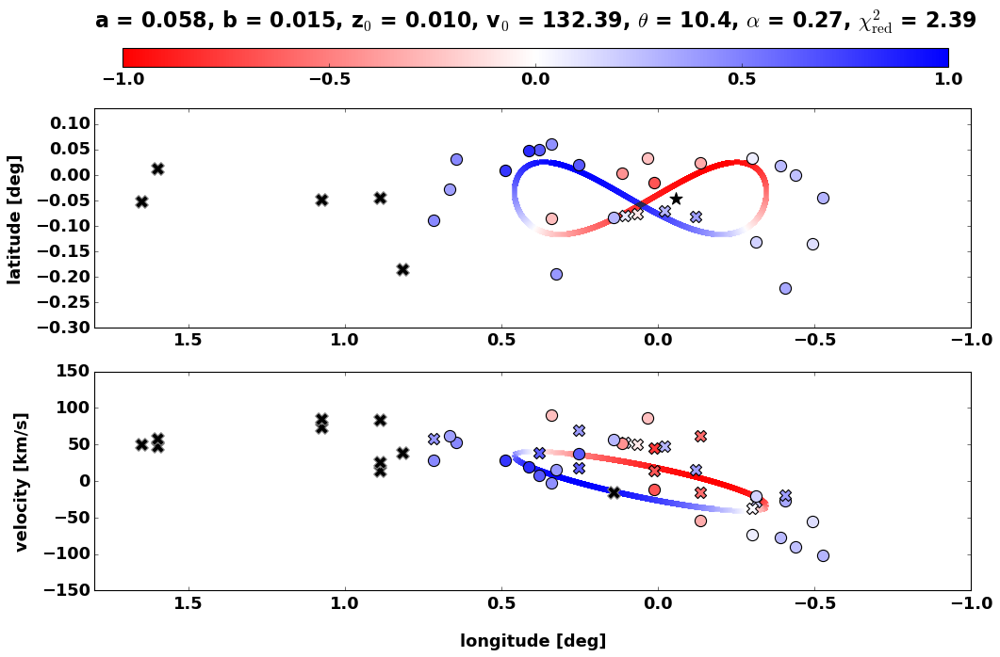

50 50
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 363
    # data points      = 22
    # variables        = 6
    chi-square         = 42.0046084
    reduced chi-square = 2.62528802
    Akaike info crit   = 26.2282114
    Bayesian info crit = 32.7744661
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06880991 (init = 0.05)
    b_rings:      0.02048542 (init = 0.0305)
    z_rings:      0.01104013 (init = 0.0125)
    v_rings:      130.501055 (init = 130)
    theta_rings:  18.3024808 (init = 25)
    alpha_rings:  0.49738717 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.0327336] [-0.00730871]
[0.36290076] [-0.25545306] [1.] [-1.]
NICE FIT!


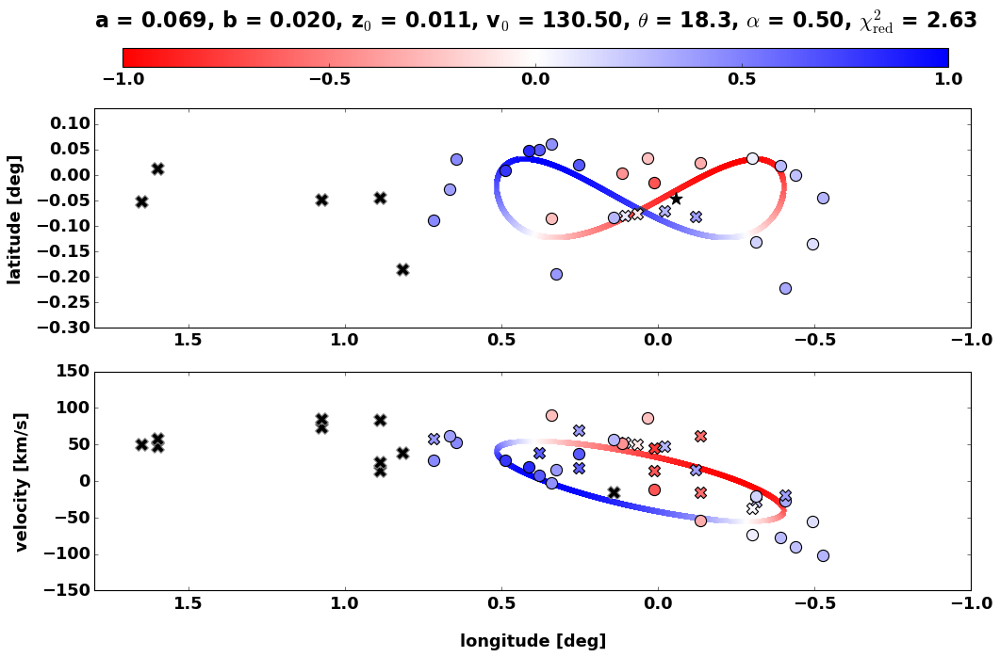

55 55
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 401
    # data points      = 22
    # variables        = 6
    chi-square         = 38.6138477
    reduced chi-square = 2.41336548
    Akaike info crit   = 24.3765072
    Bayesian info crit = 30.9227619
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06016074 (init = 0.055)
    b_rings:      0.01714035 (init = 0.03355)
    z_rings:      0.01082231 (init = 0.0125)
    v_rings:      128.722437 (init = 130)
    theta_rings:  11.7880777 (init = 25)
    alpha_rings:  0.20441083 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03556932] [-0.01701726]
[0.276361] [-0.17047766] [1.] [-1.]
NICE FIT!


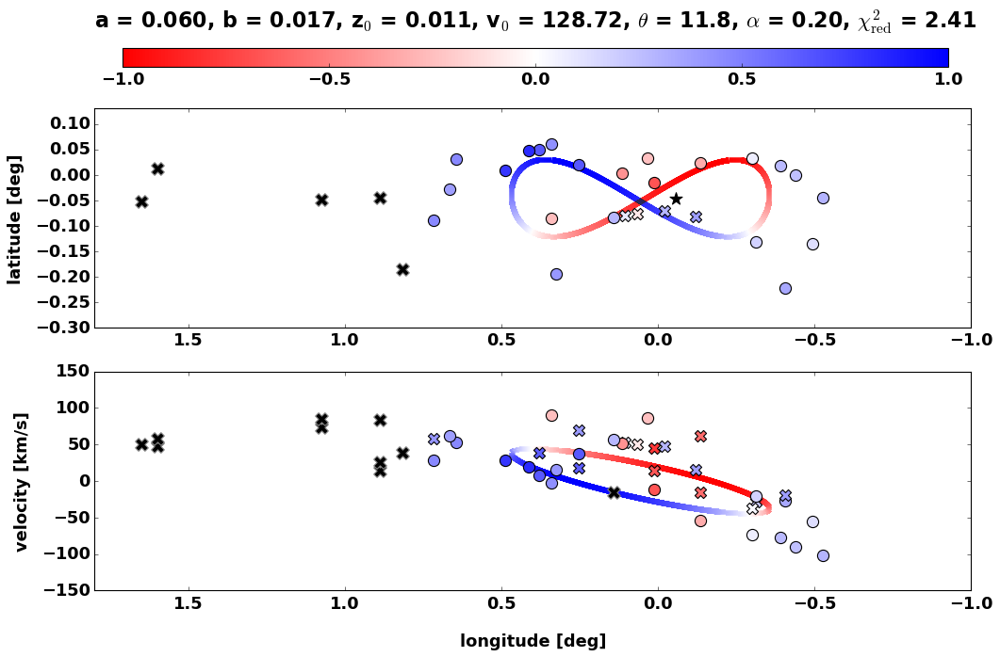

60 60
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 429
    # data points      = 22
    # variables        = 6
    chi-square         = 41.6605085
    reduced chi-square = 2.60378178
    Akaike info crit   = 26.0472461
    Bayesian info crit = 32.5935008
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06841418 (init = 0.06)
    b_rings:      0.02372375 (init = 0.0366)
    z_rings:      0.01204900 (init = 0.0125)
    v_rings:      130.223470 (init = 130)
    theta_rings:  12.1593250 (init = 25)
    alpha_rings:  0.16865409 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.04116152] [-0.02330978]
[0.26982] [-0.16413988] [1.] [-1.]
NICE FIT!


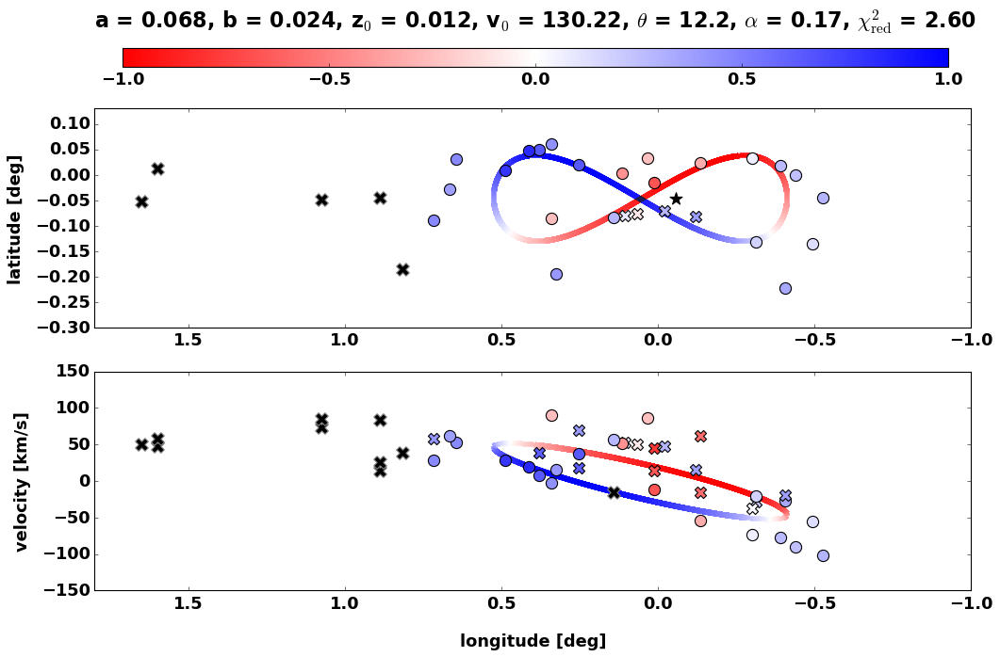

65 65
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 407
    # data points      = 22
    # variables        = 6
    chi-square         = 41.4121593
    reduced chi-square = 2.58825996
    Akaike info crit   = 25.9157059
    Bayesian info crit = 32.4619606
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06532462 (init = 0.065)
    b_rings:      0.02101898 (init = 0.03965)
    z_rings:      0.01251439 (init = 0.0125)
    v_rings:      130.108754 (init = 130)
    theta_rings:  13.6771001 (init = 25)
    alpha_rings:  0.39886060 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.04700612] [-0.02727961]
[0.29281202] [-0.18682867] [1.] [-1.]
NICE FIT!


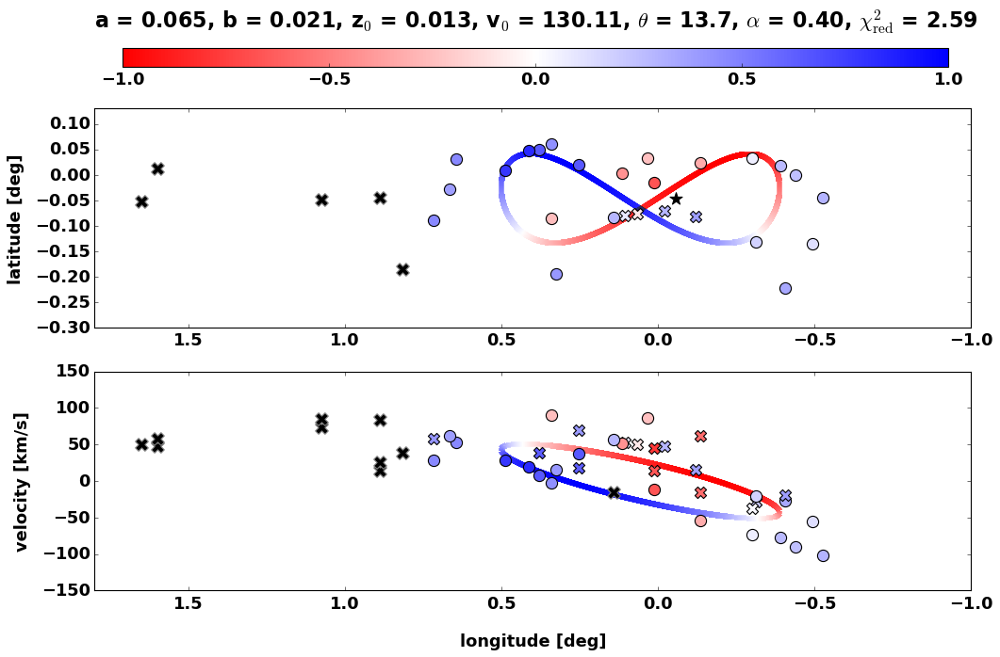

70 70
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 389
    # data points      = 22
    # variables        = 6
    chi-square         = 41.1466557
    reduced chi-square = 2.57166598
    Akaike info crit   = 25.7742044
    Bayesian info crit = 32.3204591
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06508529 (init = 0.07)
    b_rings:      0.02029660 (init = 0.0427)
    z_rings:      0.01236144 (init = 0.0125)
    v_rings:      131.450133 (init = 130)
    theta_rings:  12.5480319 (init = 25)
    alpha_rings:  0.32685911 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.04549016] [-0.02717438]
[0.28558032] [-0.18003046] [1.] [-1.]
NICE FIT!


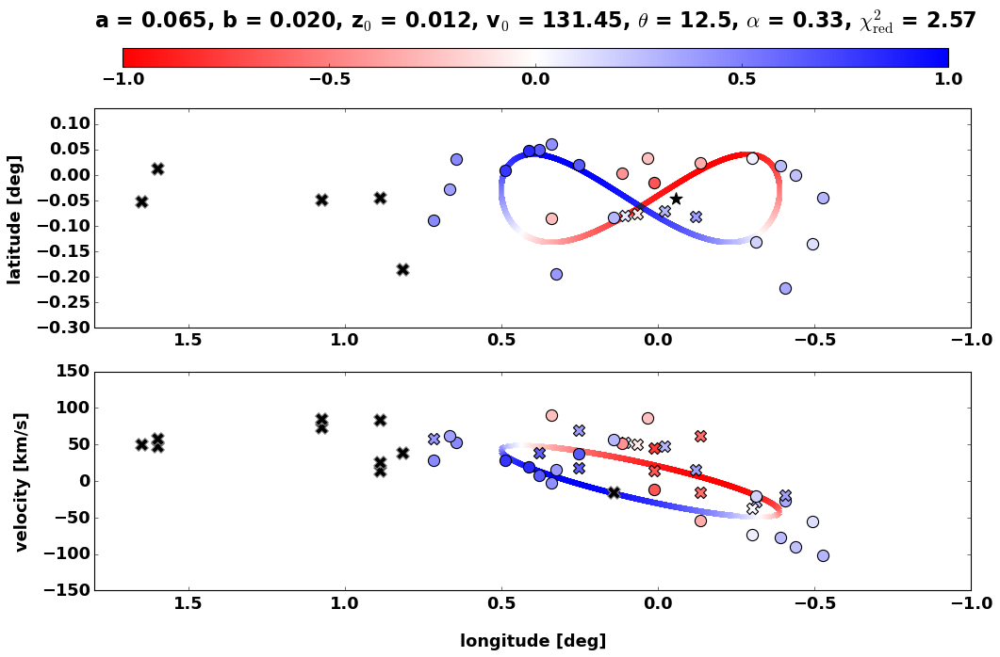

75 75
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 442
    # data points      = 22
    # variables        = 6
    chi-square         = 41.6686401
    reduced chi-square = 2.60429001
    Akaike info crit   = 26.0515398
    Bayesian info crit = 32.5977946
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06872694 (init = 0.075)
    b_rings:      0.02375888 (init = 0.04575)
    z_rings:      0.01201138 (init = 0.0125)
    v_rings:      131.759013 (init = 130)
    theta_rings:  12.2556484 (init = 25)
    alpha_rings:  0.17120009 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.04047381] [-0.02283017]
[0.27266001] [-0.16702572] [1.] [-1.]
NICE FIT!


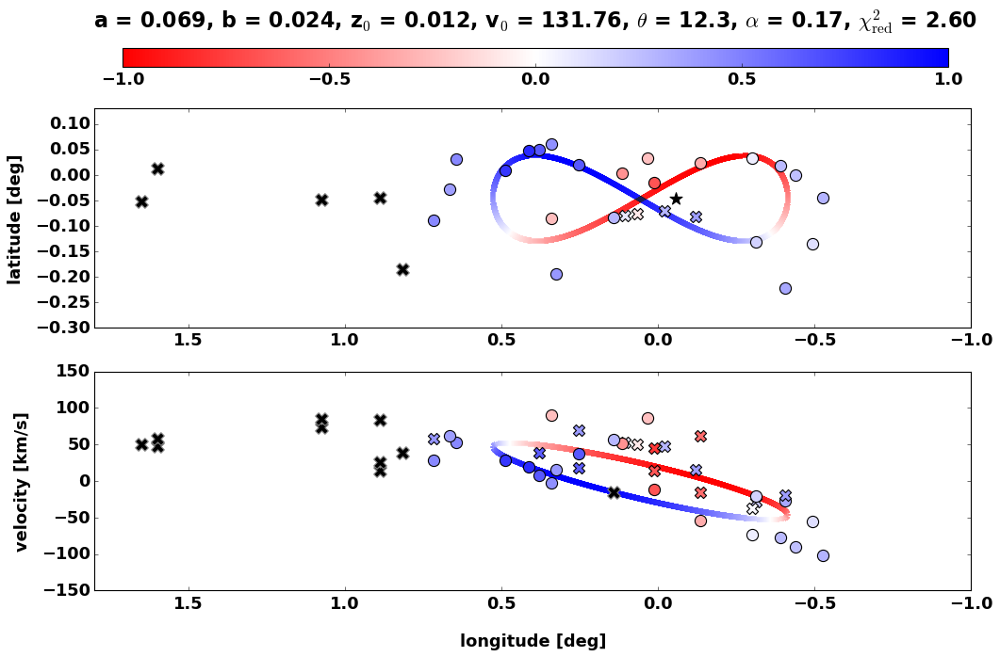

80 80
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 343
    # data points      = 22
    # variables        = 6
    chi-square         = 40.3478149
    reduced chi-square = 2.52173843
    Akaike info crit   = 25.3428853
    Bayesian info crit = 31.8891400
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.05834875 (init = 0.08)
    b_rings:      0.01497014 (init = 0.0488)
    z_rings:      0.01278795 (init = 0.0125)
    v_rings:      129.675310 (init = 130)
    theta_rings:  6.70936594 (init = 25)
    alpha_rings:  0.17410588 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.04914481] [-0.03773305]
[0.21001633] [-0.10538694] [1.] [-1.]
NICE FIT!


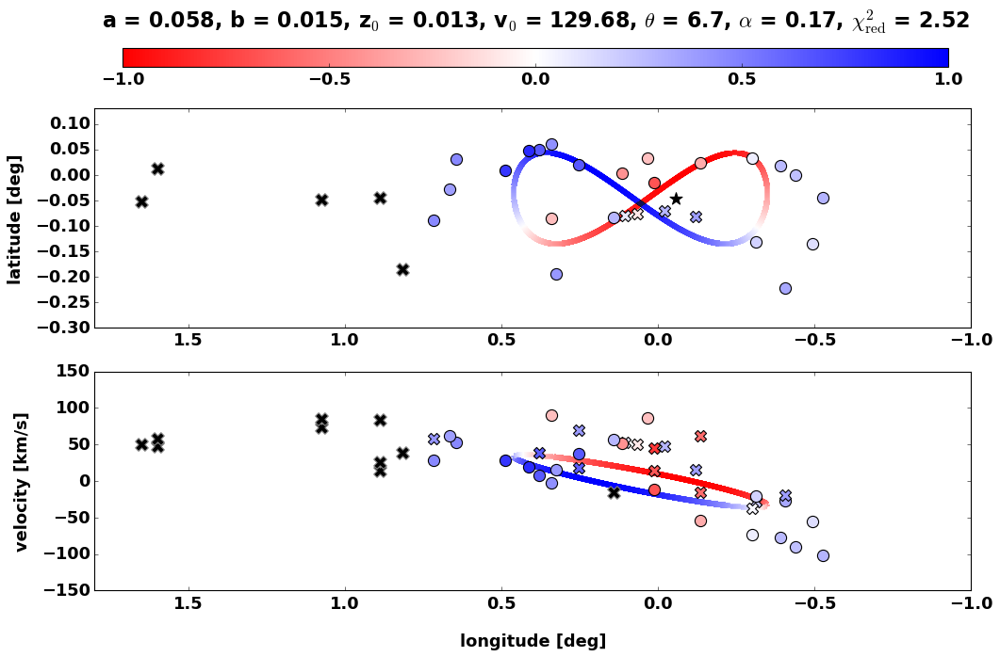

85 85
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 470
    # data points      = 22
    # variables        = 6
    chi-square         = 41.6618965
    reduced chi-square = 2.60386853
    Akaike info crit   = 26.0479791
    Bayesian info crit = 32.5942338
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06825051 (init = 0.085)
    b_rings:      0.02382613 (init = 0.05185)
    z_rings:      0.01207432 (init = 0.0125)
    v_rings:      128.464219 (init = 130)
    theta_rings:  12.3236012 (init = 25)
    alpha_rings:  0.17648665 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.0407579] [-0.02302694]
[0.26992995] [-0.16414849] [1.] [-1.]
NICE FIT!


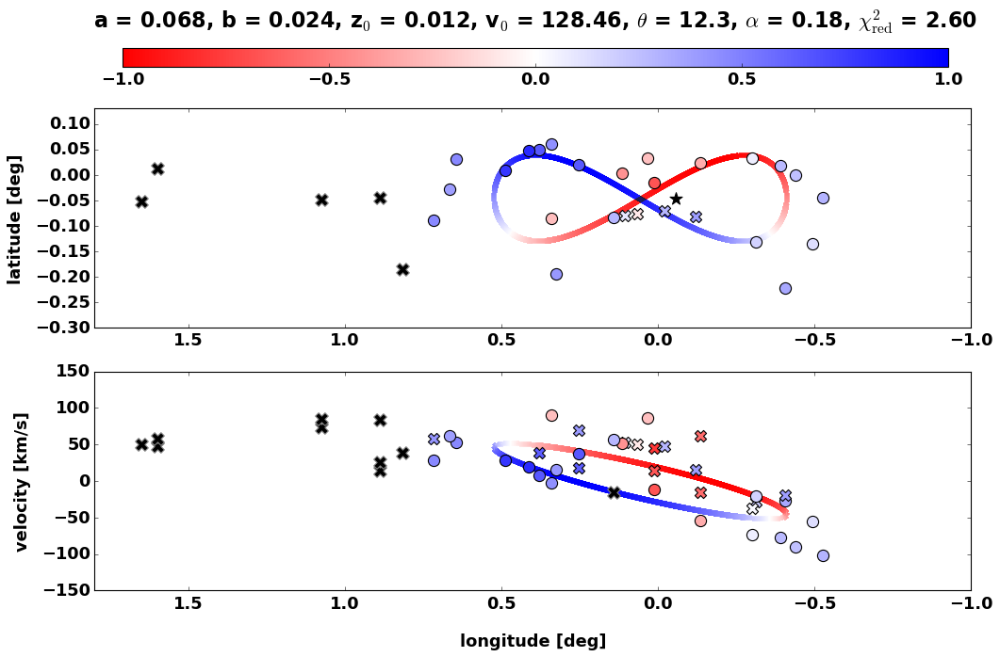

90 90
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 445
    # data points      = 22
    # variables        = 6
    chi-square         = 42.1957162
    reduced chi-square = 2.63723226
    Akaike info crit   = 26.3280775
    Bayesian info crit = 32.8743322
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.07472682 (init = 0.09)
    b_rings:      0.02625791 (init = 0.0549)
    z_rings:      0.01196859 (init = 0.0125)
    v_rings:      134.974865 (init = 130)
    theta_rings:  9.06958936 (init = 25)
    alpha_rings: -0.08832448 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03733857] [-0.0221328]
[0.23933297] [-0.13459218] [1.] [-1.]
NICE FIT!


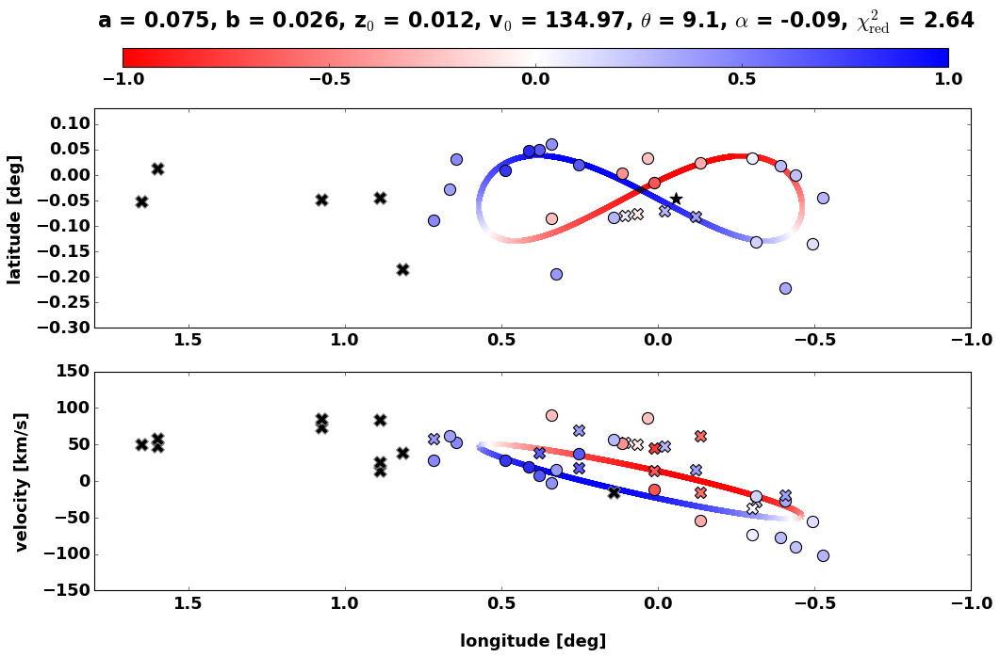

95 95
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 405
    # data points      = 22
    # variables        = 6
    chi-square         = 41.6666896
    reduced chi-square = 2.60416810
    Akaike info crit   = 26.0505100
    Bayesian info crit = 32.5967647
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06815090 (init = 0.095)
    b_rings:      0.02439446 (init = 0.05795)
    z_rings:      0.01202333 (init = 0.0125)
    v_rings:      125.139109 (init = 130)
    theta_rings:  12.7182334 (init = 25)
    alpha_rings:  0.17663758 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03967317] [-0.02187871]
[0.26903195] [-0.16298369] [1.] [-1.]
NICE FIT!


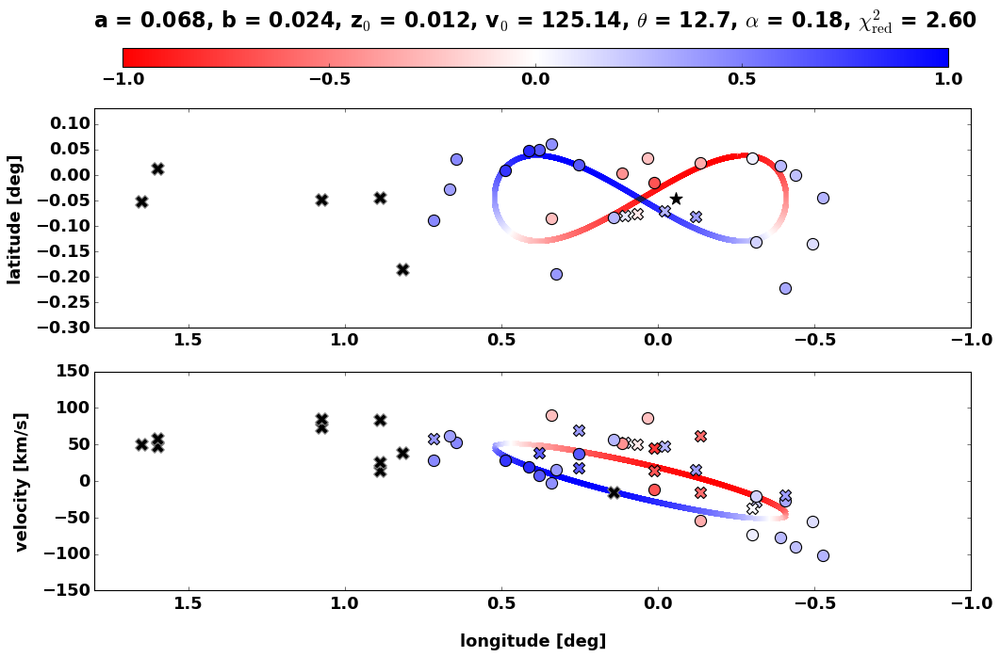

100 100
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 381
    # data points      = 22
    # variables        = 6
    chi-square         = 41.7105416
    reduced chi-square = 2.60690885
    Akaike info crit   = 26.0736517
    Bayesian info crit = 32.6199064
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06910703 (init = 0.1)
    b_rings:      0.02538005 (init = 0.061)
    z_rings:      0.01195919 (init = 0.0125)
    v_rings:      125.297569 (init = 130)
    theta_rings:  11.9944695 (init = 25)
    alpha_rings:  0.10738116 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03819273] [-0.02192105]
[0.25764026] [-0.15161137] [1.] [-1.]
NICE FIT!


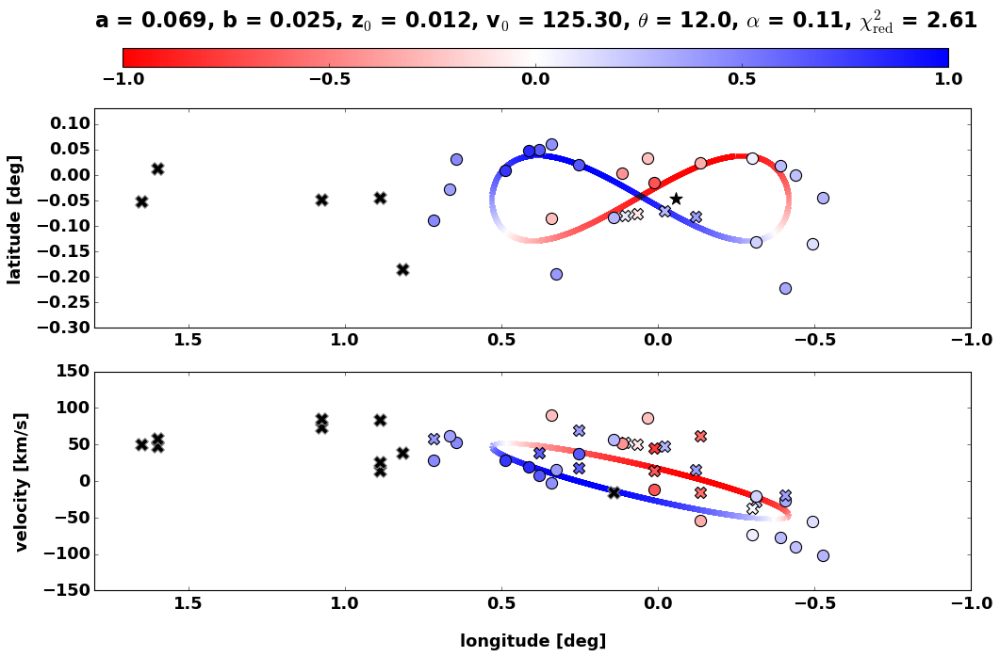

105 105
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 699
    # data points      = 22
    # variables        = 6
    chi-square         = 38.5964060
    reduced chi-square = 2.41227537
    Akaike info crit   = 24.3665676
    Bayesian info crit = 30.9128223
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06037169 (init = 0.105)
    b_rings:      0.01806850 (init = 0.06405)
    z_rings:      0.01077027 (init = 0.0125)
    v_rings:      124.339574 (init = 130)
    theta_rings:  12.1998121 (init = 25)
    alpha_rings:  0.17986325 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03324895] [-0.01494892]
[0.27292165] [-0.16669891] [1.] [-1.]
NICE FIT!


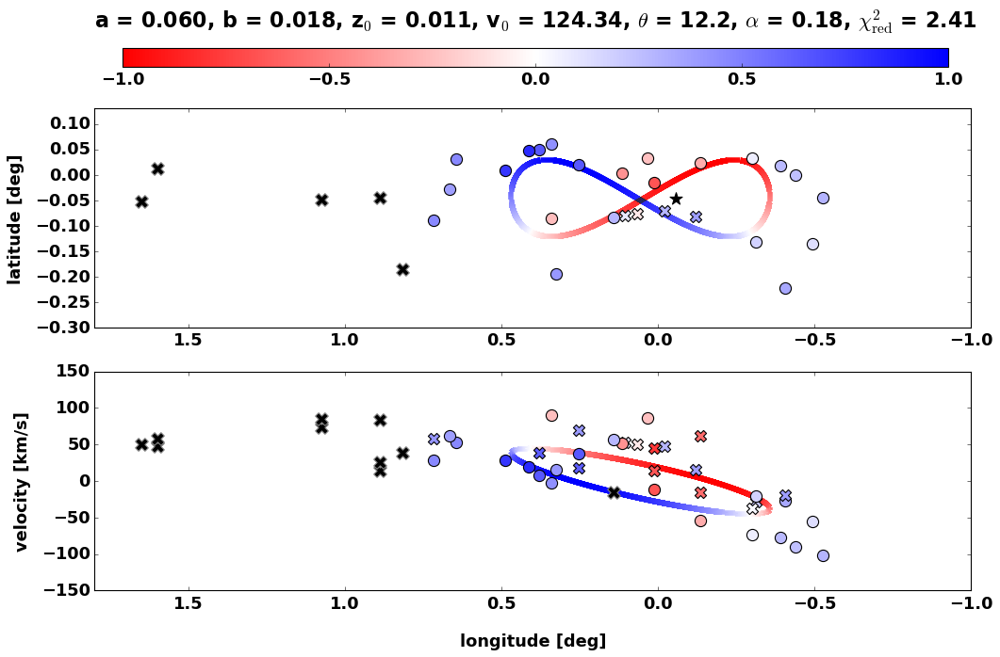

110 110
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 457
    # data points      = 22
    # variables        = 6
    chi-square         = 41.6633317
    reduced chi-square = 2.60395823
    Akaike info crit   = 26.0487370
    Bayesian info crit = 32.5949917
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06876841 (init = 0.11)
    b_rings:      0.02351315 (init = 0.0671)
    z_rings:      0.01202379 (init = 0.0125)
    v_rings:      133.738283 (init = 130)
    theta_rings:  11.9388668 (init = 25)
    alpha_rings:  0.16443952 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.04132947] [-0.02350584]
[0.27110358] [-0.16561552] [1.] [-1.]
NICE FIT!


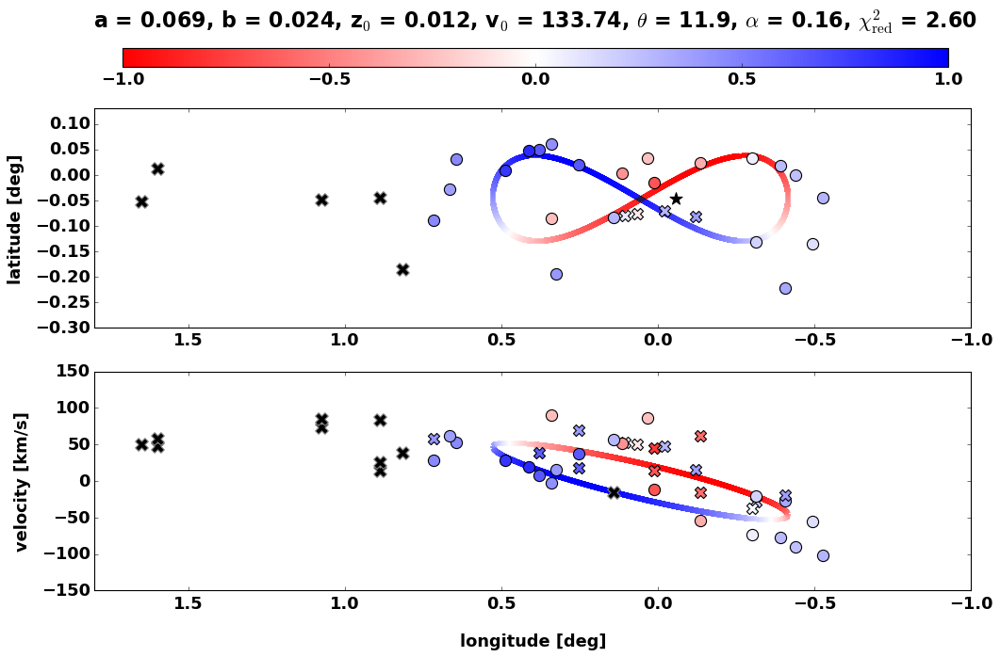

115 115
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 805
    # data points      = 22
    # variables        = 6
    chi-square         = 44.8113302
    reduced chi-square = 2.80070814
    Akaike info crit   = 27.6512083
    Bayesian info crit = 34.1974630
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06484837 (init = 0.115)
    b_rings:      0.02598192 (init = 0.07015)
    z_rings:      0.01041861 (init = 0.0125)
    v_rings:      112.369368 (init = 130)
    theta_rings:  26.5606248 (init = 25)
    alpha_rings:  0.49208243 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.02224326] [-0.00150056]
[0.32062639] [-0.21031945] [1.] [-1.]
NICE FIT!


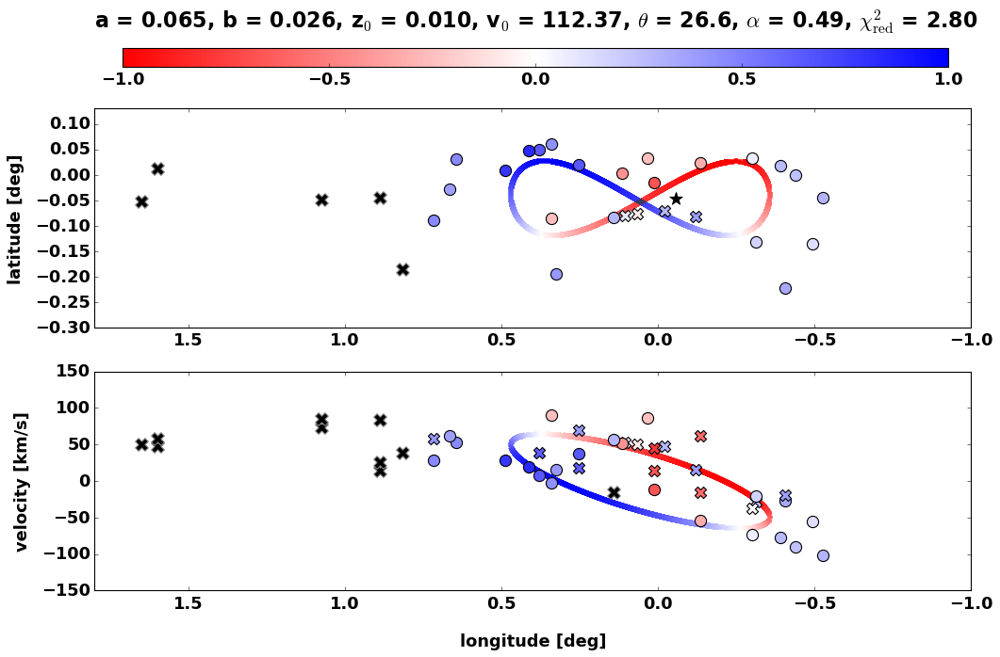

120 120
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 510
    # data points      = 22
    # variables        = 6
    chi-square         = 41.6633419
    reduced chi-square = 2.60395887
    Akaike info crit   = 26.0487423
    Bayesian info crit = 32.5949970
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06850818 (init = 0.12)
    b_rings:      0.02343955 (init = 0.0732)
    z_rings:      0.01201608 (init = 0.0125)
    v_rings:      133.264001 (init = 130)
    theta_rings:  11.8691386 (init = 25)
    alpha_rings:  0.15645630 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.04094251] [-0.02342871]
[0.26926546] [-0.16373609] [1.] [-1.]
NICE FIT!


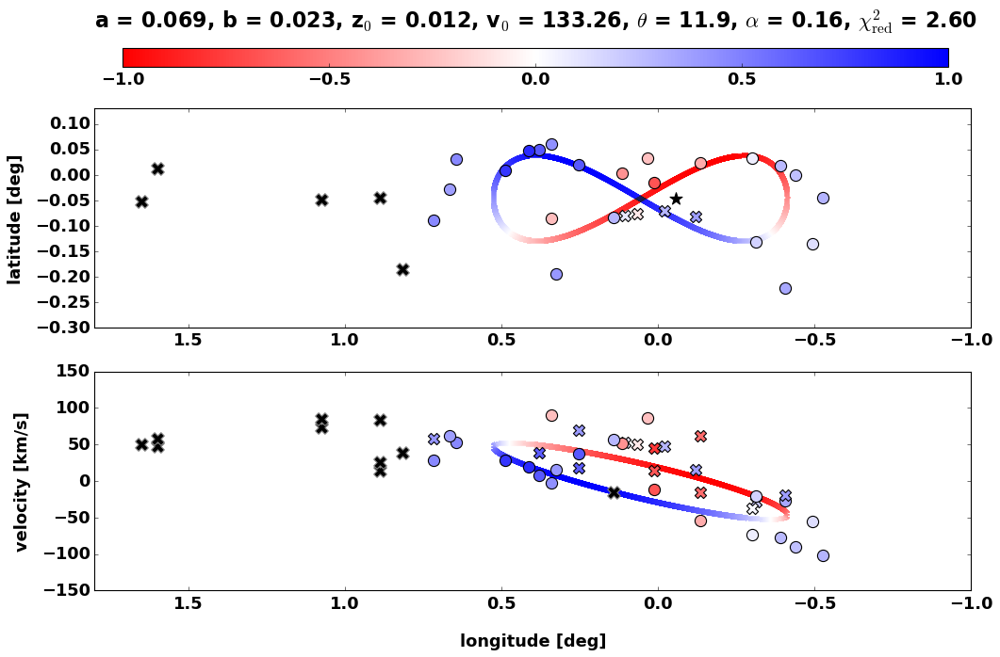

125 125
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 929
    # data points      = 22
    # variables        = 6
    chi-square         = 40.9152774
    reduced chi-square = 2.55720483
    Akaike info crit   = 25.6501435
    Bayesian info crit = 32.1963982
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.08887844 (init = 0.125)
    b_rings:      0.03079132 (init = 0.07625)
    z_rings:      0.01302519 (init = 0.0125)
    v_rings:      139.173019 (init = 130)
    theta_rings:  13.8782154 (init = 25)
    alpha_rings: -0.77002097 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.012595] [0.03743068]
[0.35976161] [-0.25631939] [1.] [-1.]
NICE FIT!


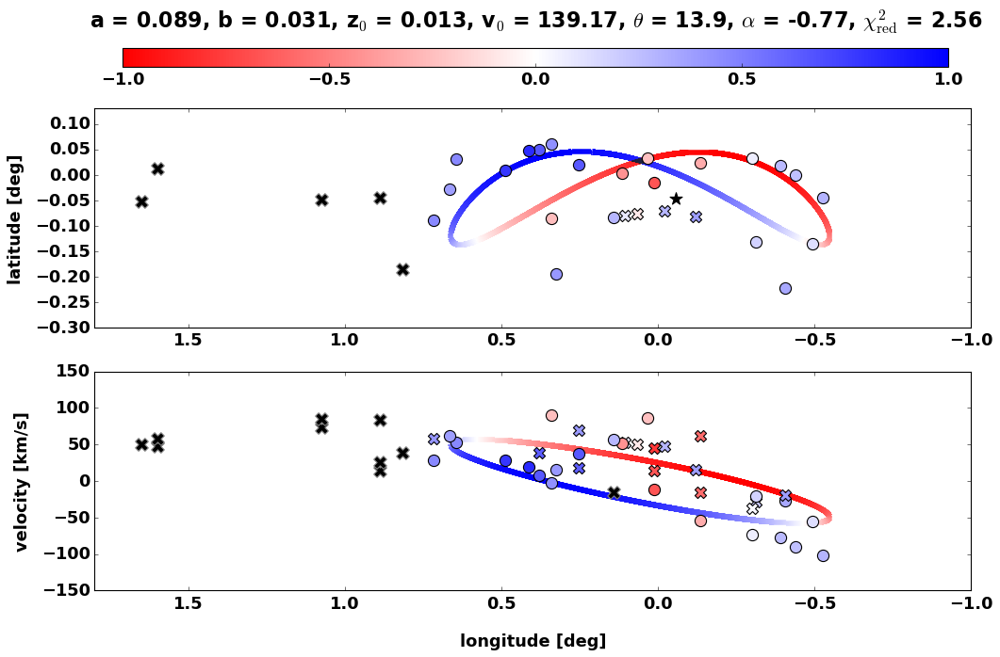

130 130
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 450
    # data points      = 22
    # variables        = 6
    chi-square         = 48.1728640
    reduced chi-square = 3.01080400
    Akaike info crit   = 29.2425753
    Bayesian info crit = 35.7888300
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.11391768 (init = 0.13)
    b_rings:      0.05096099 (init = 0.0793)
    z_rings:      0.01388836 (init = 0.0125)
    v_rings:      130.301115 (init = 130)
    theta_rings:  7.34537085 (init = 25)
    alpha_rings: -0.33357332 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.03331058] [-0.01886849]
[0.22656433] [-0.12327223] [1.] [-1.]
NICE FIT!


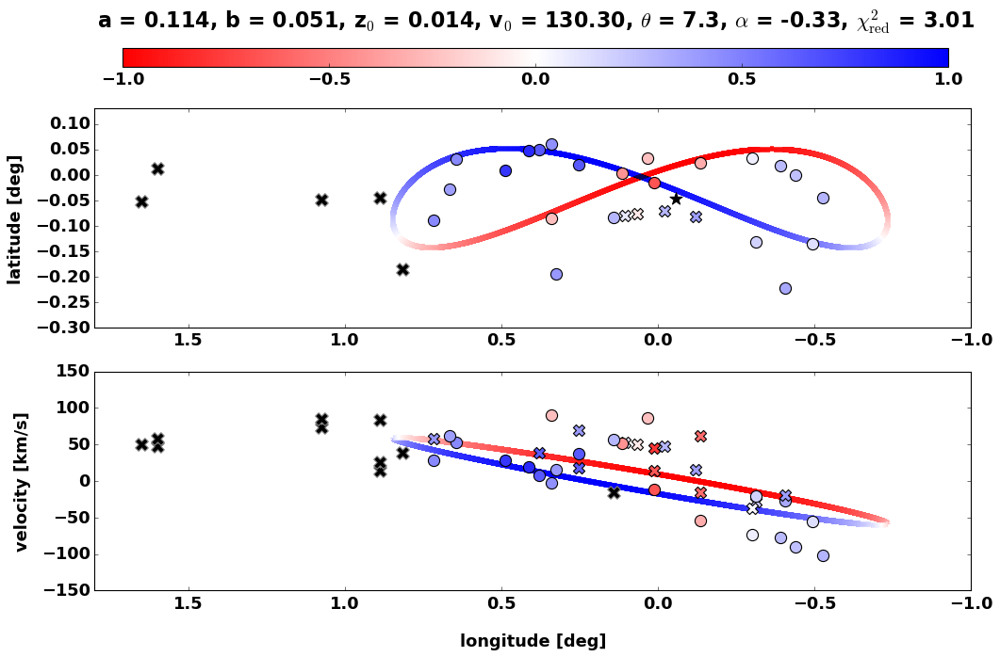

135 135
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 1041
    # data points      = 22
    # variables        = 6
    chi-square         = 44.1902456
    reduced chi-square = 2.76189035
    Akaike info crit   = 27.3441557
    Bayesian info crit = 33.8904105
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.06666287 (init = 0.135)
    b_rings:      0.03186012 (init = 0.08235)
    z_rings:      0.00983278 (init = 0.0125)
    v_rings:      106.328866 (init = 130)
    theta_rings:  21.1520149 (init = 25)
    alpha_rings:  0.04093832 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.01760217] [-0.00047944]
[0.2655445] [-0.15624627] [1.] [-1.]
NICE FIT!


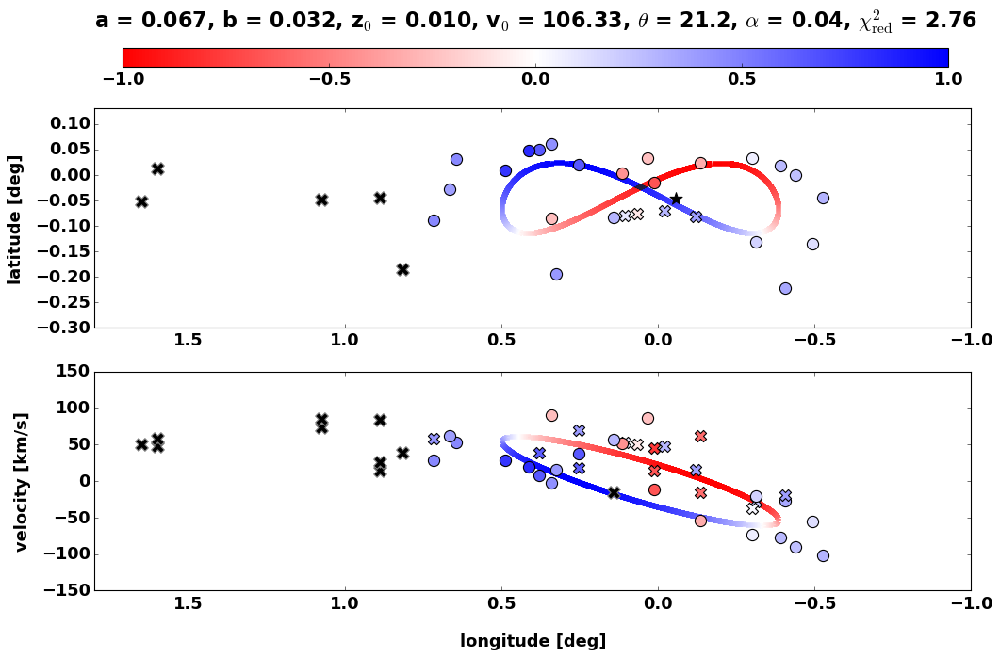

140 140
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 672
    # data points      = 22
    # variables        = 6
    chi-square         = 40.3823707
    reduced chi-square = 2.52389817
    Akaike info crit   = 25.3617191
    Bayesian info crit = 31.9079738
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.08578824 (init = 0.14)
    b_rings:      0.03681166 (init = 0.0854)
    z_rings:      0.01299189 (init = 0.0125)
    v_rings:      123.106024 (init = 130)
    theta_rings:  17.6553025 (init = 25)
    alpha_rings: -0.79552046 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.01370047] [0.03595278]
[0.33104743] [-0.22419694] [1.] [-1.]
NICE FIT!


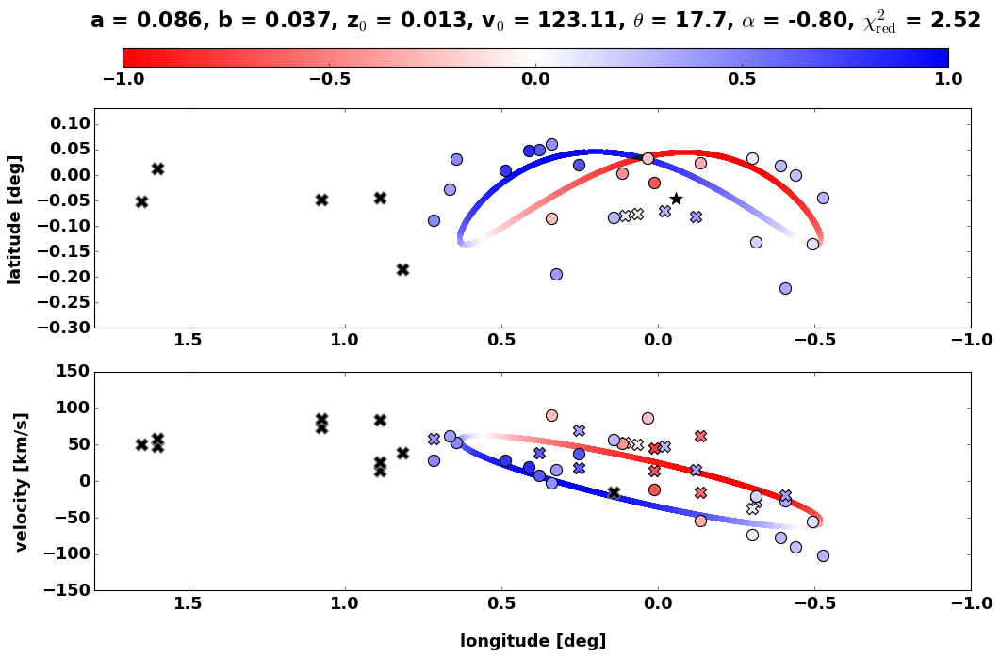

145 145
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 504
    # data points      = 22
    # variables        = 6
    chi-square         = 39.6236334
    reduced chi-square = 2.47647709
    Akaike info crit   = 24.9444324
    Bayesian info crit = 31.4906871
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.09995509 (init = 0.145)
    b_rings:      0.05688972 (init = 0.08845)
    z_rings:      0.01565839 (init = 0.0125)
    v_rings:      98.7075496 (init = 130)
    theta_rings:  29.1161376 (init = 25)
    alpha_rings: -0.71126903 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.01785509] [0.04032953]
[0.34360259] [-0.23339202] [1.] [-1.]
NICE FIT!


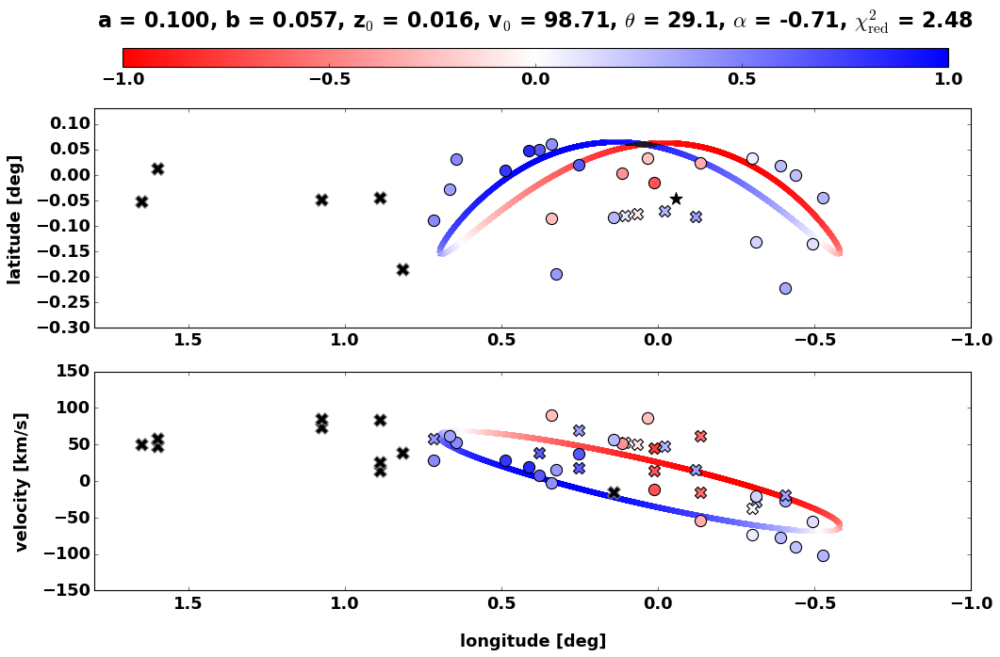

150 150
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 548
    # data points      = 22
    # variables        = 6
    chi-square         = 40.8454904
    reduced chi-square = 2.55284315
    Akaike info crit   = 25.6125873
    Bayesian info crit = 32.1588420
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.09494947 (init = 0.15)
    b_rings:      0.04092566 (init = 0.0915)
    z_rings:      0.01389351 (init = 0.0125)
    v_rings:      91.5414191 (init = 130)
    theta_rings:  22.2800534 (init = 25)
    alpha_rings: -0.56256706 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.00600257] [0.03305618]
[0.39810467] [-0.29060527] [1.] [-1.]
NICE FIT!


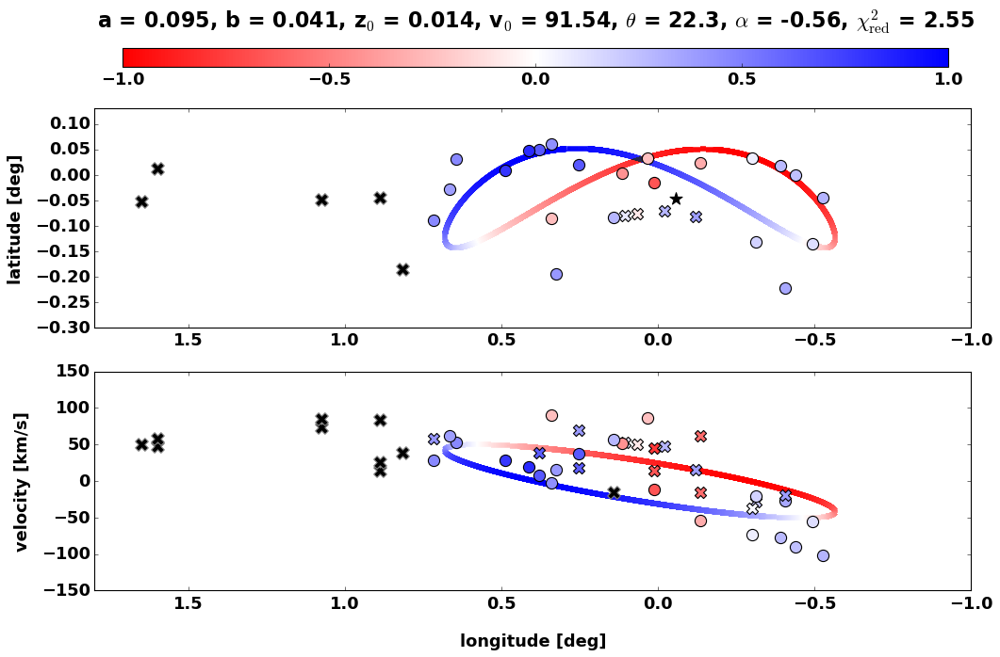

155 155
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 939
    # data points      = 22
    # variables        = 6
    chi-square         = 40.2519940
    reduced chi-square = 2.51574962
    Akaike info crit   = 25.2905760
    Bayesian info crit = 31.8368307
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.08041028 (init = 0.155)
    b_rings:      0.02338897 (init = 0.09455)
    z_rings:      0.01343808 (init = 0.0125)
    v_rings:      172.415313 (init = 130)
    theta_rings:  10.2082753 (init = 25)
    alpha_rings: -0.75565153 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.01400895] [0.03817821]
[0.31756307] [-0.21535143] [1.] [-1.]
NICE FIT!


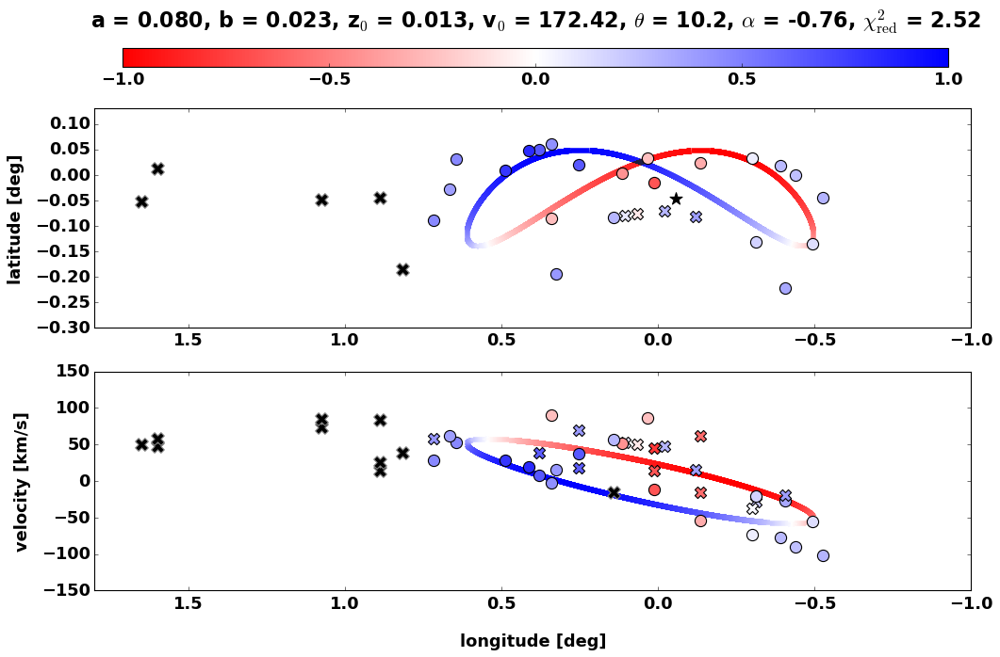

160 160
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 831
    # data points      = 22
    # variables        = 6
    chi-square         = 38.7998995
    reduced chi-square = 2.42499372
    Akaike info crit   = 24.4822545
    Bayesian info crit = 31.0285092
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.15682844 (init = 0.16)
    b_rings:      0.07333056 (init = 0.0976)
    z_rings:      0.01500572 (init = 0.0125)
    v_rings:      76.1865755 (init = 130)
    theta_rings:  71.3807954 (init = 25)
    alpha_rings:  0.64258920 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.00257183] [0.02322493]
[0.32966152] [-0.21051821] [1.] [-1.]
NICE FIT!


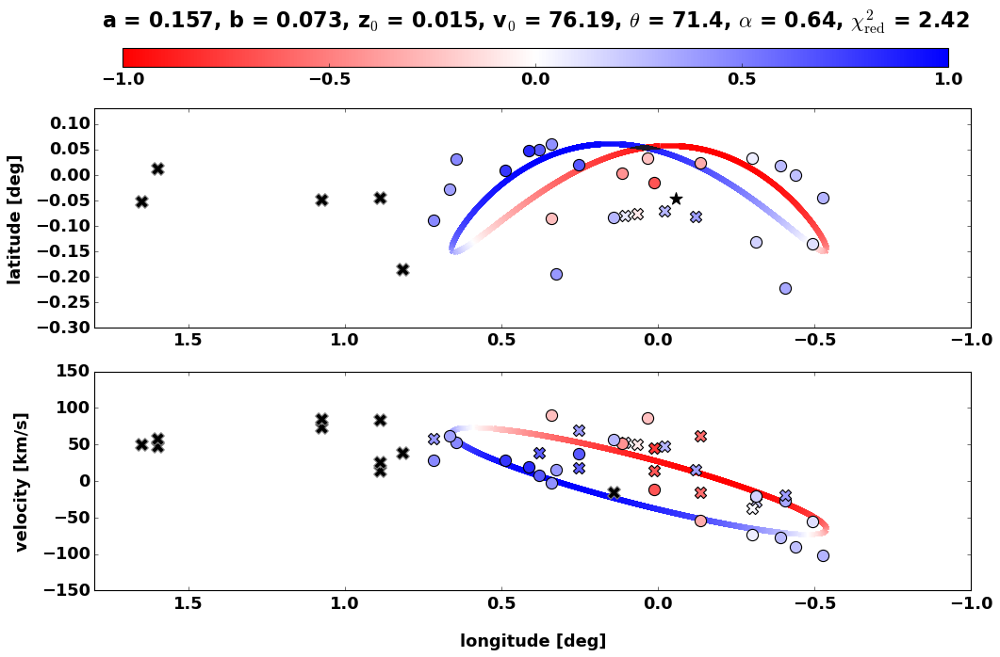

165 165
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 682
    # data points      = 22
    # variables        = 6
    chi-square         = 38.6320498
    reduced chi-square = 2.41450311
    Akaike info crit   = 24.3868753
    Bayesian info crit = 30.9331300
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.08661530 (init = 0.165)
    b_rings:      0.04312579 (init = 0.10065)
    z_rings:      0.01602821 (init = 0.0125)
    v_rings:      109.219451 (init = 130)
    theta_rings:  24.6471227 (init = 25)
    alpha_rings: -0.81232551 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.02843774] [0.05039988]
[0.33509804] [-0.2255794] [1.] [-1.]
NICE FIT!


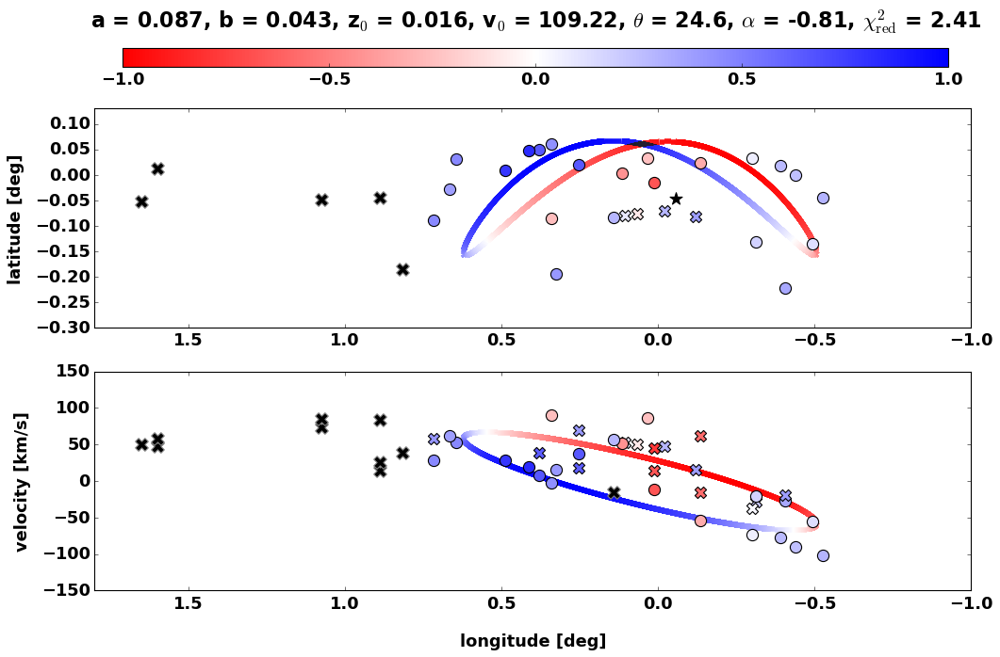

170 170
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 555
    # data points      = 22
    # variables        = 6
    chi-square         = 45.4069224
    reduced chi-square = 2.83793265
    Akaike info crit   = 27.9416865
    Bayesian info crit = 34.4879413
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.16722623 (init = 0.17)
    b_rings:      0.09873597 (init = 0.1037)
    z_rings:      0.01491210 (init = 0.0125)
    v_rings:      90.7403315 (init = 130)
    theta_rings:  69.4988906 (init = 25)
    alpha_rings:  0.66121616 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.00210687] [0.02213631]
[0.31922297] [-0.20143003] [1.] [-1.]
NICE FIT!


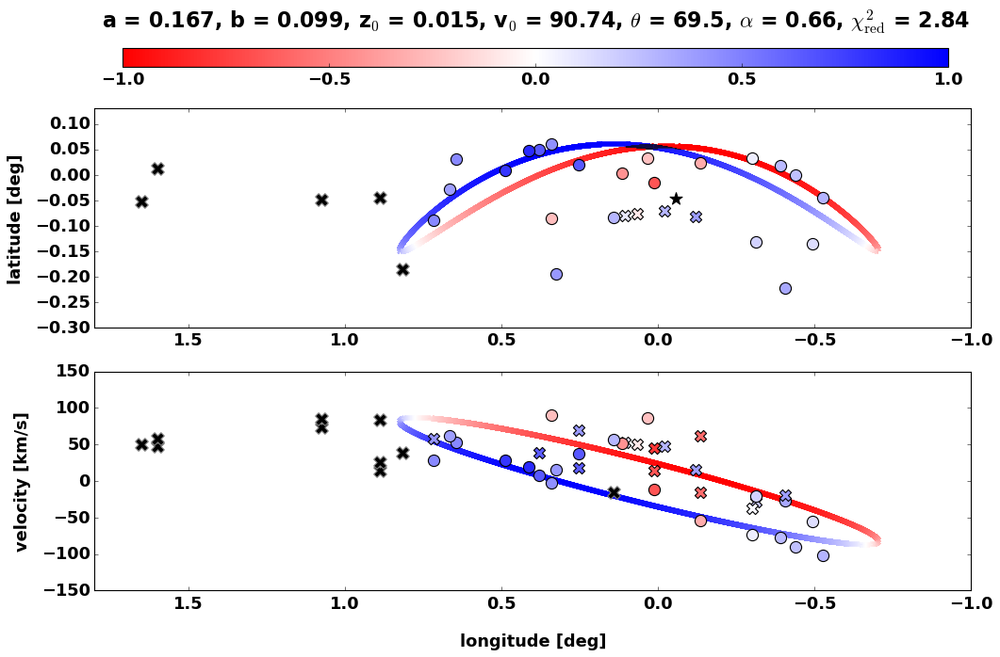

175 175
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 623
    # data points      = 22
    # variables        = 6
    chi-square         = 41.5625259
    reduced chi-square = 2.59765787
    Akaike info crit   = 25.9954428
    Bayesian info crit = 32.5416975
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.20235320 (init = 0.175)
    b_rings:      0.07656753 (init = 0.10675)
    z_rings:      0.01592341 (init = 0.0125)
    v_rings:      76.5068256 (init = 130)
    theta_rings:  77.2920578 (init = 25)
    alpha_rings:  0.84242053 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.00028941] [0.02043883]
[0.32693525] [-0.20434974] [1.] [-1.]
NICE FIT!


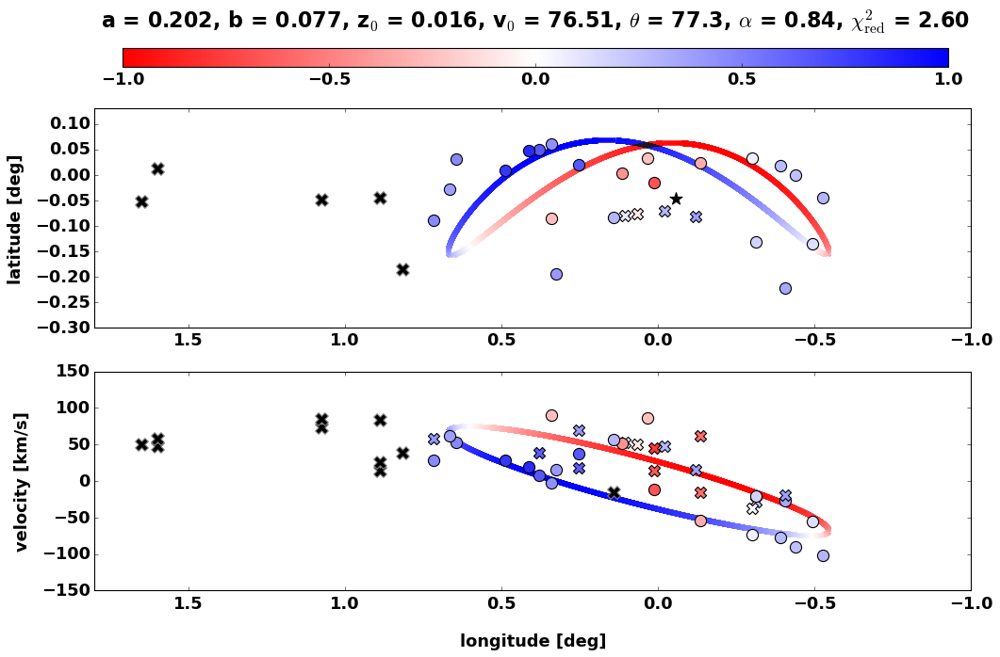

180 180
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 1252
    # data points      = 22
    # variables        = 6
    chi-square         = 38.8318877
    reduced chi-square = 2.42699298
    Akaike info crit   = 24.5003847
    Bayesian info crit = 31.0466394
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.17979819 (init = 0.18)
    b_rings:      0.07437319 (init = 0.1098)
    z_rings:      0.01490655 (init = 0.0125)
    v_rings:      75.0379716 (init = 130)
    theta_rings:  75.4505452 (init = 25)
    alpha_rings:  0.74674345 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.00110671] [0.0203945]
[0.32056068] [-0.19980986] [1.] [-1.]
NICE FIT!


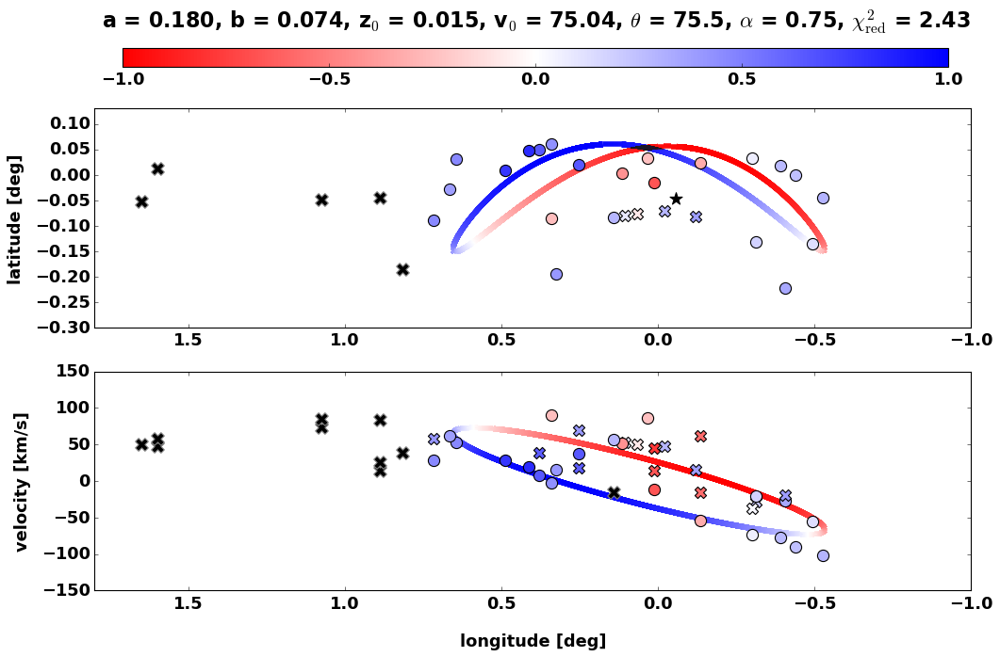

185 185
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 1019
    # data points      = 22
    # variables        = 6
    chi-square         = 39.1353120
    reduced chi-square = 2.44595700
    Akaike info crit   = 24.6716200
    Bayesian info crit = 31.2178747
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.26477081 (init = 0.185)
    b_rings:      0.07606250 (init = 0.11285)
    z_rings:      0.01447009 (init = 0.0125)
    v_rings:      76.7458786 (init = 130)
    theta_rings:  81.3829048 (init = 25)
    alpha_rings:  0.88358997 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.00331915] [0.01624217]
[0.31756428] [-0.19101573] [1.] [-1.]
NICE FIT!


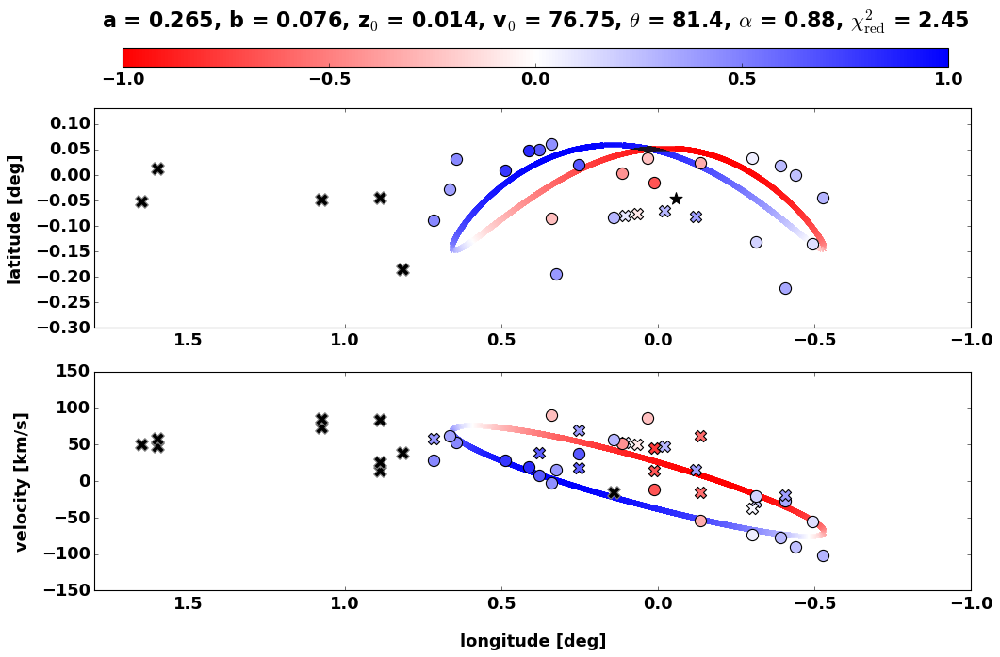

190 190
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 565
    # data points      = 22
    # variables        = 6
    chi-square         = 38.6077350
    reduced chi-square = 2.41298343
    Akaike info crit   = 24.3730242
    Bayesian info crit = 30.9192789
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.08829491 (init = 0.19)
    b_rings:      0.04464609 (init = 0.1159)
    z_rings:      0.01643656 (init = 0.0125)
    v_rings:      109.667230 (init = 130)
    theta_rings:  25.2720657 (init = 25)
    alpha_rings: -0.80035876 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.03057176] [0.05127179]
[0.33819727] [-0.22855869] [1.] [-1.]
NICE FIT!


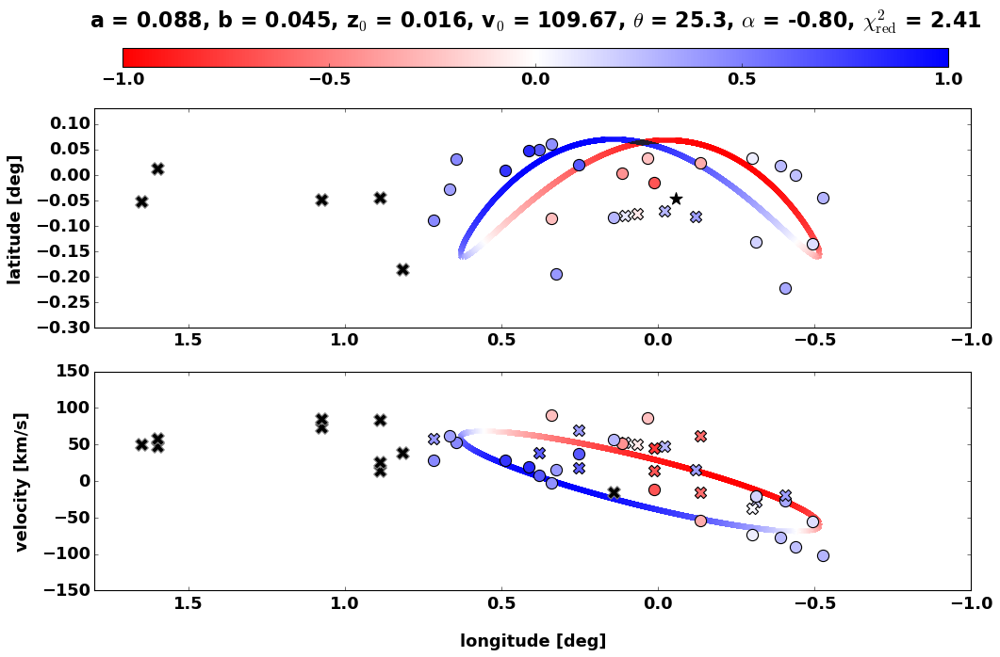

195 195
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 960
    # data points      = 22
    # variables        = 6
    chi-square         = 40.1036412
    reduced chi-square = 2.50647758
    Akaike info crit   = 25.2093430
    Bayesian info crit = 31.7555977
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.09123821 (init = 0.195)
    b_rings:      0.04378201 (init = 0.11895)
    z_rings:      0.01318394 (init = 0.0125)
    v_rings:      110.292890 (init = 130)
    theta_rings:  22.2617659 (init = 25)
    alpha_rings: -0.71589421 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.01211559] [0.0341653]
[0.34882512] [-0.24061342] [1.] [-1.]
NICE FIT!


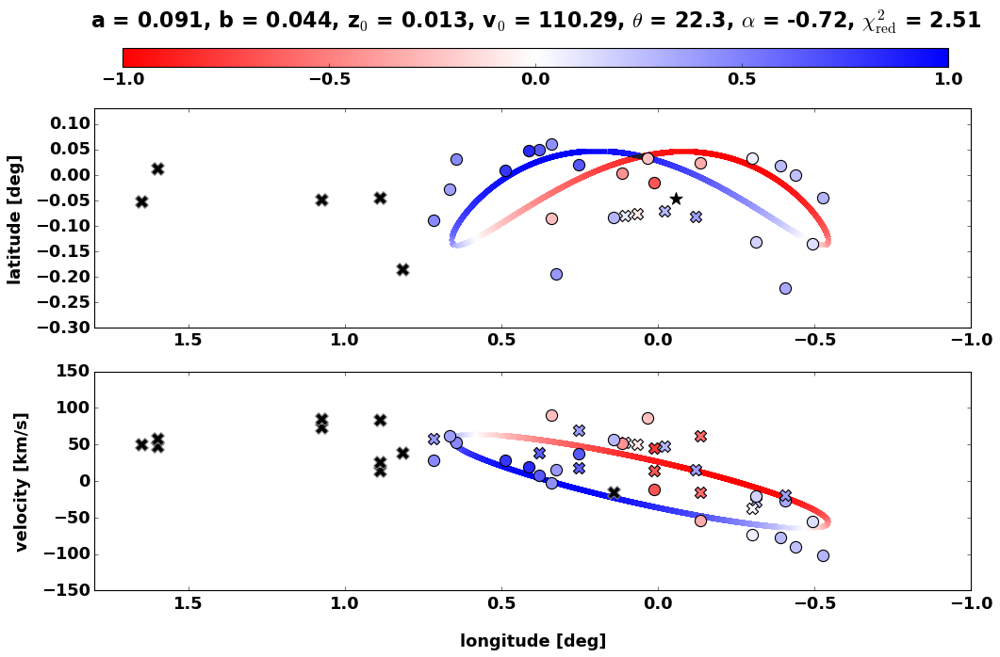

200 200
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 1170
    # data points      = 22
    # variables        = 6
    chi-square         = 38.6115610
    reduced chi-square = 2.41322256
    Akaike info crit   = 24.3752043
    Bayesian info crit = 30.9214590
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.08394070 (init = 0.2)
    b_rings:      0.03677095 (init = 0.122)
    z_rings:      0.01579783 (init = 0.0125)
    v_rings:      125.095458 (init = 130)
    theta_rings:  19.5801347 (init = 25)
    alpha_rings: -0.97415003 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.03438069] [0.05564777]
[0.33545869] [-0.22750022] [1.] [-1.]
NICE FIT!


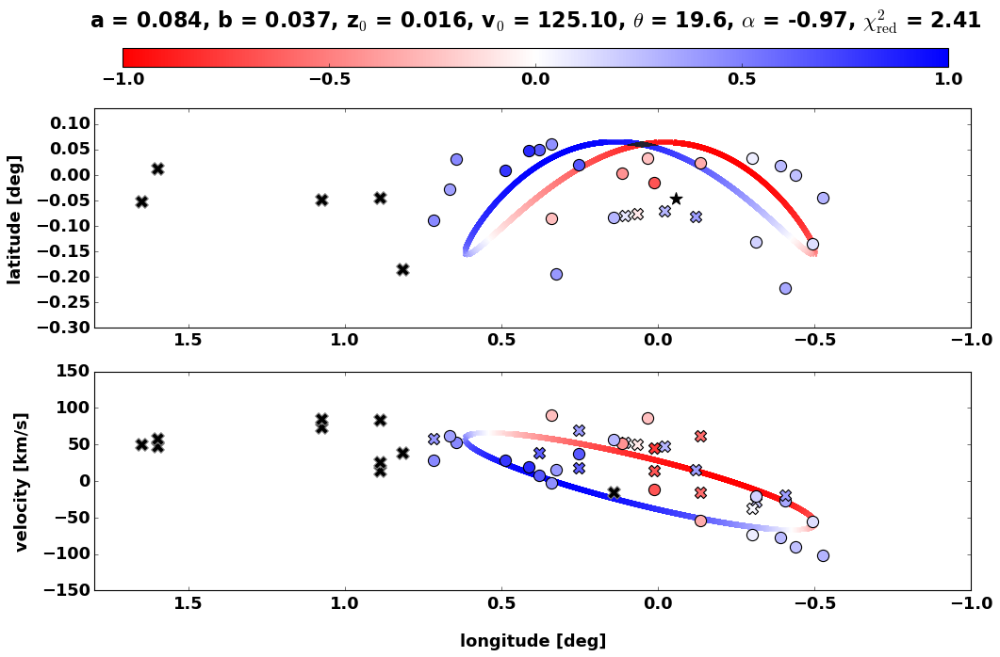

205 205
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 714
    # data points      = 22
    # variables        = 6
    chi-square         = 38.6265105
    reduced chi-square = 2.41415691
    Akaike info crit   = 24.3837205
    Bayesian info crit = 30.9299753
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.08569854 (init = 0.205)
    b_rings:      0.04159922 (init = 0.12505)
    z_rings:      0.01579653 (init = 0.0125)
    v_rings:      111.207318 (init = 130)
    theta_rings:  23.5986350 (init = 25)
    alpha_rings: -0.83866665 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.02879629] [0.04977111]
[0.33518725] [-0.22595235] [1.] [-1.]
NICE FIT!


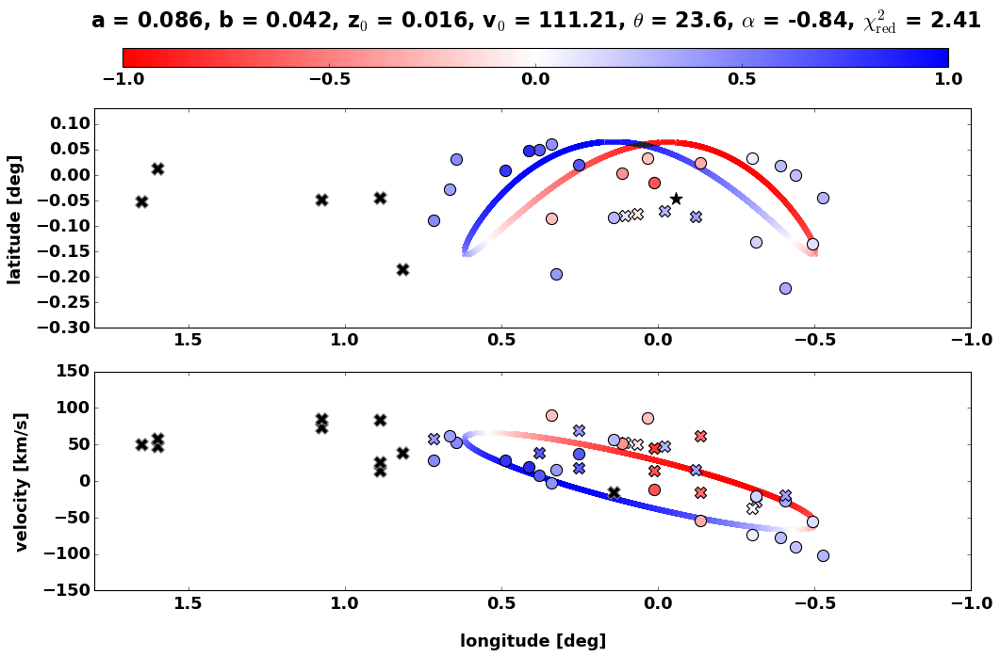

210 210
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 574
    # data points      = 22
    # variables        = 6
    chi-square         = 38.6606774
    reduced chi-square = 2.41629233
    Akaike info crit   = 24.4031719
    Bayesian info crit = 30.9494266
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.09420378 (init = 0.21)
    b_rings:      0.05444561 (init = 0.1281)
    z_rings:      0.01603138 (init = 0.0125)
    v_rings:      92.2762600 (init = 130)
    theta_rings:  35.9096559 (init = 25)
    alpha_rings: -0.46626753 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.02023736] [0.04090797]
[0.33338412] [-0.22159187] [1.] [-1.]
NICE FIT!


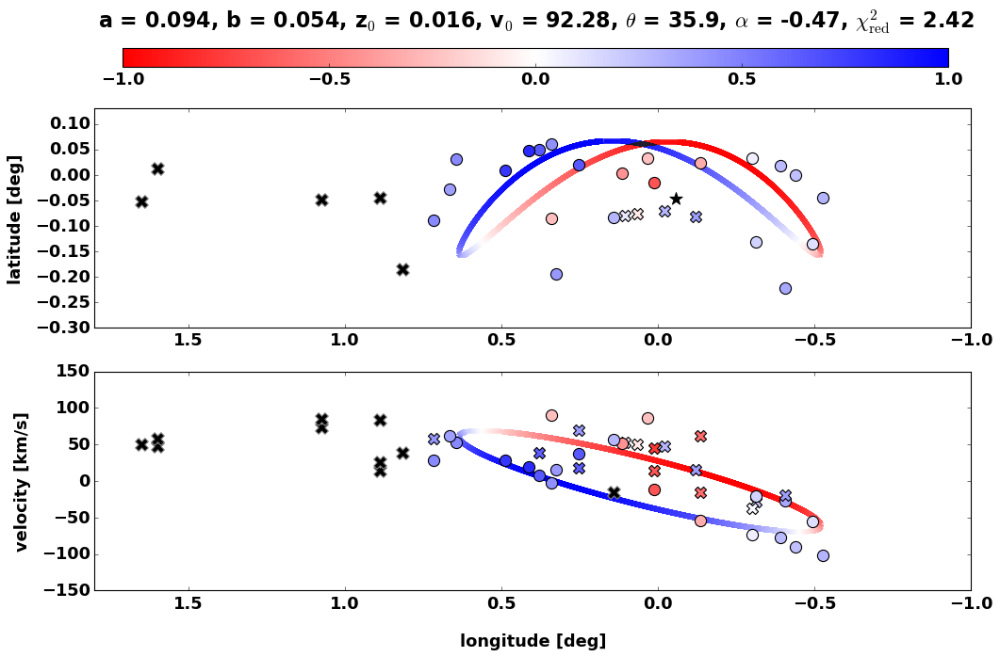

215 215
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 753
    # data points      = 22
    # variables        = 6
    chi-square         = 39.3074125
    reduced chi-square = 2.45671328
    Akaike info crit   = 24.7681545
    Bayesian info crit = 31.3144092
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.10323568 (init = 0.215)
    b_rings:      0.05860509 (init = 0.13115)
    z_rings:      0.01509530 (init = 0.0125)
    v_rings:      85.4658864 (init = 130)
    theta_rings:  39.9541386 (init = 25)
    alpha_rings: -0.22796729 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.00952018] [0.03362465]
[0.36652373] [-0.25391337] [1.] [-1.]
NICE FIT!


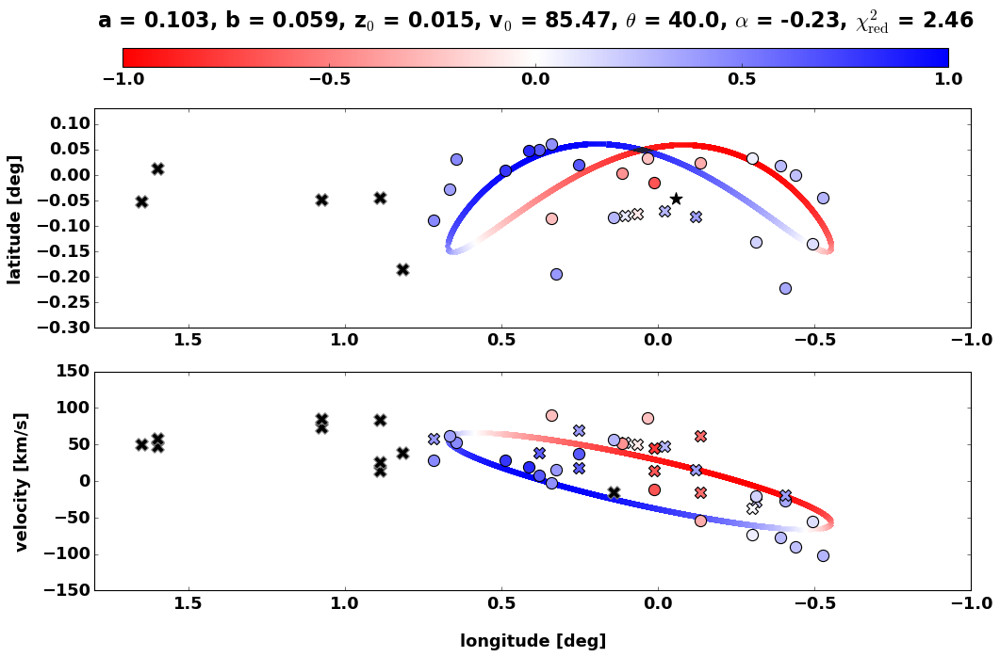

220 220
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 689
    # data points      = 22
    # variables        = 6
    chi-square         = 41.5406971
    reduced chi-square = 2.59629357
    Akaike info crit   = 25.9838852
    Bayesian info crit = 32.5301400
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.26775758 (init = 0.22)
    b_rings:      0.07692976 (init = 0.1342)
    z_rings:      0.01561068 (init = 0.0125)
    v_rings:      75.5594018 (init = 130)
    theta_rings:  81.2037241 (init = 25)
    alpha_rings:  0.92965662 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.00315527] [0.01706841]
[0.32605176] [-0.19885317] [1.] [-1.]
NICE FIT!


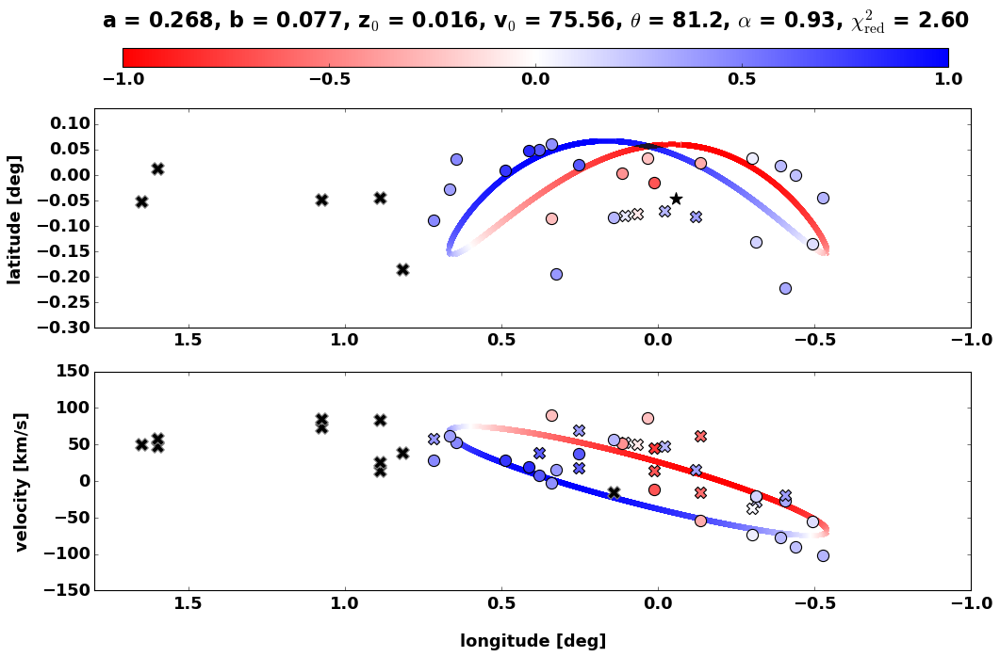

225 225
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 773
    # data points      = 22
    # variables        = 6
    chi-square         = 43.1564409
    reduced chi-square = 2.69727755
    Akaike info crit   = 26.8233628
    Bayesian info crit = 33.3696176
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.28355604 (init = 0.225)
    b_rings:      0.08815484 (init = 0.13725)
    z_rings:      0.01480572 (init = 0.0125)
    v_rings:      86.0463442 (init = 130)
    theta_rings:  82.1048671 (init = 25)
    alpha_rings:  1.10033785 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.00323975] [0.01534376]
[0.30928442] [-0.18242097] [1.] [-1.]
NICE FIT!


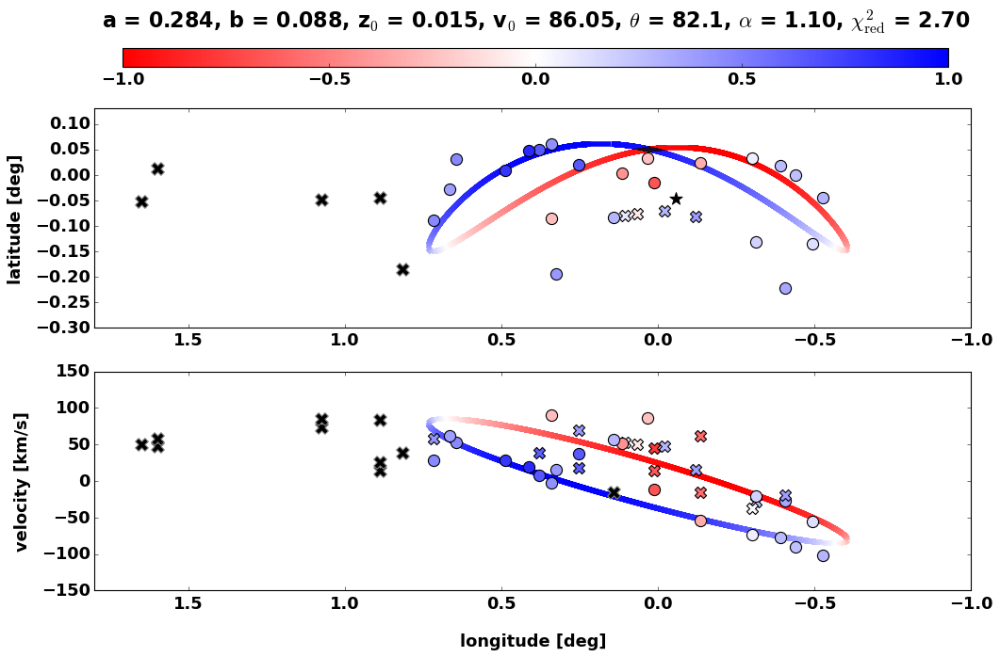

230 230
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 989
    # data points      = 22
    # variables        = 6
    chi-square         = 41.8133063
    reduced chi-square = 2.61333164
    Akaike info crit   = 26.1277877
    Bayesian info crit = 32.6740424
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.22086136 (init = 0.23)
    b_rings:      0.08062073 (init = 0.1403)
    z_rings:      0.01574363 (init = 0.0125)
    v_rings:      81.0534929 (init = 130)
    theta_rings:  78.8083061 (init = 25)
    alpha_rings:  0.91251862 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.00020904] [0.01955353]
[0.32083506] [-0.19731824] [1.] [-1.]
NICE FIT!


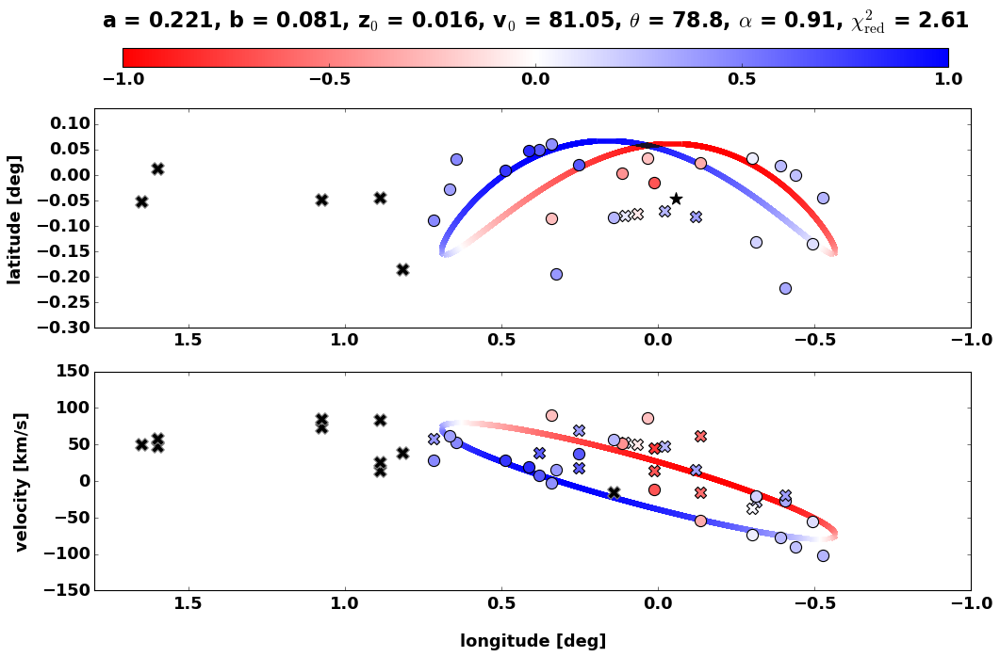

235 235
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 979
    # data points      = 22
    # variables        = 6
    chi-square         = 41.7749146
    reduced chi-square = 2.61093216
    Akaike info crit   = 26.1075787
    Bayesian info crit = 32.6538334
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.16808160 (init = 0.235)
    b_rings:      0.07849684 (init = 0.14335)
    z_rings:      0.01642194 (init = 0.0125)
    v_rings:      81.9278797 (init = 130)
    theta_rings:  73.1811144 (init = 25)
    alpha_rings:  0.76285295 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.00412895] [0.02323864]
[0.32296607] [-0.20334342] [1.] [-1.]
NICE FIT!


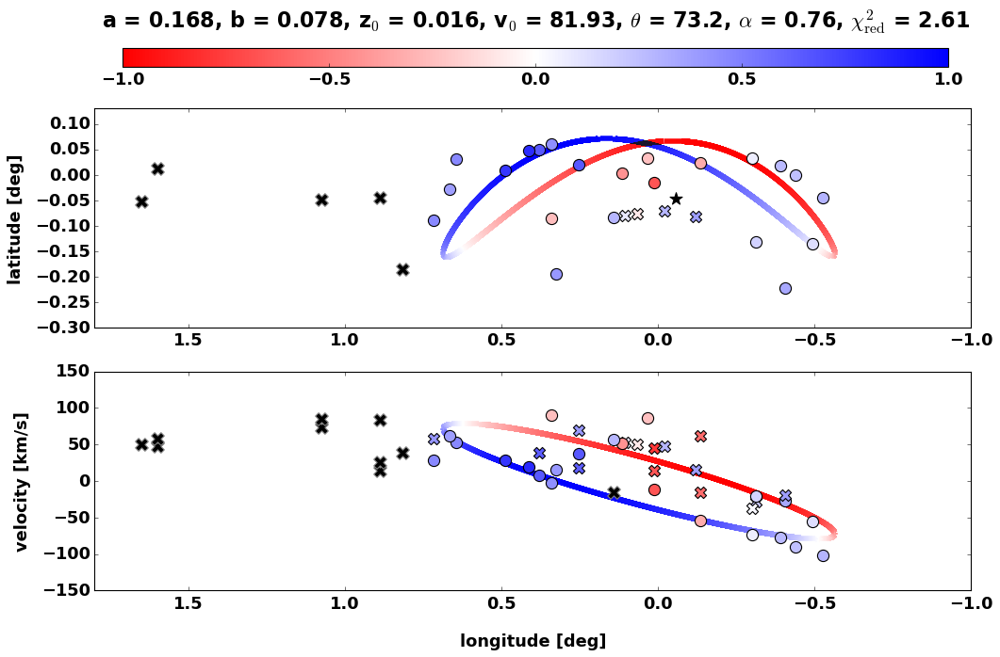

240 240
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 851
    # data points      = 22
    # variables        = 6
    chi-square         = 38.6200583
    reduced chi-square = 2.41375364
    Akaike info crit   = 24.3800453
    Bayesian info crit = 30.9263000
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.08508825 (init = 0.24)
    b_rings:      0.04039664 (init = 0.1464)
    z_rings:      0.01582894 (init = 0.0125)
    v_rings:      113.630524 (init = 130)
    theta_rings:  22.6784163 (init = 25)
    alpha_rings: -0.86692781 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.03034814] [0.05160572]
[0.33522792] [-0.22623858] [1.] [-1.]
NICE FIT!


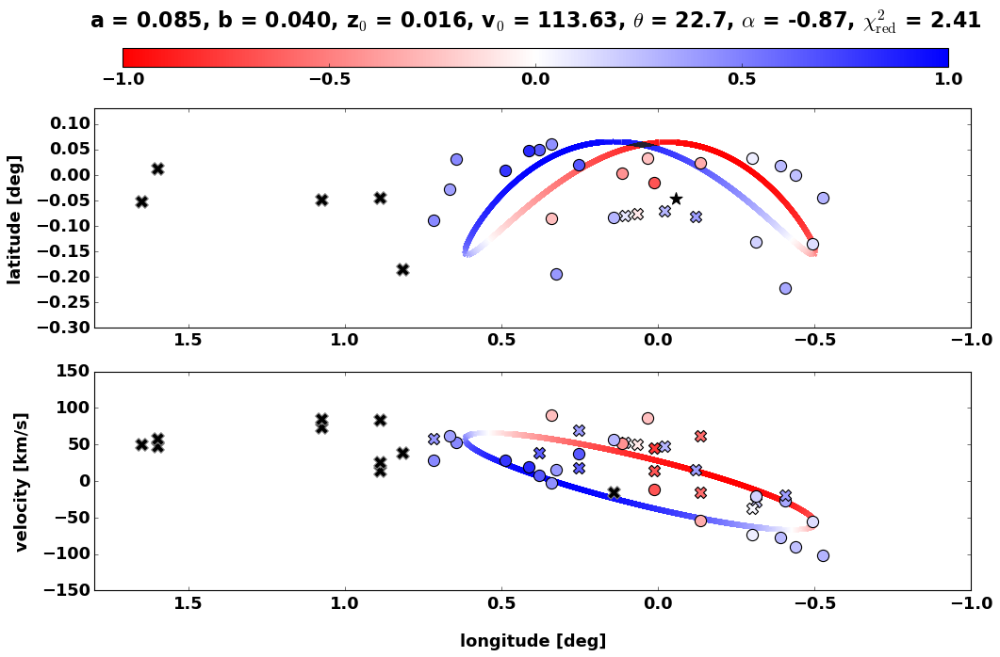

245 245
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 799
    # data points      = 22
    # variables        = 6
    chi-square         = 43.9887786
    reduced chi-square = 2.74929866
    Akaike info crit   = 27.2436266
    Bayesian info crit = 33.7898813
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.10416883 (init = 0.245)
    b_rings:      0.05946020 (init = 0.14945)
    z_rings:      0.01494597 (init = 0.0125)
    v_rings:      138.151675 (init = 130)
    theta_rings:  20.0700770 (init = 25)
    alpha_rings: -1.08791846 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.02544106] [0.04377436]
[0.30255474] [-0.19439717] [1.] [-1.]
NICE FIT!


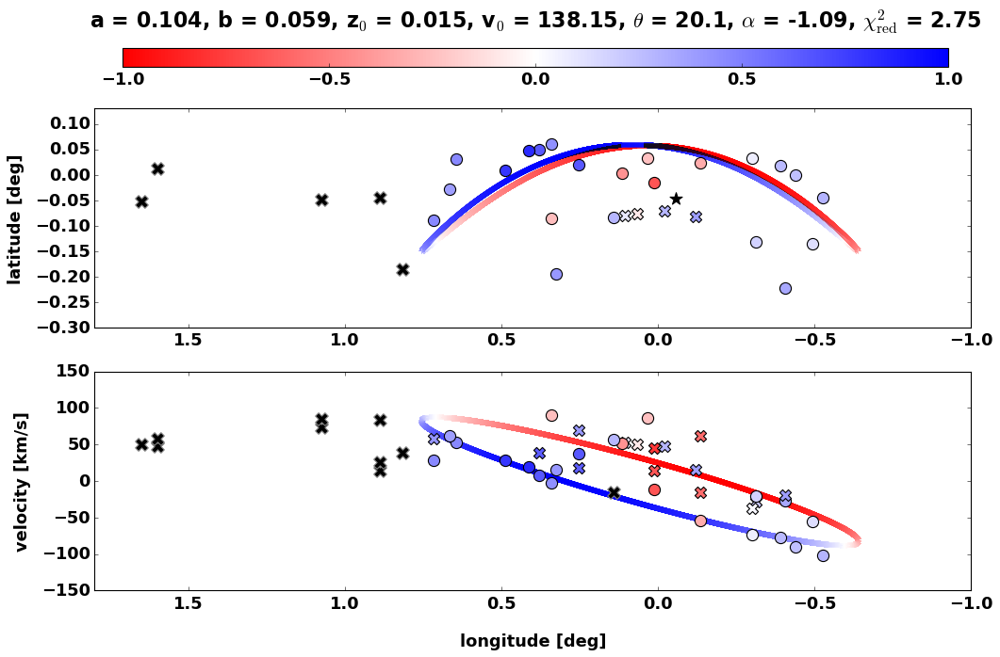

250 250
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 881
    # data points      = 22
    # variables        = 6
    chi-square         = 42.3531764
    reduced chi-square = 2.64707352
    Akaike info crit   = 26.4100213
    Bayesian info crit = 32.9562760
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.23185878 (init = 0.25)
    b_rings:      0.08424832 (init = 0.1525)
    z_rings:      0.01572146 (init = 0.0125)
    v_rings:      85.6182712 (init = 130)
    theta_rings:  79.6189854 (init = 25)
    alpha_rings:  0.95934914 (init = 0.4)
    ddphi:        0.001 (fixed)
[-7.88028729e-05] [0.01901645]
[0.3149018] [-0.19103374] [1.] [-1.]
NICE FIT!


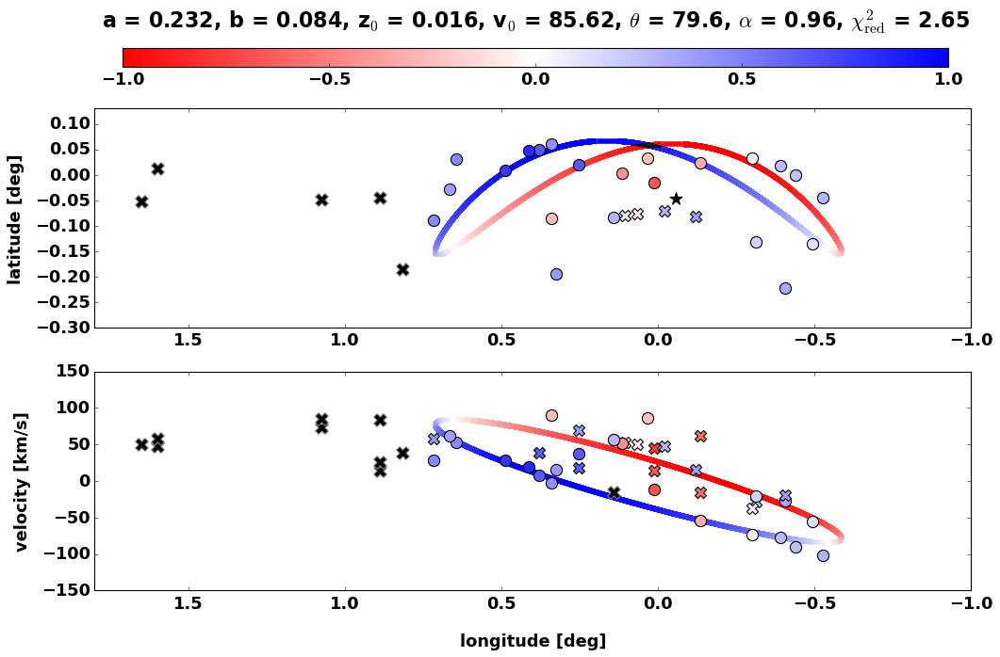

255 255
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 1384
    # data points      = 22
    # variables        = 6
    chi-square         = 39.7559982
    reduced chi-square = 2.48474989
    Akaike info crit   = 25.0178021
    Bayesian info crit = 31.5640568
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.09839048 (init = 0.255)
    b_rings:      0.05330568 (init = 0.15555)
    z_rings:      0.01370945 (init = 0.0125)
    v_rings:      99.6106292 (init = 130)
    theta_rings:  29.8240743 (init = 25)
    alpha_rings: -0.55216400 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.01049064] [0.03309641]
[0.36135014] [-0.2511052] [1.] [-1.]
NICE FIT!


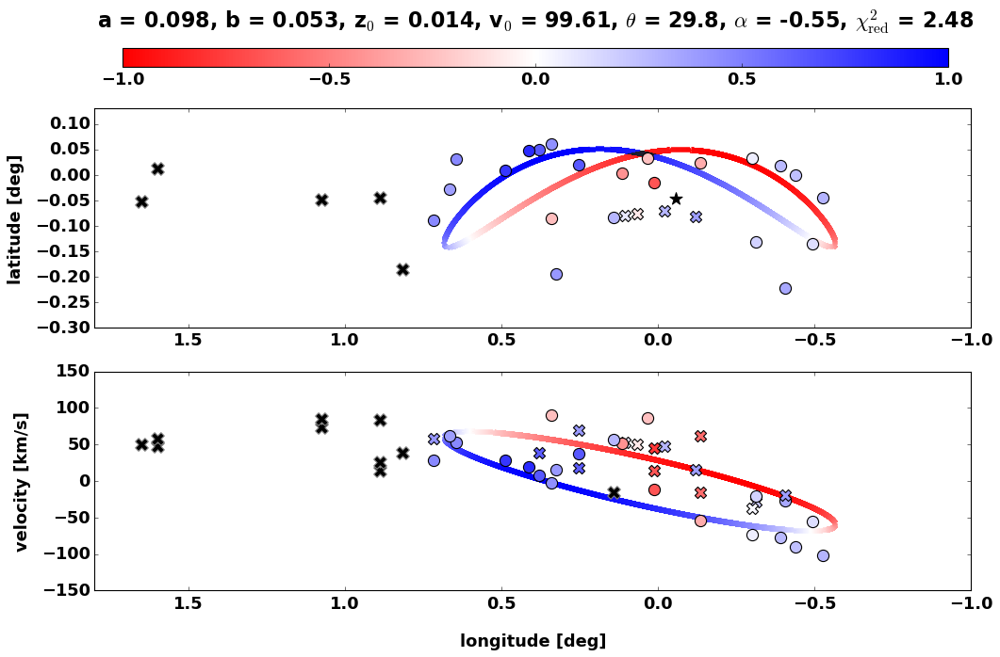

260 260
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 746
    # data points      = 22
    # variables        = 6
    chi-square         = 52.9367630
    reduced chi-square = 3.30854769
    Akaike info crit   = 31.3172231
    Bayesian info crit = 37.8634779
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.28613748 (init = 0.26)
    b_rings:      0.11571375 (init = 0.1586)
    z_rings:      0.01401696 (init = 0.0125)
    v_rings:      116.134000 (init = 130)
    theta_rings:  82.0347250 (init = 25)
    alpha_rings:  1.24127108 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.00496741] [0.01320095]
[0.29405448] [-0.16907039] [1.] [-1.]
NICE FIT!


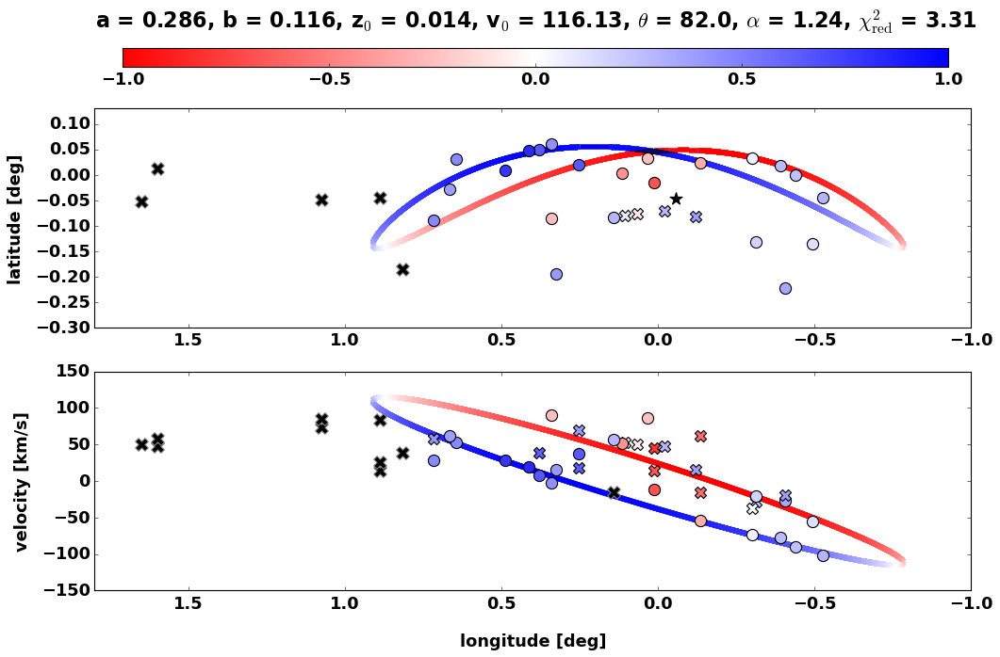

265 265
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 574
    # data points      = 22
    # variables        = 6
    chi-square         = 38.7696237
    reduced chi-square = 2.42310148
    Akaike info crit   = 24.4650811
    Bayesian info crit = 31.0113358
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.10798088 (init = 0.265)
    b_rings:      0.06402923 (init = 0.16165)
    z_rings:      0.01483307 (init = 0.0125)
    v_rings:      77.9978309 (init = 130)
    theta_rings:  51.7505603 (init = 25)
    alpha_rings:  0.06882776 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.00845714] [0.02918788]
[0.33149006] [-0.21723812] [1.] [-1.]
NICE FIT!


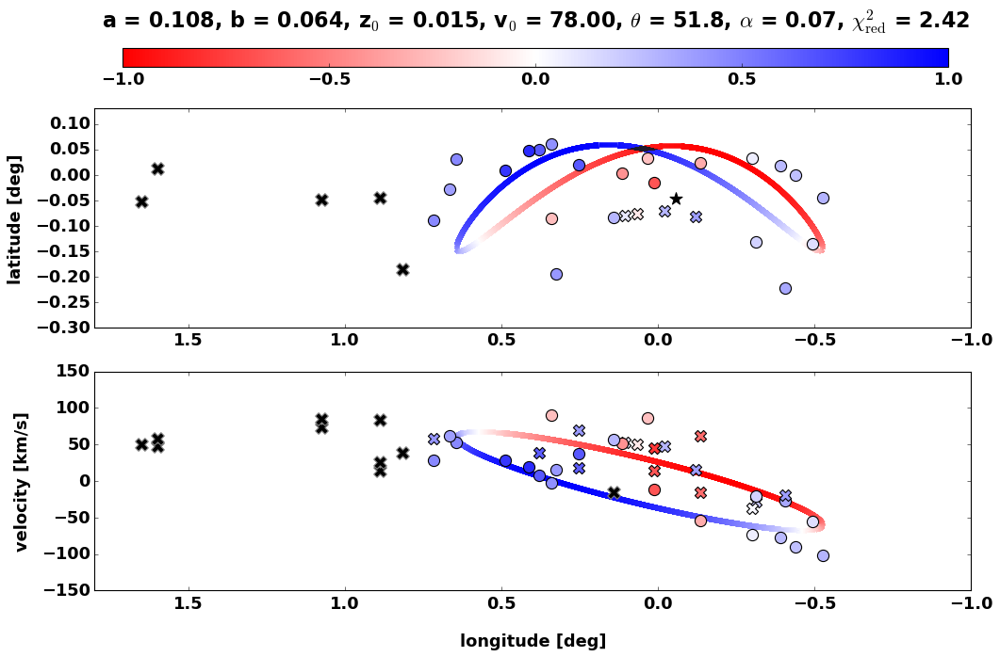

270 270
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 791
    # data points      = 22
    # variables        = 6
    chi-square         = 45.0319617
    reduced chi-square = 2.81449761
    Akaike info crit   = 27.7592610
    Bayesian info crit = 34.3055157
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.29089834 (init = 0.27)
    b_rings:      0.09444908 (init = 0.1647)
    z_rings:      0.01460760 (init = 0.0125)
    v_rings:      94.5031404 (init = 130)
    theta_rings:  82.3818801 (init = 25)
    alpha_rings:  1.11204726 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.00440898] [0.01371655]
[0.30446117] [-0.17766891] [1.] [-1.]
NICE FIT!


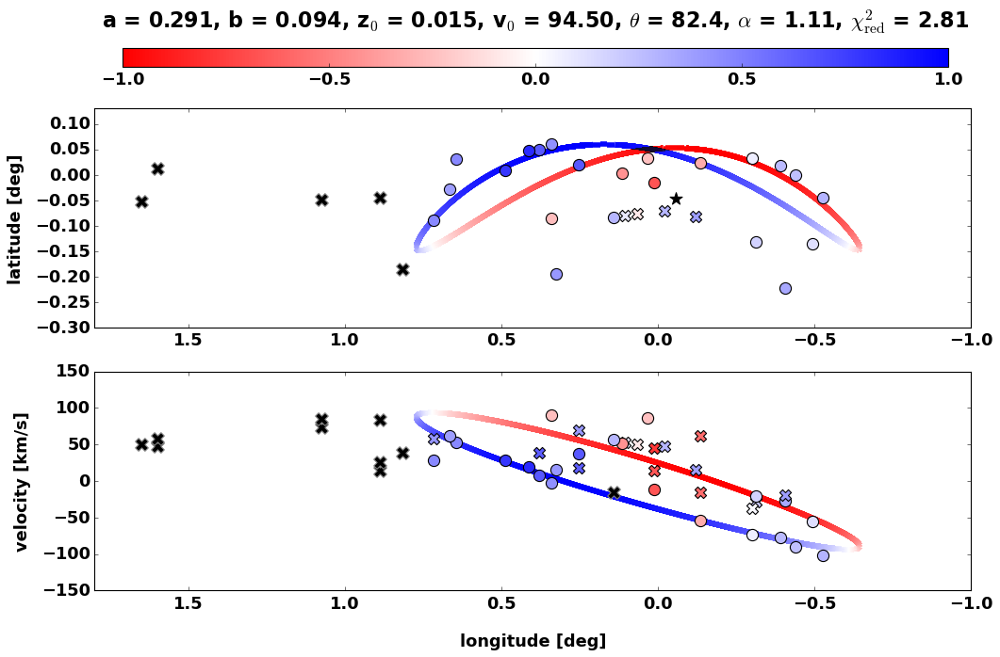

275 275
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 805
    # data points      = 22
    # variables        = 6
    chi-square         = 45.7090447
    reduced chi-square = 2.85681530
    Akaike info crit   = 28.0875823
    Bayesian info crit = 34.6338370
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.24563135 (init = 0.275)
    b_rings:      0.09626869 (init = 0.16775)
    z_rings:      0.01468593 (init = 0.0125)
    v_rings:      96.4821898 (init = 130)
    theta_rings:  80.4467288 (init = 25)
    alpha_rings:  1.09058718 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.00224512] [0.01542337]
[0.302546] [-0.17889148] [1.] [-1.]
NICE FIT!


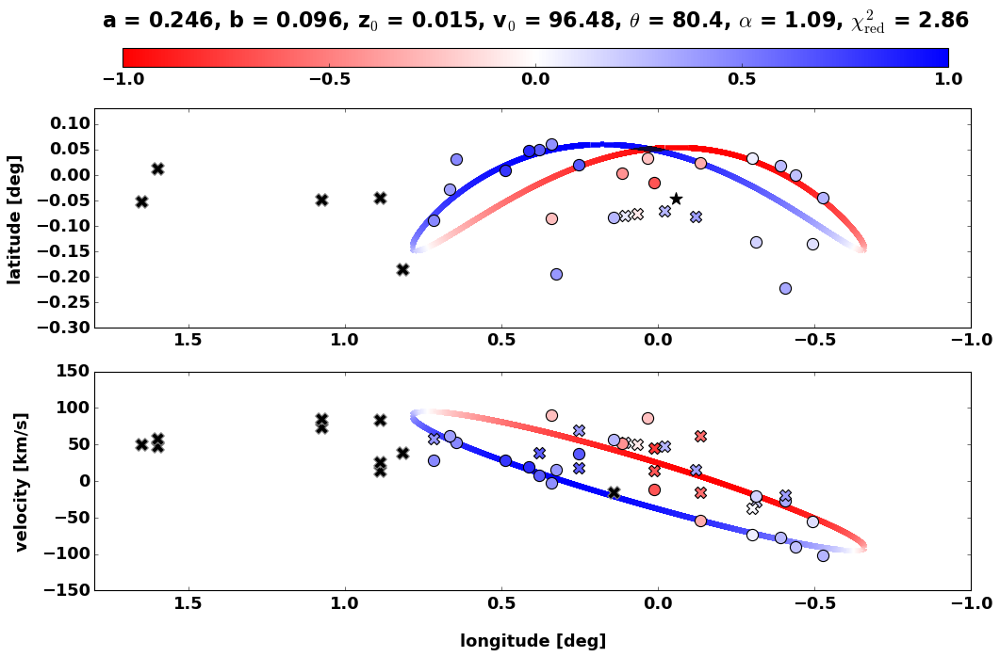

280 280
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 871
    # data points      = 22
    # variables        = 6
    chi-square         = 45.0046686
    reduced chi-square = 2.81279179
    Akaike info crit   = 27.7459231
    Bayesian info crit = 34.2921778
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.18056044 (init = 0.28)
    b_rings:      0.07569732 (init = 0.1708)
    z_rings:      0.01719936 (init = 0.0125)
    v_rings:      83.7364878 (init = 130)
    theta_rings:  76.1721958 (init = 25)
    alpha_rings:  1.06601658 (init = 0.4)
    ddphi:        0.001 (fixed)
[3.0567924e-05] [0.01904434]
[0.3074486] [-0.18714661] [1.] [-1.]
NICE FIT!


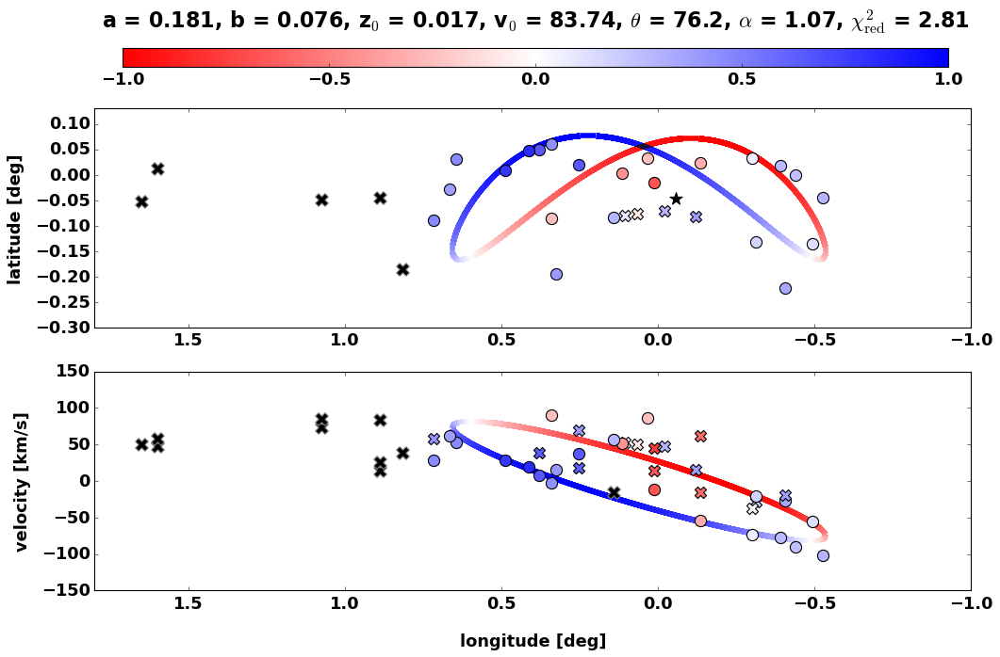

285 285
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 857
    # data points      = 22
    # variables        = 6
    chi-square         = 38.9015568
    reduced chi-square = 2.43134730
    Akaike info crit   = 24.5398200
    Bayesian info crit = 31.0860747
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.18445300 (init = 0.285)
    b_rings:      0.07575338 (init = 0.17385)
    z_rings:      0.01473519 (init = 0.0125)
    v_rings:      76.4249816 (init = 130)
    theta_rings:  75.5570206 (init = 25)
    alpha_rings:  0.74807375 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.00012868] [0.01959652]
[0.32644068] [-0.20523423] [1.] [-1.]
NICE FIT!


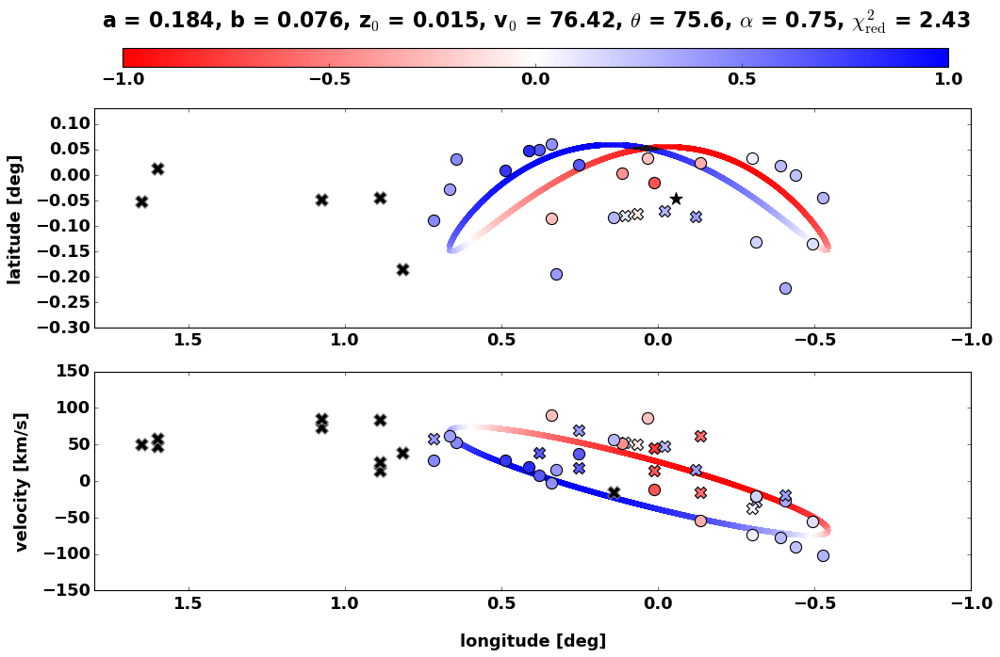

290 290
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 861
    # data points      = 22
    # variables        = 6
    chi-square         = 38.9748245
    reduced chi-square = 2.43592653
    Akaike info crit   = 24.5812161
    Bayesian info crit = 31.1274708
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.22692281 (init = 0.29)
    b_rings:      0.07641607 (init = 0.1769)
    z_rings:      0.01459833 (init = 0.0125)
    v_rings:      75.8758506 (init = 130)
    theta_rings:  79.4596743 (init = 25)
    alpha_rings:  0.84244792 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.0020223] [0.01752259]
[0.31881297] [-0.19478302] [1.] [-1.]
NICE FIT!


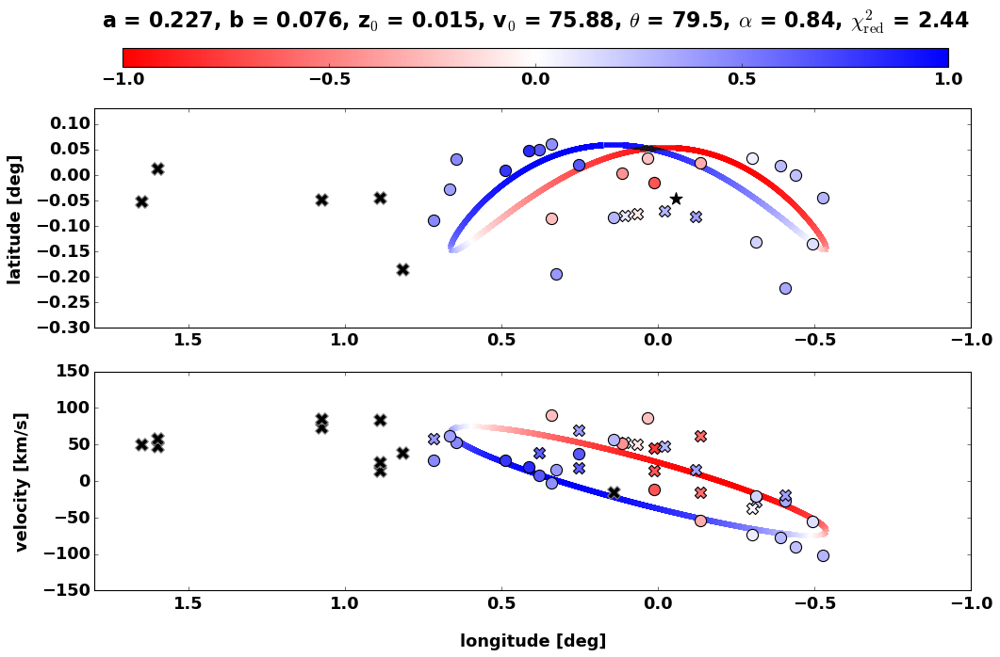

295 295
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 741
    # data points      = 22
    # variables        = 6
    chi-square         = 40.2515623
    reduced chi-square = 2.51572264
    Akaike info crit   = 25.2903400
    Bayesian info crit = 31.8365947
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.09025403 (init = 0.295)
    b_rings:      0.04149551 (init = 0.17995)
    z_rings:      0.01303882 (init = 0.0125)
    v_rings:      116.727549 (init = 130)
    theta_rings:  20.1777074 (init = 25)
    alpha_rings: -0.76852229 (init = 0.4)
    ddphi:        0.001 (fixed)
[0.01253541] [0.03489581]
[0.34518654] [-0.23769959] [1.] [-1.]
NICE FIT!


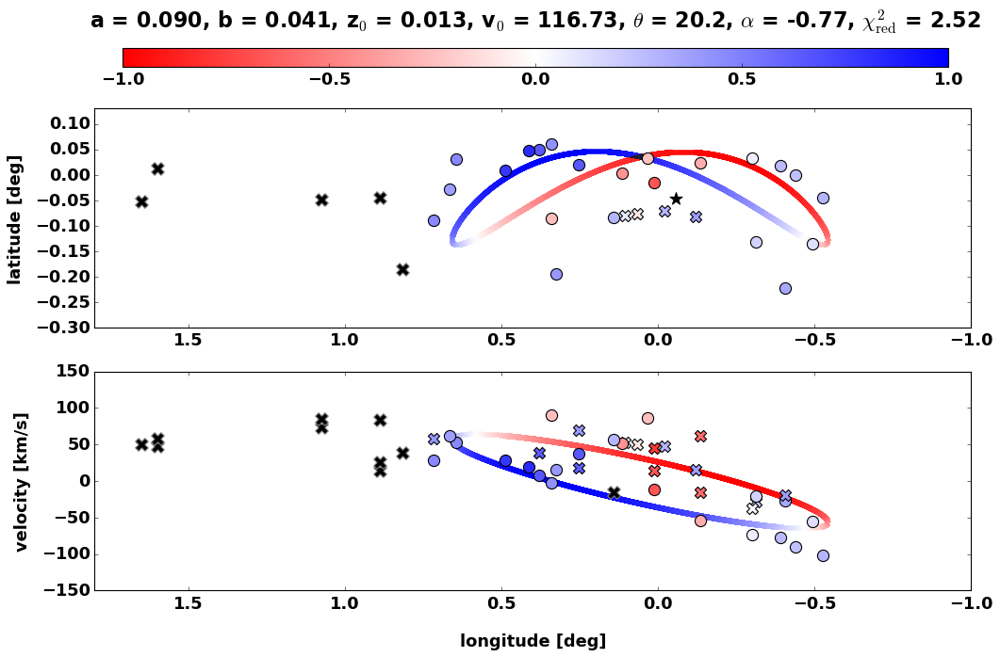

300 300
[[Fit Statistics]]
    # fitting method   = Nelder-Mead
    # function evals   = 486
    # data points      = 22
    # variables        = 6
    chi-square         = 40.2673627
    reduced chi-square = 2.51671017
    Akaike info crit   = 25.2989742
    Bayesian info crit = 31.8452290
##  Warning: uncertainties could not be estimated:
    this fitting method does not natively calculate uncertainties
    and numdifftools is not installed for lmfit to do this. Use
    `pip install numdifftools` for lmfit to estimate uncertainties
    with this fitting method.
[[Variables]]
    a_rings:      0.02048254 (init = 0.3)
    b_rings:      0.01000112 (init = 0.183)
    z_rings:      0.01080309 (init = 0.0125)
    v_rings:      120.830757 (init = 130)
    theta_rings:  13.6773970 (init = 25)
    alpha_rings:  0.54048750 (init = 0.4)
    ddphi:        0.001 (fixed)
[-0.05922222] [-0.05681694]
[0.10279675] [0.00831174] [1.] [-1.]
NICE FIT!


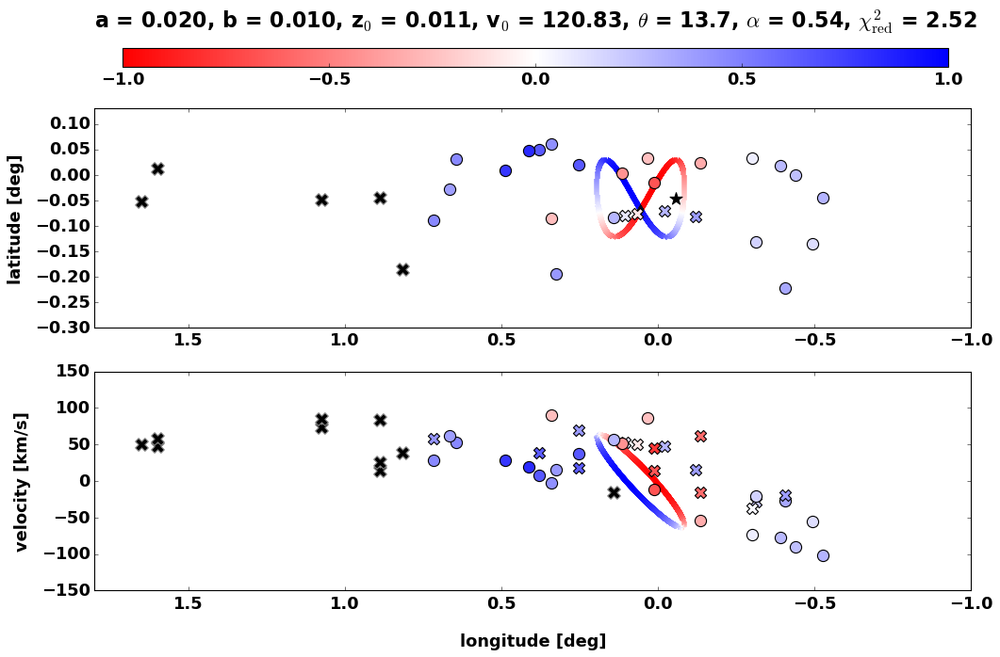

In [228]:
agrid = np.arange(10, 305, 5)
bgrid = np.arange(10, 305, 5)

grid_tab = Table()
r0, a_out, b_out, z_out, v_out, theta_out, alpha_out, redchisq = [], [], [], [], [], [],[], []

for i in range(len(agrid)):
    print(agrid[i],bgrid[i])

    params_GRID = create_params(a_rings={'value': agrid[i]/1e3   , 'min': 0.01, 'max': 0.3, 'vary': True},
                               b_rings={'value': (0.61*agrid[i])/1e3  , 'min': 0.01, 'max': 0.2, 'vary': True},
                               z_rings={'value': 0.0125 , 'min': 0.00, 'max': 0.05, 'vary': True},
                               v_rings={'value': 130.0  , 'min': 75.0, 'max': 175.0, 'vary': True},
                               theta_rings={'value': 25  , 'min': -180, 'max': 180, 'vary': True},
                               #alpha_rings={'value': 0.3904+((((agrid[i]/1e3)-0.010)/0.005)*0.0006)  , 'min': -np.pi/2, 'max': np.pi/2, 'vary': True},
                               alpha_rings={'value': 0.4  , 'min': -np.pi/2, 'max': np.pi/2, 'vary': True},
                               ddphi={'value': 0.001  , 'min': 0.00005, 'max': 0.01, 'vary': False}
                                  )
    
    out = minimize(ring_resid, params_GRID, method='nelder', args=(Ndata.l0,Ndata.b0,Ndata.v0))
    print(fit_report(out))
        
    #if (np.mean(Rings_out.vr[ring_NF_dist(Rings_out)[1]])<np.mean(Rings_out.vr[ring_NF_dist(Rings_out)[0]])):
    
    dphi = np.radians(0.001)
    phi  = arange(phisun+dphi/2,phisun+2*pi,dphi)

    Rings_out = Ring(phi,
                      out.params['a_rings'].value,
                      out.params['b_rings'].value,
                      out.params['z_rings'].value,
                      out.params['v_rings'].value, 
                      np.radians(out.params['theta_rings'].value),
                      xyzsun,vxyzsun,
                      out.params['alpha_rings'].value)


#    N_cent_vr = Rings_out.vr[argmedian(np.degrees(Rings_out.l[ring_NF_dist(Rings_out)[1][0]]))]
#    F_cent_vr = Rings_out.vr[argmedian(np.degrees(Rings_out.l[ring_NF_dist(Rings_out)[0][0]]))]
    NN = np.where(ring_NF_dist(Rings_out)[2]==1)
    FF = np.where(ring_NF_dist(Rings_out)[2]==-1)

    print(Rings_out.vr[NN], Rings_out.vr[FF])

    print(np.degrees(Rings_out.l[NN]), np.degrees(Rings_out.l[FF]) , ring_NF_dist(Rings_out)[2][NN], ring_NF_dist(Rings_out)[2][FF])

#    N_rings_arr = Rings_out.l[ring_NF_dist(Rings_out)[1][0]]
#    N_cent_vr = Rings_out.vr[argmedian(N_rings_arr[np.where((np.degrees(N_rings_arr)>0) )[0]])]

#    F_rings_arr = Rings_out.l[ring_NF_dist(Rings_out)[0][0]]
#    F_cent_vr = Rings_out.vr[argmedian(F_rings_arr[np.where((np.degrees(F_rings_arr)>0.) )[0]])]
    if (Rings_out.vr[NN]<Rings_out.vr[FF]) and (out.params['a_rings']>=out.params['b_rings']):
        print("NICE FIT!")
        lb_lv_plots_postcolor_grad(Rings_out, out)
        
        r0.append(agrid[i])
        a_out.append(out.params['a_rings'].value)
        b_out.append(out.params['b_rings'].value)
        z_out.append(out.params['z_rings'].value)
        v_out.append(out.params['v_rings'].value)
        theta_out.append(out.params['theta_rings'].value)
        alpha_out.append(out.params['alpha_rings'].value)
        redchisq.append(out.redchi)
    else:
        print("DISREGARDED FIT")
        lb_lv_plots_postcolor_grad(Rings_out, out)

In [ ]:
#N_cent_vr = Rings_out.vr[np.argmin(abs(Rings_out.l[ring_NF_dist(Rings_out)[1][0]]))]
#F_cent_vr = Rings_out.vr[np.argmin(abs(Rings_out.l[ring_NF_dist(Rings_out)[0][0]]))]
NN = np.where(ring_NF_dist(Rings_out)[2]==1)
FF = np.where(ring_NF_dist(Rings_out)[2]==-1)

print(Rings_out.vr[NN], Rings_out.vr[FF])
np.degrees(Rings_out.l[NN]), np.degrees(Rings_out.l[FF]), ring_NF_dist(Rings_out)[2][NN], ring_NF_dist(Rings_out)[2][FF]

[-0.00129442] [-0.02049355]


(array([-0.17797083]), array([0.2909941]), array([1.]), array([-1.]))

# Save Grid to Table! 

In [229]:

paramgrid_tab = QTable([a_out, b_out, z_out, v_out,theta_out,alpha_out,redchisq], names=('a_out','b_out','z0_out','v0_out','theta_out','alpha_out','redchisq'), units=[u.kpc,u.kpc,u.kpc,u.km/u.s,u.deg,u.rad,''])

paramgrid_tab.write("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/paramgrid_output.ecsv", overwrite=True)


In [230]:
paramgrid_tab = Table.read("/Users/danilipman/Documents/Research/UConn/CMZ_SYNTH/paramgrid_output.ecsv")
paramgrid_tab

a_out,b_out,z0_out,v0_out,theta_out,alpha_out,redchisq
kpc,kpc,kpc,km / s,deg,rad,
float64,float64,float64,float64,float64,float64,float64
0.04915060887619328,0.012054310662880851,0.010828476065839802,131.66585455965324,15.516713152689107,0.6469409137345878,2.497674881836678
0.05867840259944021,0.014237312800215698,0.010782268381166724,130.51183878001544,13.819355558997898,0.5139449839942714,2.466625971838202
0.02153093514127572,0.010011613895004498,0.01085759238941885,130.13762400191055,11.262166630798305,0.4302080726944144,2.509509801548163
0.05791495845105063,0.013095312417619145,0.010782154682298623,132.17880743566238,11.54494310517174,0.4531380829636902,2.4409798891098005
0.059872721575599946,0.017590899659727023,0.010926772881458564,130.50234805578182,18.56499857118078,0.5500805117363039,2.524964565673327
0.05913597300524024,0.01483142479423412,0.010969228138325175,131.88901832180784,12.648299316611656,0.3985463437343417,2.4052056646018642
0.061737166333047745,0.015013792303015215,0.011384595282862729,129.95133133207236,14.775080150926641,0.5287154798934881,2.501472710054727
0.058481524811974564,0.014839791197699521,0.01014705404536977,132.38826416480484,10.412184291956407,0.2690419642058257,2.387179788741854


In [232]:
a_out, b_out, z_out, v_out, theta_out, alpha_out, redchisq = paramgrid_tab['a_out'],paramgrid_tab['b_out'],paramgrid_tab['z0_out'],paramgrid_tab['v0_out'],paramgrid_tab['theta_out'],paramgrid_tab['alpha_out'],paramgrid_tab['redchisq'],

# Chisq Plots

<>:21: SyntaxWarning: invalid escape sequence '\c'
<>:21: SyntaxWarning: invalid escape sequence '\c'
/var/folders/4b/_cshhy012yj8k_187jxt881r0000gn/T/ipykernel_79340/1940904797.py:21: SyntaxWarning: invalid escape sequence '\c'
  ax[0][0].scatter(redchisq, a_out,label='$\chi_{\mathrm{red}}^{2}$>3',c = 'gray', s=50)


0.06288175901701303 0.08569853840459367 0.16091112507724362
0.020941001666716037 0.03681166101168912 0.06622922724125783
0.011757844797955682 0.013183944625665817 0.014936406972061462
129.19832728152207 116.72754895623245 93.72796558309912
13.998369447578499 20.177707434369523 54.16916310935217
0.18149332093622167 0.20441083468005705 0.18208854967180546


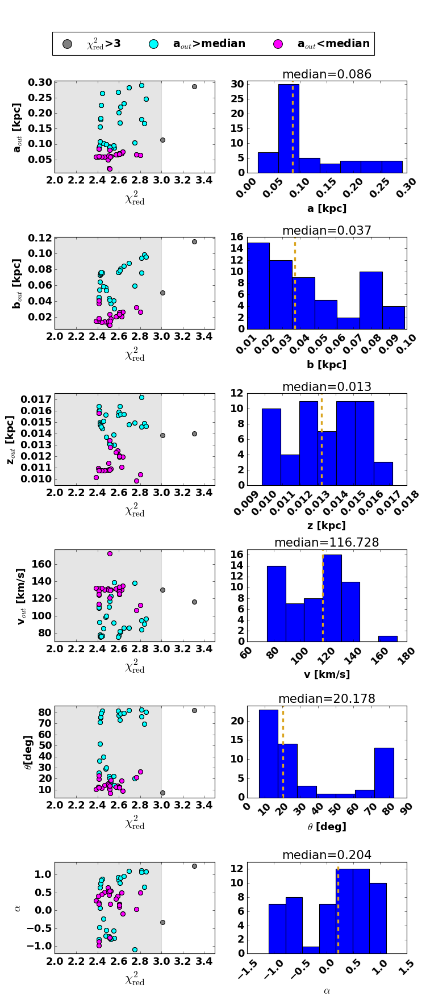

In [271]:
fig, ax = plt.subplots(6, 2,  figsize=(10, 24))
fig.set_facecolor('white')
plt.subplots_adjust(hspace=0.7)

output_params = [a_out, b_out, z_out, v_out, theta_out, alpha_out]
output_param_name = ['a [kpc]', 'b [kpc]', 'z [kpc]', 'v [km/s]', r'$\theta$ [deg]', r'$\alpha$']

# Define redchisq bin masks
redchisq = np.asarray(redchisq)  # ensure it's a NumPy array
bins = [
    #(redchisq <= 12),                          # 10–12
    (redchisq > 1) & (redchisq <= 3),        # 12–14
    
]
bin_labels = [
    #'10 < redchisq < 12',
    '1 < redchisq < 3',
    #'14 < redchisq < 16'
]

ax[0][0].scatter(redchisq, a_out,label='$\chi_{\mathrm{red}}^{2}$>3',c = 'gray', s=50)
ax[1][0].scatter(redchisq, b_out,c = 'gray',s=50)
ax[2][0].scatter(redchisq, z_out,c = 'gray',s=50)
ax[3][0].scatter(redchisq, v_out,c = 'gray',s=50)
ax[4][0].scatter(redchisq, theta_out,c = 'gray',s=50)
ax[5][0].scatter(redchisq, alpha_out,c = 'gray',s=50)


ax[0][0].set_ylabel(r'a$_{out}$ [kpc]')
ax[1][0].set_ylabel(r'b$_{out}$ [kpc]')
ax[2][0].set_ylabel(r'z$_{out}$ [kpc]')
ax[3][0].set_ylabel(r'v$_{out}$ [km/s]')
ax[4][0].set_ylabel(r'$\theta$[deg]')
ax[5][0].set_ylabel(r'$\alpha$')

for axes in ax:

    axes[:][0].set_xlabel(r'$\chi_{\mathrm{red}}^{2}$', fontsize=20)
    tickss = axes[:][0].get_yticks()
    axes[:][0].set_yticks(ticks = tickss[1:])
    #axes[:][0].axvspan(1, 3, alpha=0.2, color='grey',zorder=1)
    axes[:][0].axvspan(1, 3, alpha=0.2, color='grey',zorder=1)


# Loop through each parameter (rows)
for i in range(len(output_params)):


    param_array = np.asarray(output_params[i])
    mask = bins[0]
    mask_large_ell = (np.array(a_out)[mask] > np.median(np.array(a_out)[mask])) 
    mask_small_ell = (np.array(a_out)[mask] < np.median(np.array(a_out)[mask])) 
    hist_vals = param_array[mask]
        
    #h = ax[i][1].hist(hist_vals, bins=int(np.sqrt(len(hist_vals))))
    h = ax[i][1].hist(hist_vals, bins=7)

    median_val = np.median(hist_vals)
    print(np.mean(hist_vals[mask_small_ell]), median_val, np.mean(hist_vals[mask_large_ell]) )


    ax[i][0].scatter(redchisq[mask][mask_large_ell], param_array[mask][mask_large_ell], marker='o', c='cyan',s=50)
    ax[i][0].scatter(redchisq[mask][mask_small_ell], param_array[mask][mask_small_ell], marker='o',c='magenta',s=50)
    
    
    ax[i][0].set_xlim(2, 3.5)
    ax[i][1].axvline(median_val, color='goldenrod', linestyle='--', linewidth=3)
    ax[i][1].set_ylim(0, h[0].max() + 1)
    ax[i][1].set_title(f'median={median_val:.3f}')
    ax[i][1].set_xlabel(f'{output_param_name[i]}')
    ax[i][1].tick_params(axis='x', labelrotation=45)

ax[0][0].scatter(redchisq[mask][mask_large_ell], np.asarray(a_out)[mask][mask_large_ell], marker='o', c='cyan',label=r'a$_{out}$>median',zorder=0,s=50)
ax[0][0].scatter(redchisq[mask][mask_small_ell], np.asarray(a_out)[mask][mask_small_ell], marker='o', c='magenta',label=r'a$_{out}$<median',zorder=0,s=50)
ax[0][0].axvline(median_val, color='goldenrod', linestyle='--', linewidth=3,zorder=0)
fig.legend(ncols=4,loc="upper center" ,scatterpoints=1, markerscale=2, borderaxespad=3, fontsize= 17)

plt.savefig('./paper_items/Figs/redchisq_converge.png', bbox_inches='tight')

In [268]:
np.median(a_out)

np.float64(0.0857882365748372)

In [234]:
# Locations of the bin edges 
from scipy import stats
print('bins =', (len(hist_vals)))
print('bins =', int(np.sqrt(len(hist_vals))))
for i in range(len(output_params)):


    param_array = np.asarray(output_params[i])
    mask = bins[0]
    hist_vals = param_array[mask]

    h, bedges = np.histogram(hist_vals, bins='auto')
    print(bedges[0],np.median(hist_vals), bedges[-1], np.std(hist_vals))

bins = 57
bins = 7
0.020482535000437646 0.08569853840459367 0.2908983420820052 0.0695062217288395
0.010001122760511929 0.03681166101168912 0.09873596655061827 0.02656181926353593
0.009832782495775974 0.013183944625665817 0.017199363705527198 0.0020282568617039395
75.03797161914159 116.72754895623245 172.41531277810003 22.983400964956726
6.709365936934546 20.177707434369523 82.38188012516594 27.287991805453537
-1.0879184626185388 0.20441083468005705 1.1120472630225873 0.6356270475765543


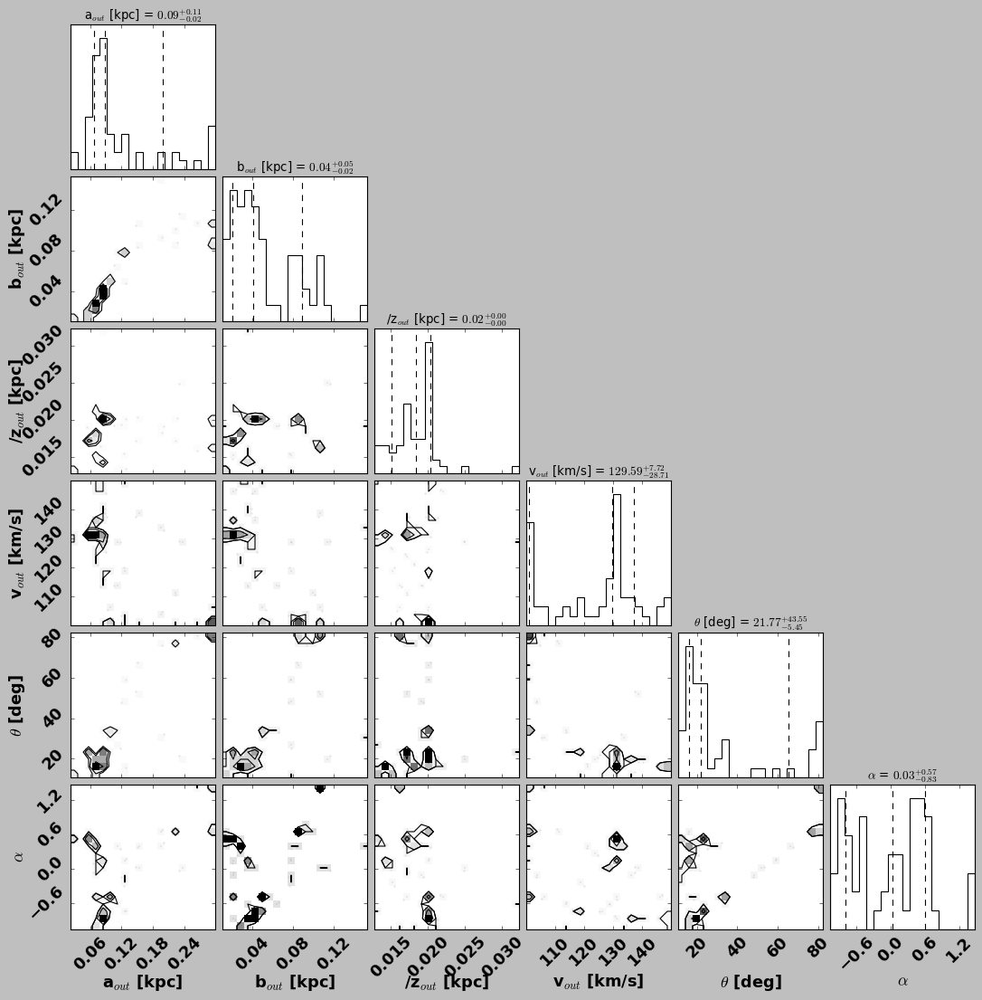

In [203]:
import corner


output_params = [a_out, b_out, z_out, v_out, theta_out, alpha_out]
output_param_name = ['a [kpc]', 'b [kpc]', 'z [kpc]', 'v [km/s]', r'$\theta$ [deg]', r'$\alpha$']

# Define redchisq bin masks
redchisq = np.asarray(redchisq)  # ensure it's a NumPy array
bins = [
    #(redchisq <= 12),                          # 10–12
    (redchisq > 1) & (redchisq <= 3),        # 12–14
    #(redchisq > 14) & (redchisq <= 16)         # 14–16
]
bin_labels = [
    #'10 < redchisq < 12',
    '1 < redchisq < 3',
    #'14 < redchisq < 16'
]


figure = corner.corner(
    np.asarray(output_params).T,
    labels=[
        r'a$_{out}$ [kpc]',
        r'b$_{out}$ [kpc]',
        r'/z$_{out}$ [kpc]',
        r'v$_{out}$ [km/s]',
        r'$\theta$ [deg]',
        r'$\alpha$'
    ],
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_kwargs={"fontsize": 12},
)

